| Name | Admin No | Class |
| --- | --- | --- |
| Goh Rui Zhuo | 2222329 | DAAA/2A/05 |

# __Forecasting: Energy Consumption__ #

<a class="anchor" id="1"></a>
## <font color='#71a1e3'> __Problem Statement__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">


#### __How can I accurately predict the values ?__

<a class="anchor" id="2"></a>
## <font color='#71a1e3'>__Background research__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">

In terms of energy consumption
  - Singapore’s total electricity consumption increased by 5.3%, from 50.8 TWh in 2020 to 53.5 TWh in 2021
    - Increased in tandem with the Gross Domestic Product (GDP), which `rose from SGD 461.06* billion in 2020 to SGD 496.16* billion in 2021`

  - All sectors saw a growth in electricity consumption in 2021, with the Information and Communications sector having the largest percentage growth of 30.7%, followed by the Construction sector of 22%

  - The   `Industrial-related sector` remained the largest consumer of electricity in 2021 (41.7% or 22.3 TWh), followed by Commerce & Services-related (37.1% or 19.8 TWh) and Household (15.5% or 8.3 TWh) sectors


In terms of water consumption
  - Household water consumption is on the rise again for the second year in a row, with `each person in Singapore using 158 litres of water a day` in 2021, up from 154 litres in 2020

  - In 2018 and 2019, the per capita daily use of water in the domestic sector was 141 litres - the lowest since 2015's 151 litre

![Water](water.jpg)



<a class="anchor" id="3"></a>
## <font color='#71a1e3'>__Import Libraries__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">

Here is to import all the necessary libraries 

In [1]:
!pip install pandas_profiling

'pip' is not recognized as an internal or external command,
operable program or batch file.


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from pandas_profiling import ProfileReport
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import warnings
from itertools import product
from termcolor import colored
import itertools
from tqdm import tqdm
plt.style.use("ggplot")
warnings.filterwarnings('ignore')
from collections import defaultdict 
random = np.random.RandomState(42)

C:\Users\ruizh\AppData\Local\Temp\ipykernel_41888\3274972435.py:5: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [3]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_percentage_error,mean_absolute_error, mean_squared_error,r2_score
import pickle

In [4]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.stattools import adfuller,kpss
from statsmodels.tsa.api import VAR
from statsmodels.stats.stattools import durbin_watson
from statsmodels.tsa.holtwinters import ExponentialSmoothing, Holt, SimpleExpSmoothing


<a class="anchor" id="4"></a>
## <font color='#71a1e3'>__Import dataset__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">

Here is to import the dataset and proceed to do analysis on it

In [5]:
df = pd.read_csv('Energy Consumption Dataset.csv')
df

,DATE,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
0,1/1/1990,18.0,725.1,548.8
1,1/2/1990,15.8,706.7,640.7
2,1/3/1990,17.3,624.5,511.1
3,1/4/1990,18.9,574.7,515.3
4,1/5/1990,22.0,553.2,488.4
...,...,...,...,...
392,1/9/2022,27.7,986.2,513.3
393,1/10/2022,31.8,936.1,373.1
394,1/11/2022,31.0,973.4,343.9
395,1/12/2022,32.4,1147.2,348.3


Dataset contains:

- `DATE`: Date from 1990 to 2023 by day and month
- `Gas Consumption (tons)`: Gas Consumption in tons
- `Electricity Consumption (MWh)`: Energy consumption in MWh
- `Water Consumption (tons)`: Water consumption in tons

<a class="anchor" id="5"></a>
## <font color='#71a1e3'>__Exploratory Data Analysis__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">

Here we will do an analysis on the dataset to tell us about the characteristics of it

### General Info

Here we will find out the general info of the dataset

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 397 entries, 0 to 396
Data columns (total 4 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   DATE                           397 non-null    object 
 1   Gas Consumption (tons)         397 non-null    float64
 2   Electricity Consumption (MWh)  397 non-null    float64
 3   Water Consumption (tons)       397 non-null    float64
dtypes: float64(3), object(1)
memory usage: 12.5+ KB


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>
  <li>From the above dataset, we can conclude that there is `anomaly dtype`  in the dataset</li>
<li>From the above info, dataset contains</li>



| Column Name | Dtype | Meaning |
| :-: | :-: | :-: |
| Date | Date | Date collated in mm/dd/yy format |
| Gas Consumption (tons) | Nominal | Gas Comsumption in tons |
| Electricity Consumption (MWh) | Nominal | Electricity consumption in MWh |
| Water Consumption (tons) | Nominal | Amount of water consume in tons |
</div>

### Null values check

Here we find out the null values of the dataset if any

In [7]:
df.isnull().sum()

DATE                             0
Gas Consumption (tons)           0
Electricity Consumption (MWh)    0
Water Consumption (tons)         0
dtype: int64

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>
  <li>From the above dataset, we can conclude that there is <mark>null values</mark> in the dataset</li>
  
</ul>
</div>

### Further Analysis

Here we find out how is the distribution of the data like

In [8]:
df.describe()

,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
count,397.000000,397.000000,397.000000
mean,23.785139,888.472544,484.953652
std,4.903452,153.877594,133.908863
min,11.600000,553.200000,44.400000
25%,20.200000,771.100000,384.400000
50%,23.500000,897.800000,487.400000
75%,27.900000,1005.200000,580.200000
max,46.000000,1294.000000,811.000000


<div class="alert alert-block"
style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>
  <li>From the above result, we can see that there is no obvious anomalies in the distribution</li>
  
</ul>
</div>

### Analysis on numerical data

Here we will analysis on the numerical data to find out more on each columns

Let's define the num_cols for further analysis



In [9]:
num_cols = [col for col in df.columns if str(df[col].dtype) =='float64']
print(f'The numerical features are \n {num_cols}')

The numerical features are 
 ['Gas Consumption (tons)', 'Electricity Consumption (MWh)', 'Water Consumption (tons)']


> Define the class for numerical analysis

In [10]:
class numericAnalyser:
    def __init__(self):
        pass

    def numPlot(self, col):
        fig, ax = plt.subplots(2, 1, figsize=(12, 12))
        fig.suptitle('Analysis on numerical columns',size=20,color='darkblue')
        fig.set_facecolor('lightgray')
        ax[0].title.set_text(f'Boxplot of {col}')
        ax[1].title.set_text(f'Distribution of {col}')
        sns.boxplot(x=col, data=df,ax=ax[0])
        sns.histplot(x=col,
                     data=df,
                     stat='density',
                     bins=50,
                     kde=True,
                     line_kws={'color': 'red', 'linewidth': 3}, ax=ax[1])
        plt.show()
    def ratio(self,col1,col2,ax):
        ax.hist(df[col1],alpha=0.5,bins=10)
        ax.hist(df[col2],alpha=0.5,bins=10)
        ax.set_title(f'{col1} vs {col2}')
    def numTarget(self,cols):
    # Each columns with respect to target variable
        for i in cols:
            fig, ax = plt.subplots(1, 1, figsize=(15, 8))
            fig.set_facecolor('#5ea886')
            fig.suptitle(f'Analysis on {i}',size=20,color='darkblue')
            sns.boxplot(x=i, y="Gender", data=df, ax=ax)
            plt.show()

numFunc = numericAnalyser()

Run the full analysis here

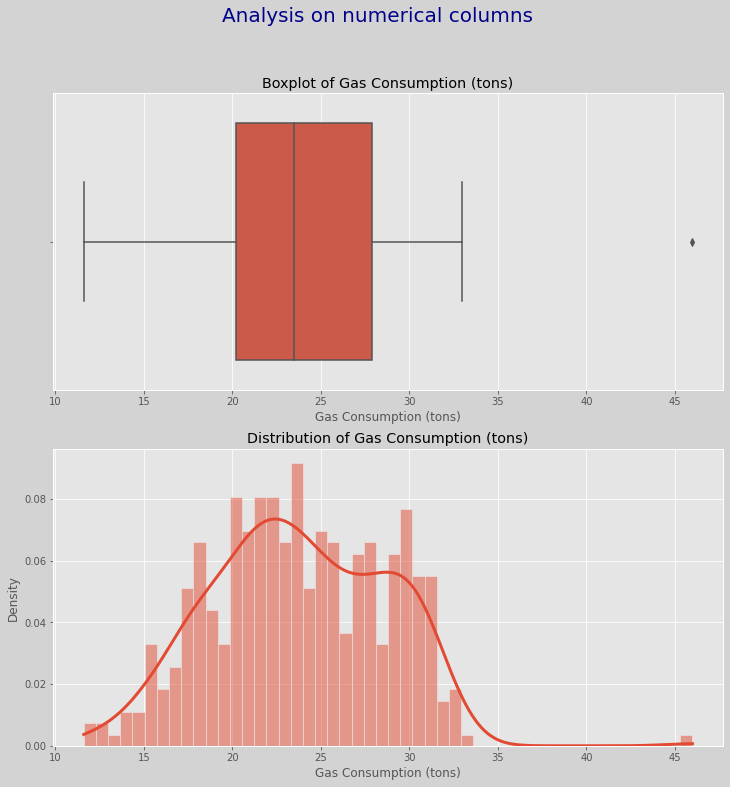

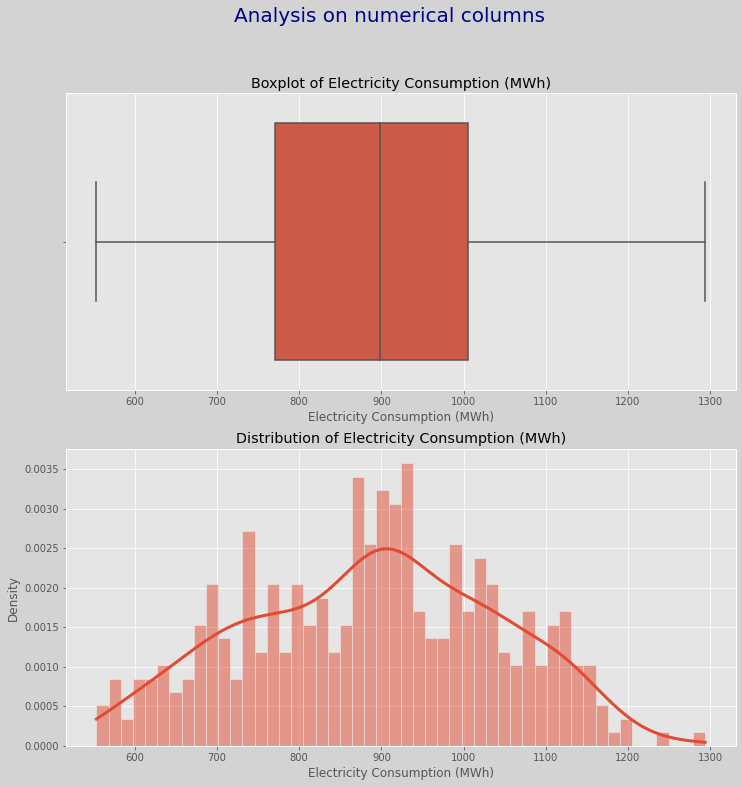

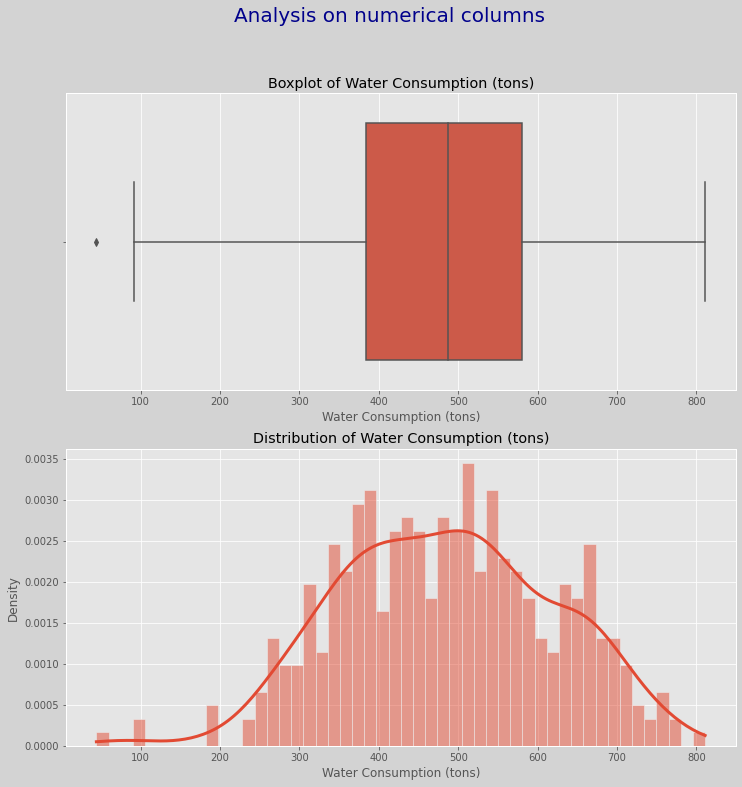

In [11]:
for col in num_cols:
    numFunc.numPlot(col)

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>
  <li> For <mark>Gas Consumption</mark>, we do see that there is an outlier. In terms of distribution, gas consumption is negatively skewed with median at around 23 tons over the years
  
  <ul><li> From the histogram, we can see the same result and a outlier value at 45 tons</li></ul>
  <li> For <mark>Electricity Consumption</mark>, we do see that there is no outlier. In terms of distribution, Electricity consumption is negatively skewed with median at around 900 MWh over the years
  <ul><li> From the histogram, we can see the same result</li></ul>
  <li> For <mark>Water Consumption</mark>, we do see that there is an outlier. In terms of distribution, Water consumption is negatively skewed with median at around 500 tons over the years
  <ul><li> From the histogram, we can see the same result and a outlier value at less than 100 tons</li></ul>
  
</ul>
</div>

### Outlier Analysis

Outlier is when the values is below  the lower fence and above the above fence

Below is the function to detect outlier

In [12]:
class OutlierAnalysis:
    def __init__(self):
        pass
    def outliers_plot(self,df,feature,ax,ax2):
        ax.scatter(x=outliers[outliers['Columns'] == feature]['DATE'], y=outliers[outliers['Columns'] == feature][feature], color='b')
        df.plot(y = feature, title=f'Plot Outlier for {feature}',ax=ax)
        ax2.boxplot(df[feature], vert=False)
        ax2.set_title('Boxplot of Time Series Data')
        ax2.set_xlabel('Gas Consumption (tons)')

    def outlierDetection(self, df, var: str, sort: bool = True):
        #detect outlier
        Q3 = df[var].quantile(0.75)
        Q1 = df[var].quantile(0.25)
        IQR = Q3 - Q1
        UpperFence = Q3 + 1.5 * IQR
        LowerFence = Q1 - 1.5 * IQR
        mask = (df[var] > UpperFence) | (df[var] < LowerFence)
        outlier = df[mask]
        non_outlier = df[~mask]
        if len(outlier) == 0:
            print("No Outliers")
        else:
            #print outlier if there is
            print("Outliers in Series (First 5)")
            display(outlier.head(100))
            print("No. of Outliers:", len(outlier))
        if sort:
            return outlier.sort_values(var),non_outlier.sort_values(var)
        else:
            return outlier,non_outlier
outliersfunc = OutlierAnalysis()

#### Detect where the outliers is

Below is to detect where in the dataset did the outlier occur



In [13]:
outliers = pd.DataFrame(columns=['Columns']+list(df.columns))
for feature in num_cols:
    print('For',colored(f' {feature}:','green'))
    result = outliersfunc.outlierDetection(df,f'{feature}')
    new_row = result[0].to_dict(orient = 'records')
    if len(new_row) > 0:
        x = new_row[0]
        print(x)
        x['Columns'] = feature
        outliers = outliers.append(x,ignore_index=True)
    else:
        pass
outliers

For  Gas Consumption (tons):
Outliers in Series (First 5)


,DATE,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
289,1/2/2014,46.0,1044.2,44.4


No. of Outliers: 1
{'DATE': '1/2/2014', 'Gas Consumption (tons)': 46.0, 'Electricity Consumption (MWh)': 1044.2, 'Water Consumption (tons)': 44.4}
For  Electricity Consumption (MWh):
No Outliers
For  Water Consumption (tons):
Outliers in Series (First 5)


,DATE,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
289,1/2/2014,46.0,1044.2,44.4


No. of Outliers: 1
{'DATE': '1/2/2014', 'Gas Consumption (tons)': 46.0, 'Electricity Consumption (MWh)': 1044.2, 'Water Consumption (tons)': 44.4}


,Columns,DATE,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
0,Gas Consumption (tons),1/2/2014,46.0,1044.2,44.4
1,Water Consumption (tons),1/2/2014,46.0,1044.2,44.4


#### Outliers plot

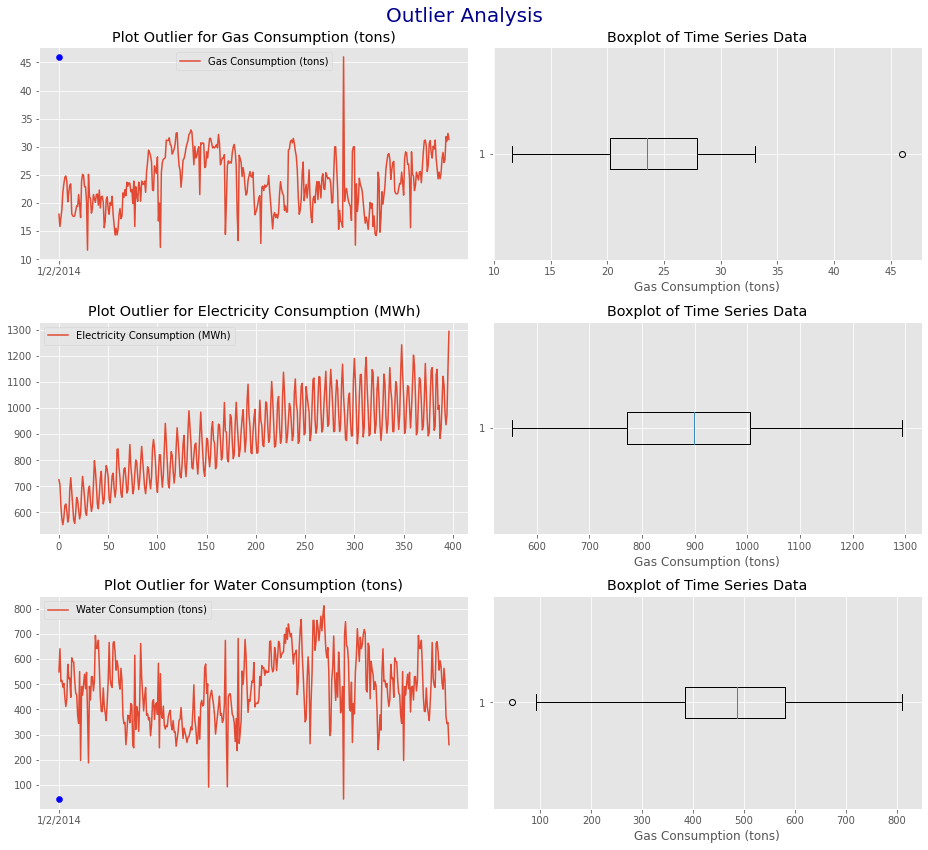

In [14]:
fig,ax = plt.subplots(3,2,figsize=(13,12))
fig.suptitle('Outlier Analysis',size=20,color='darkblue')
index = 0
for i in num_cols:
    outliersfunc.outliers_plot(df,i,ax[index,0],ax[index,1])
    index+=1
plt.tight_layout()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>
  <li> We do see that the outlier is all on one row and only Gas Consumption and Water Consumption are affected by the outlier </li>
  
</ul>
</div>

#### Settling the outlier

Options to consider
1. Imputing
    - Imputing either a mean of the value or the median
2. Dropping the row
   - Dropping the row and essentially removing the day from the dataet
3. Interpolating (Selected with forward fill)
    - Interpolating either with backwards fill or forward fill

In [15]:
df_interpolate = df.copy()

In [16]:
df_interpolate = df_interpolate.replace({46.0: np.NaN,44.4:np.NaN}) 
df_interpolate
df_interpolate = df_interpolate.sort_index().fillna(method='ffill')
df_interpolate

,DATE,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
0,1/1/1990,18.0,725.1,548.8
1,1/2/1990,15.8,706.7,640.7
2,1/3/1990,17.3,624.5,511.1
3,1/4/1990,18.9,574.7,515.3
4,1/5/1990,22.0,553.2,488.4
...,...,...,...,...
392,1/9/2022,27.7,986.2,513.3
393,1/10/2022,31.8,936.1,373.1
394,1/11/2022,31.0,973.4,343.9
395,1/12/2022,32.4,1147.2,348.3


### Anlysis on different time frame
(Time series visualisation)

Here we analysis on year to year, month to month difference

In [17]:
df['DATE'] = pd.to_datetime(df['DATE'],format="%d/%m/%Y")
df

,DATE,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
0,1990-01-01,18.0,725.1,548.8
1,1990-02-01,15.8,706.7,640.7
2,1990-03-01,17.3,624.5,511.1
3,1990-04-01,18.9,574.7,515.3
4,1990-05-01,22.0,553.2,488.4
...,...,...,...,...
392,2022-09-01,27.7,986.2,513.3
393,2022-10-01,31.8,936.1,373.1
394,2022-11-01,31.0,973.4,343.9
395,2022-12-01,32.4,1147.2,348.3


In [18]:
df_copy = df.copy()
df_copy = df_copy.set_index('DATE')
df_copy

,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
DATE,,,
1990-01-01,18.0,725.1,548.8
1990-02-01,15.8,706.7,640.7
1990-03-01,17.3,624.5,511.1
1990-04-01,18.9,574.7,515.3
1990-05-01,22.0,553.2,488.4
...,...,...,...
2022-09-01,27.7,986.2,513.3
2022-10-01,31.8,936.1,373.1
2022-11-01,31.0,973.4,343.9


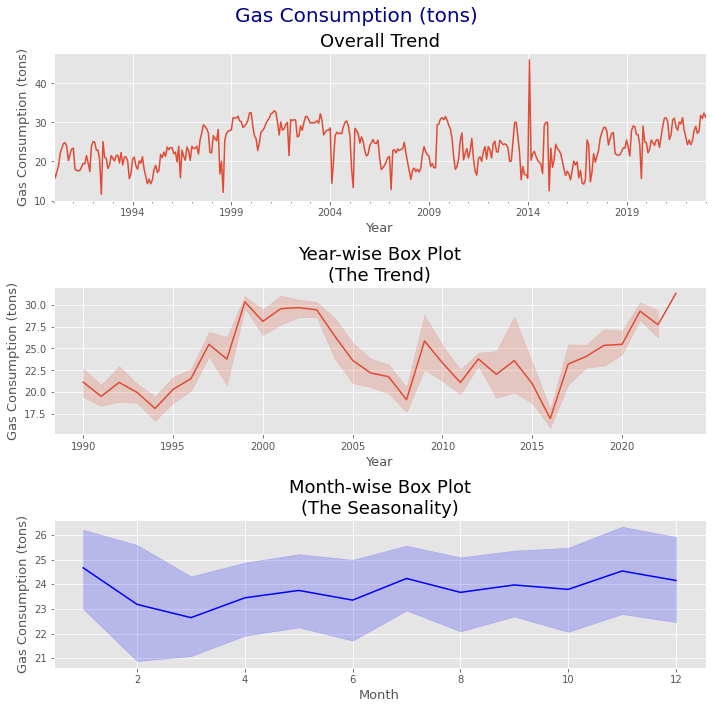

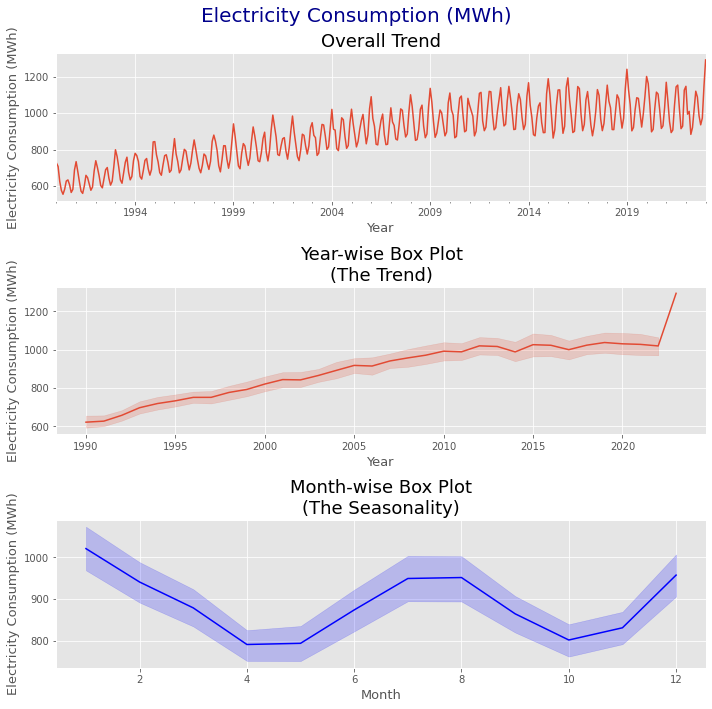

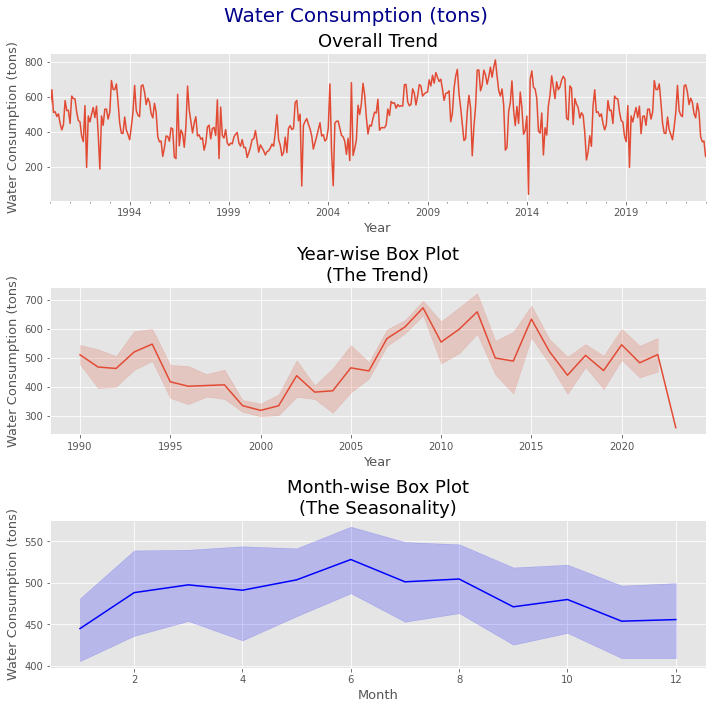

In [19]:
for i in num_cols:
    fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(10, 10))
    df_copy[i].plot(ax = ax[0])
    ax[0].set_title('Overall Trend', fontsize = 18, loc='center')
    ax[0].set_xlabel('Year', fontsize = 13)
    ax[0].set_ylabel(f'{i}', fontsize = 13)
    sns.lineplot(x = df_copy.index.year,y =  df_copy[i], ax=ax[1])
    ax[1].set_title('Year-wise Box Plot\n(The Trend)', fontsize = 18, loc='center')
    ax[1].set_xlabel('Year', fontsize = 13)
    ax[1].set_ylabel(f'{i}', fontsize = 13)
    sns.lineplot(x = df_copy.index.month, y = df_copy[i],color='blue', ax=ax[2])
    ax[2].set_title('Month-wise Box Plot\n(The Seasonality)', fontsize = 18, loc='center')
    ax[2].set_xlabel('Month', fontsize = 13)
    ax[2].set_ylabel(f'{i}', fontsize = 13)
    fig.suptitle(f'{i}',size=20,color='darkblue')
    plt.tight_layout()
    plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>
  <li> For <mark>Gas Consumption</mark>, we do see that there is multiple spikes with a huge spike in 2014
  
  <ul><li> From the yearly plot, we can see that 2016 is the lowest 1998 was the highest</li></ul>
  <ul><li> From the monthly plot, we can see that March is the lowest December was the highest</li></ul>
  <li> For <mark>Electricity Consumption</mark>, we can see that there are multiple spikes and overall an inreasing trend

  <ul><li> From the yearly plot, we can see that 1990 is the lowest 2020 was the highest</li></ul>
  <ul><li> From the monthly plot, we can see that April is the lowest Jan was the highest</li></ul>

  <li> For <mark>Water Consumption</mark>, we do see that there is multiple spikes with a huge spike in 2014
  <ul><li> From the yearly plot, we can see that 2000 is the lowest 2008 was the highest</li></ul>
  <ul><li> From the monthly plot, we can see that Jan is the lowest June was the highest</li></ul>
  
</ul>
</div>

#### Correlation Analysis

Analysis of correlation between numeric columns

Types of Correlation Analysis
1. Pearson
   - $r = \frac{{\sum{{(X - \bar{X})(Y - \bar{Y})}}}}{{\sqrt{{\sum{{(X - \bar{X})^2}} \sum{{(Y - \bar{Y})^2}}}}}}$
   - Measure of linear correlation between two different sets of data

2. Kendall 
   -  $
\tau = \frac{{\text{{Number of concordant pairs}} - \text{{Number of discordant pairs}}}}{{\text{{Total number of pairs}}}}
$
   - Measure the strength and direction of association between two different sets of data

3. Spearman
    - $\rho = 1 - \frac{{6 \sum d_i^2}}{{n(n^2 - 1)}} $
    - Allows for correlation between two different sets of data even though the relationship are not linear


Before all that, lets use the percentage change to avoid within series dependence

Original dataframe

,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
Gas Consumption (tons),1.000000,0.006170,-0.227091
Electricity Consumption (MWh),0.006170,1.000000,-0.038123
Water Consumption (tons),-0.227091,-0.038123,1.000000


,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
Gas Consumption (tons),1.000000,0.056093,-0.377881
Electricity Consumption (MWh),0.056093,1.000000,-0.018311
Water Consumption (tons),-0.377881,-0.018311,1.000000


,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
Gas Consumption (tons),1.000000,0.038571,-0.289752
Electricity Consumption (MWh),0.038571,1.000000,-0.011205
Water Consumption (tons),-0.289752,-0.011205,1.000000


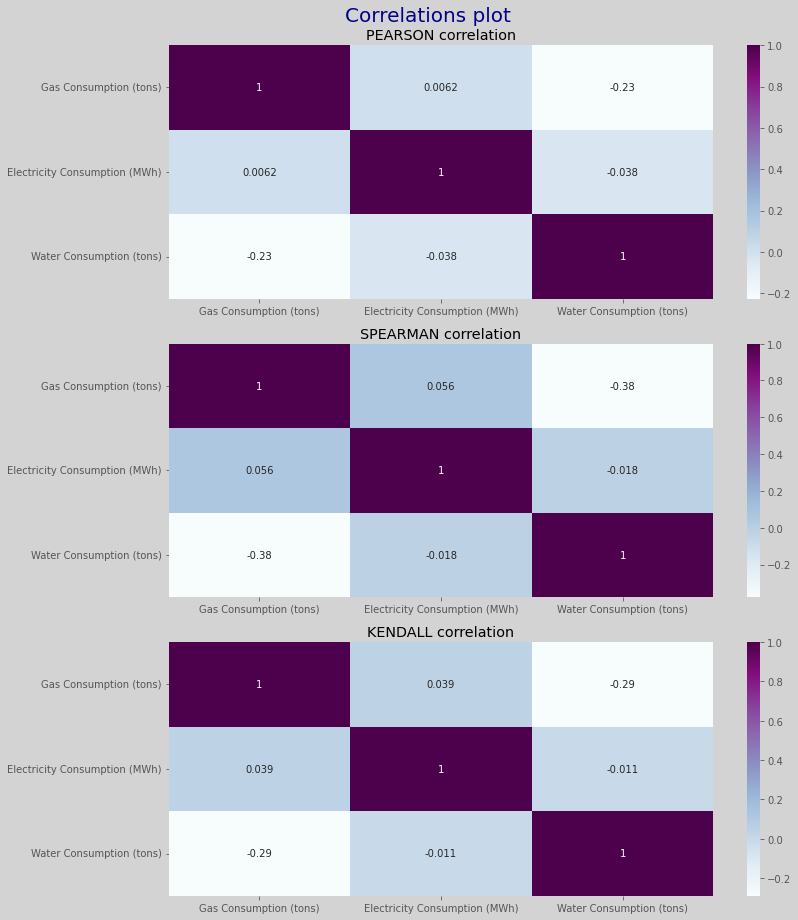

In [20]:
types = ['pearson','spearman','kendall']
fig,ax = plt.subplots(3,1,figsize=(12,13))
fig.suptitle('Correlations plot',size=20,color='darkblue')
fig.set_facecolor('lightgray')
index = 0
for tp in types:
  # Create the graph and dataframe
  ax[index].title.set_text(f'{tp.upper()} correlation')
  ax[index] = sns.heatmap(df[num_cols].pct_change().corr(method=tp), cmap="BuPu", annot=True,ax=ax[index])
  display(df[num_cols].pct_change().corr(method = tp).style.bar(color='green'))
  index +=1
plt.tight_layout()
plt.show()


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>
  <li> No significant correlation between the three variables for the three different correlation test above</li>
  

  
</ul>
</div>

Interpolated dataframe

,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
Gas Consumption (tons),1.000000,0.032519,-0.185176
Electricity Consumption (MWh),0.032519,1.000000,-0.015420
Water Consumption (tons),-0.185176,-0.015420,1.000000


,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
Gas Consumption (tons),1.000000,0.057302,-0.359700
Electricity Consumption (MWh),0.057302,1.000000,-0.024559
Water Consumption (tons),-0.359700,-0.024559,1.000000


,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
Gas Consumption (tons),1.000000,0.039238,-0.276946
Electricity Consumption (MWh),0.039238,1.000000,-0.015299
Water Consumption (tons),-0.276946,-0.015299,1.000000


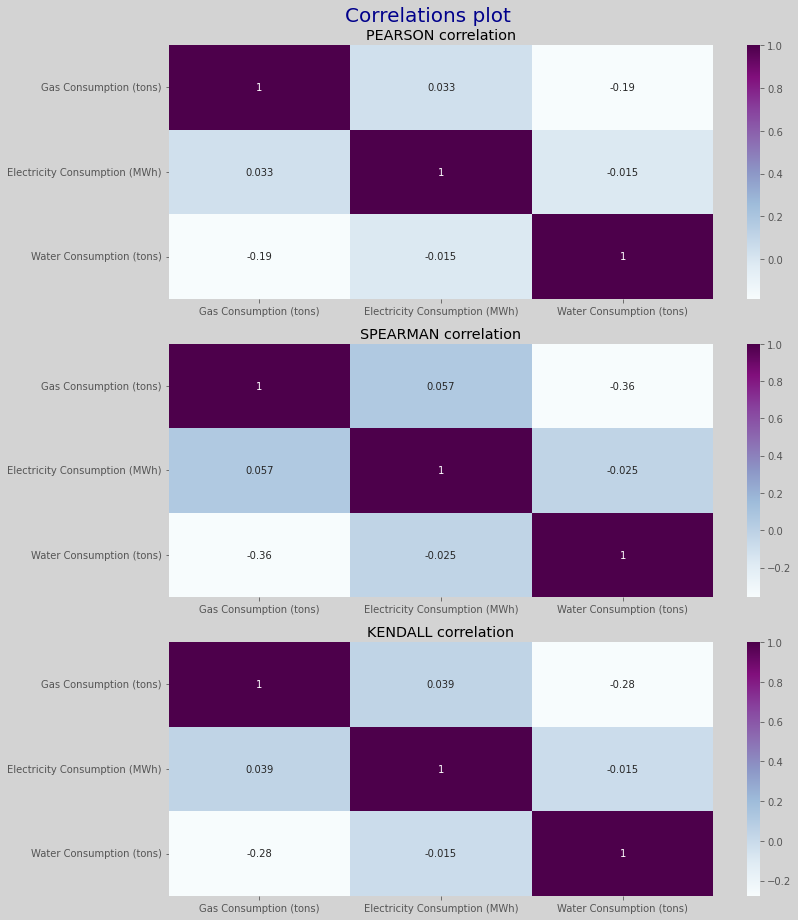

In [21]:
types = ['pearson','spearman','kendall']
fig,ax = plt.subplots(3,1,figsize=(12,13))
fig.suptitle('Correlations plot',size=20,color='darkblue')
fig.set_facecolor('lightgray')
index = 0
for tp in types:
  # Create the graph and dataframe
  ax[index].title.set_text(f'{tp.upper()} correlation')
  ax[index] = sns.heatmap(df_interpolate[num_cols].pct_change().corr(method=tp), cmap="BuPu", annot=True,ax=ax[index])
  display(df_interpolate[num_cols].pct_change().corr(method = tp).style.bar(color='green'))
  index +=1
plt.tight_layout()
plt.show()


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>
  <li> No significant correlation between the three variables for the three different correlation test above</li>
  

  
</ul>
</div>

<a class="anchor" id="5"></a>
## <font color='#71a1e3'>__Data Preprocessing (1)__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">

Here we will preprocess the data part 1

#### Change the dtype of date in original dataframe

Original dtype is in object 

In [22]:
df_set_date = df.copy()
df_set_date

,DATE,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
0,1990-01-01,18.0,725.1,548.8
1,1990-02-01,15.8,706.7,640.7
2,1990-03-01,17.3,624.5,511.1
3,1990-04-01,18.9,574.7,515.3
4,1990-05-01,22.0,553.2,488.4
...,...,...,...,...
392,2022-09-01,27.7,986.2,513.3
393,2022-10-01,31.8,936.1,373.1
394,2022-11-01,31.0,973.4,343.9
395,2022-12-01,32.4,1147.2,348.3


In [23]:
df_set_date['DATE'] = pd.to_datetime(df_set_date['DATE'],format="%d/%m/%Y")
df_set_date

,DATE,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
0,1990-01-01,18.0,725.1,548.8
1,1990-02-01,15.8,706.7,640.7
2,1990-03-01,17.3,624.5,511.1
3,1990-04-01,18.9,574.7,515.3
4,1990-05-01,22.0,553.2,488.4
...,...,...,...,...
392,2022-09-01,27.7,986.2,513.3
393,2022-10-01,31.8,936.1,373.1
394,2022-11-01,31.0,973.4,343.9
395,2022-12-01,32.4,1147.2,348.3


Setting the date to be the index

In [24]:
df_set_date = df_set_date.set_index('DATE')
df_set_date

,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
DATE,,,
1990-01-01,18.0,725.1,548.8
1990-02-01,15.8,706.7,640.7
1990-03-01,17.3,624.5,511.1
1990-04-01,18.9,574.7,515.3
1990-05-01,22.0,553.2,488.4
...,...,...,...
2022-09-01,27.7,986.2,513.3
2022-10-01,31.8,936.1,373.1
2022-11-01,31.0,973.4,343.9


Doing the same to the interpolated data

In [25]:
df_set_date_interpolate = df.copy()
df_set_date_interpolate

,DATE,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
0,1990-01-01,18.0,725.1,548.8
1,1990-02-01,15.8,706.7,640.7
2,1990-03-01,17.3,624.5,511.1
3,1990-04-01,18.9,574.7,515.3
4,1990-05-01,22.0,553.2,488.4
...,...,...,...,...
392,2022-09-01,27.7,986.2,513.3
393,2022-10-01,31.8,936.1,373.1
394,2022-11-01,31.0,973.4,343.9
395,2022-12-01,32.4,1147.2,348.3


In [26]:
df_set_date_interpolate['DATE'] = pd.to_datetime(df_set_date_interpolate['DATE'],format="%d/%m/%Y")
df_set_date_interpolate

,DATE,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
0,1990-01-01,18.0,725.1,548.8
1,1990-02-01,15.8,706.7,640.7
2,1990-03-01,17.3,624.5,511.1
3,1990-04-01,18.9,574.7,515.3
4,1990-05-01,22.0,553.2,488.4
...,...,...,...,...
392,2022-09-01,27.7,986.2,513.3
393,2022-10-01,31.8,936.1,373.1
394,2022-11-01,31.0,973.4,343.9
395,2022-12-01,32.4,1147.2,348.3


In [27]:
df_set_date_interpolate = df_set_date_interpolate.set_index('DATE')
df_set_date_interpolate

,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
DATE,,,
1990-01-01,18.0,725.1,548.8
1990-02-01,15.8,706.7,640.7
1990-03-01,17.3,624.5,511.1
1990-04-01,18.9,574.7,515.3
1990-05-01,22.0,553.2,488.4
...,...,...,...
2022-09-01,27.7,986.2,513.3
2022-10-01,31.8,936.1,373.1
2022-11-01,31.0,973.4,343.9


<a class="anchor" id="5"></a>
## <font color='#71a1e3'>__Time Series__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">

Here we will do an analysis and different test on the dataset

### Seasonal Decomposition

Seasonal Decomposition consist of three different components
1. Trend
   - This tells us the overall motion of the series, it can be increasing throughout the time period, decreasing or both
2. Seasonality
   -  Tell us about if there is any seasonal pattern occuring
3. Residual
   - Known as statistical noise

Different types of model
1. Additive
   - $Y =  S + T + R$
2. Multiplicative
   - $Y = T \times S \times R$
  
Types in statsmodel
1. STL (Choosen)
   - Seasonal and trend decomposition using Loess which handle any type of seasonality, ability to control the rate of change and robust to outliers
   - Does not assume a fix or known frequency in the data

2. Seasonal Decompose
   - Seasonal Decomposition of time series requires a specific model and does not offer as much flexibility
   - not robust to outliers in data
  


#### Seasonal-Trend decomposition using LOESS (STL)

In [28]:
def loops_sd2(df,title):
    for i in df.columns:
        plt.rc("figure", figsize=(10, 10))
        print(f'{title}', i)
        decomposition = STL(df[i], robust=True).fit()
        decomposition.plot()
        plt.show()


For original data

STL Decomposition for Column: Gas Consumption (tons)


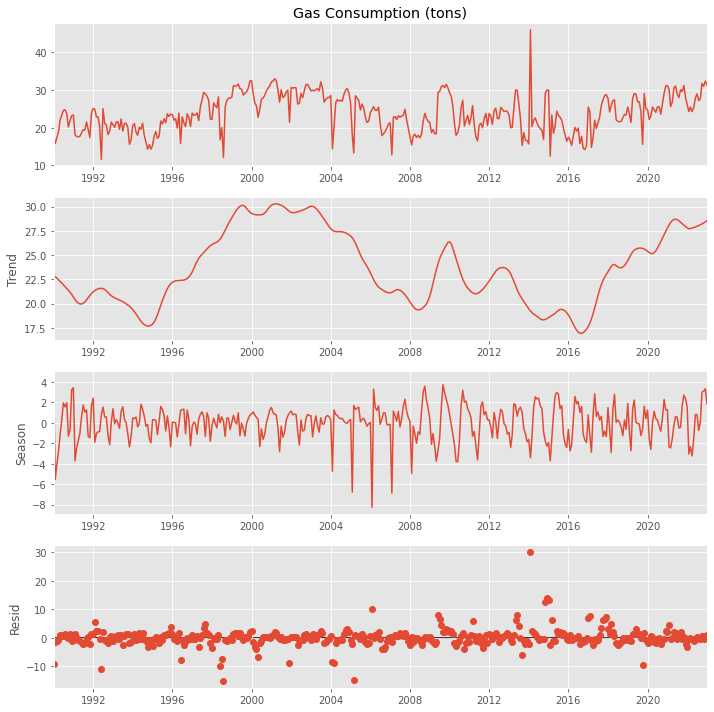

STL Decomposition for Column: Electricity Consumption (MWh)


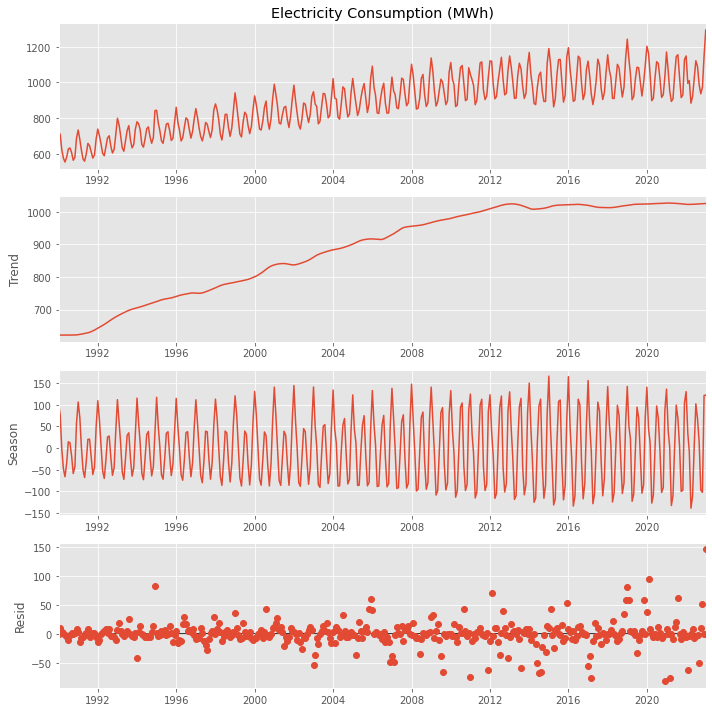

STL Decomposition for Column: Water Consumption (tons)


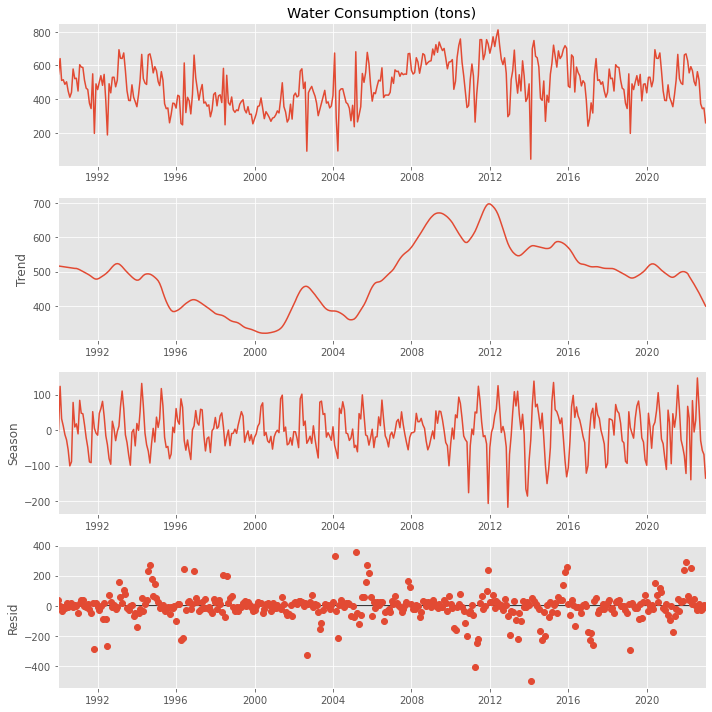

In [29]:
loops_sd2(df_set_date,'STL Decomposition for Column:')

For interpolated data

(Interpolated data) STL Decomposition for Column: Gas Consumption (tons)


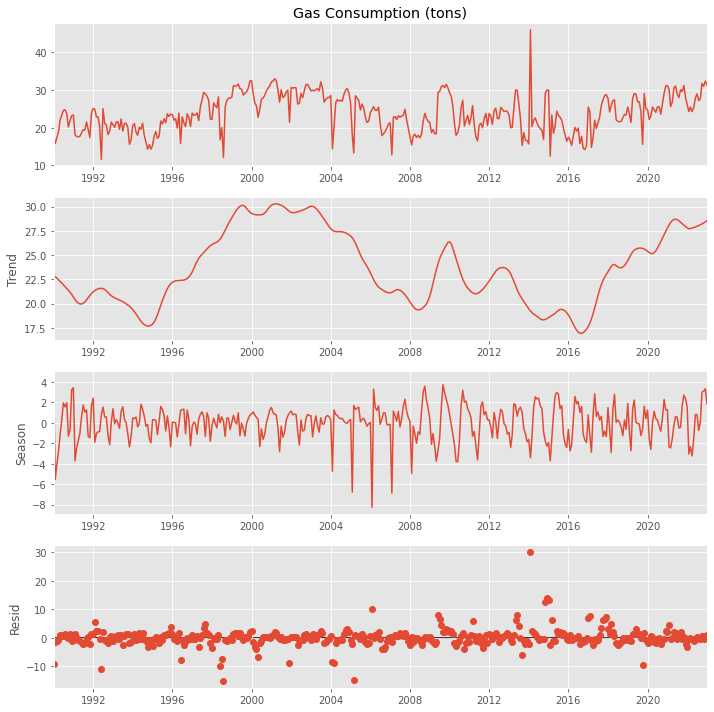

(Interpolated data) STL Decomposition for Column: Electricity Consumption (MWh)


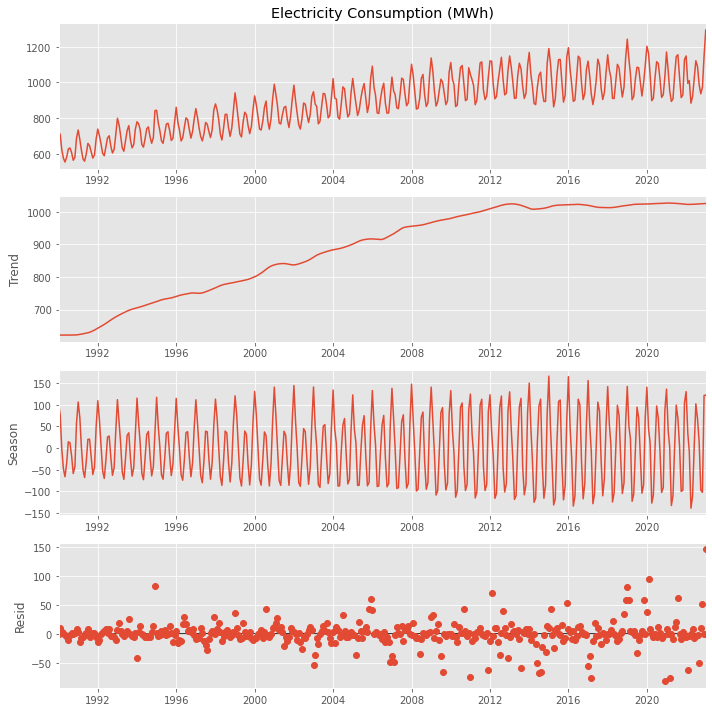

(Interpolated data) STL Decomposition for Column: Water Consumption (tons)


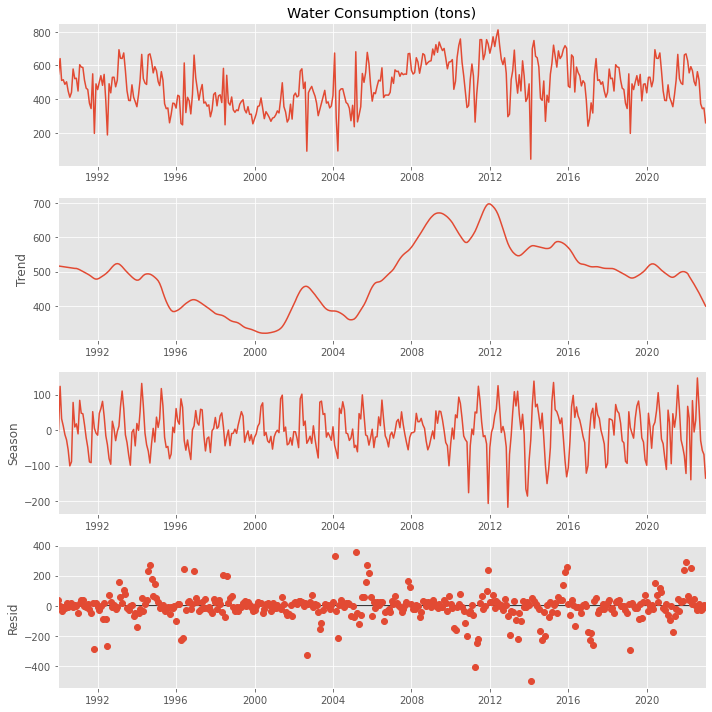

In [30]:
loops_sd2(df_set_date_interpolate,'(Interpolated data) STL Decomposition for Column:')

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the plots
<ul>
  <li> For <mark>Gas Consumption</mark>, we do see that there is no obvious linear trend in the data
  
  <ul><li> From the seasonality plot, we can see that there is a weak seasonality in the data</li></ul>
    <ul><li> Mean and variance is not consistent throughout the years as it is lower during 2000-2004</li></ul>

  <li> For <mark>Electricity Consumption</mark>, we can see that there is an inreasing trend

  <ul><li> From the seasonality plot, we can see that there is a strong seasonality in the data</li></ul>
    <ul><li> Mean and variance is not consistent throughout the years</li></ul>

  <li> For <mark>Water Consumption</mark>, we do see that there is no strong trend
  <ul><li>From the seasonality plot, we can see that there is a strong seasonality in the data</li></ul>
      <ul><li> Mean is not consistant but variance is consistent throughout the years</li></ul>
  
</ul>
</div>

### Stationality Test

- Stationary time series is one whose properties do not depend on the time at which the series is observed,thus, time series with trends, or with seasonality, are not stationary 
  - The trend and seasonality will affect the value of the time series at different times. On the other hand, a white noise series is stationary 

Before we do any test, let us analysis the mean and variance using a plot

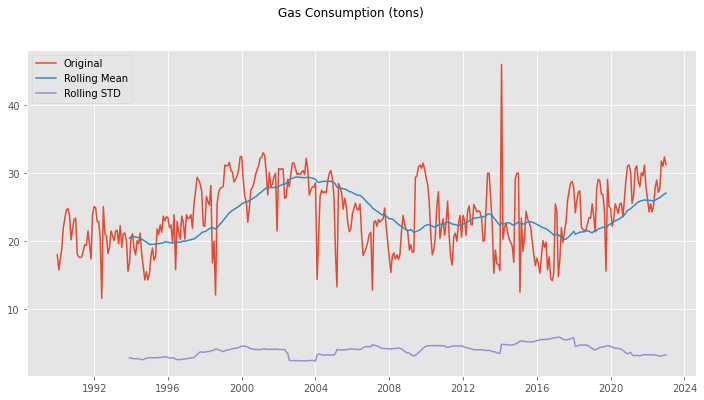

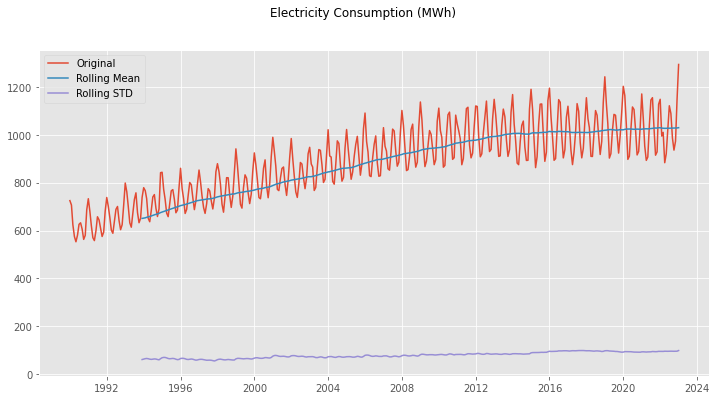

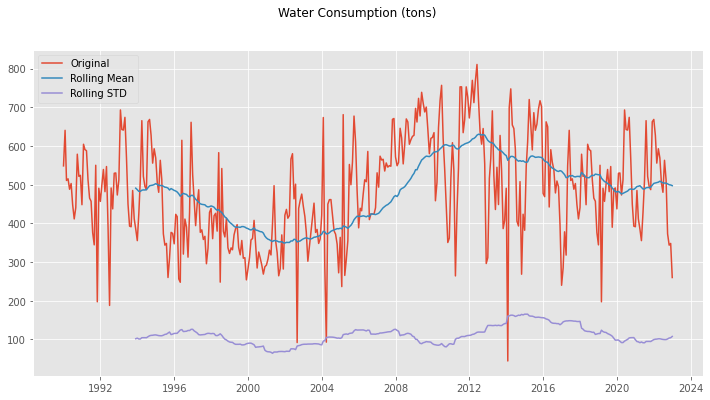

In [31]:
def plot_test(df, window, cols):
    df = df.copy()
    std_rolling = df.rolling(window=window).std()
    mean_rolling = df.rolling(window=window).mean()
    fig, ax = plt.subplots(figsize=(12, 6), facecolor='w')
    ax.plot(df, label='Original')
    ax.plot(mean_rolling, label='Rolling Mean')
    ax.plot(std_rolling,  label='Rolling STD')
    ax.legend(loc='upper left')
    fig.suptitle(f'{cols}')
    plt.show()


for col in num_cols:
    plot_test(df_set_date[col], 48, col)


Doing the same for the interpolated data

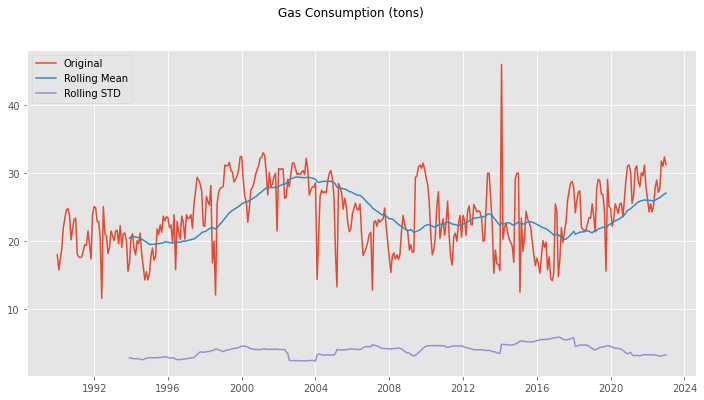

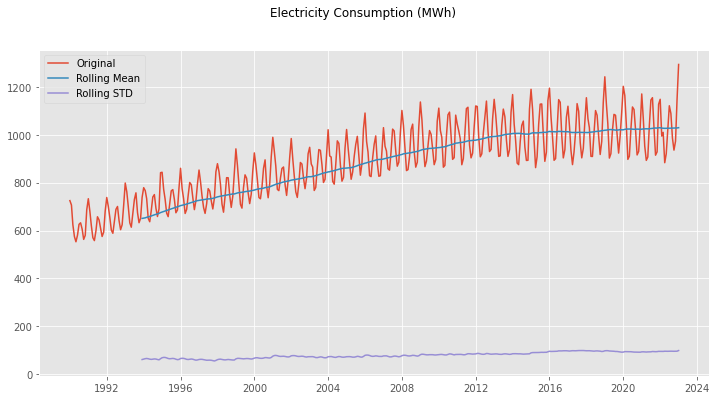

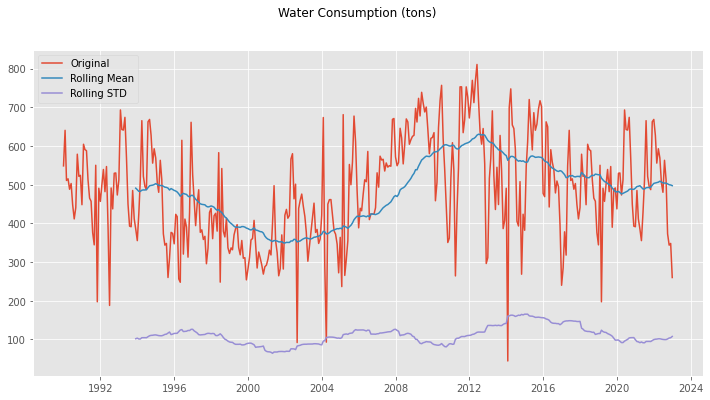

In [32]:
for col in num_cols:
    plot_test(df_set_date_interpolate[col], 48, col)

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
<ul>
  <li> For <mark>Gas Consumption</mark>, we can see that the mean and varience are consistent

  <li> For <mark>Electricity Consumption</mark>,we can see that the mean and varience are not consistent

  <li> For <mark>Water Consumption</mark>, we can see that the mean and varience are consistent
  
</ul>
</div>

#### Augmented Dickey-Fuller (ADF) Test for stationality

Consist of testing the null hypothesis that u = 1. 

U stands for unit root which stands for non-stationairy 

Following hypothesis test:

- Null Hypothesis ($H_O$): Series is non-stationary, or series has a unit root.
- Alternate Hypothesis($H_1$): Series is stationary, or series has no unit root.

In [33]:
def test_adf(df, feature):
    results = adfuller(df.values, autolag="AIC")

    adf_statistic = results[0]
    p_value = results[1]
    no_lags = results[2]

    print('ADF Statistics: %f' % adf_statistic)
    print('p-value: %f' % p_value)
    print(f'No of Lags {no_lags}')
    print('Critical values:')
    for key, value in results[4].items():
        print('\t%s: %.3f' % (key, value))

    if p_value < 0.05:
        print('Summary:')
        print('P-Value < 0.05')
        print(feature, colored('is Stationary\n', 'green'))
    else:
        print('Summary:')
        print('P-Value > 0.05')
        print(feature, colored('is not Stationary\n', 'red'))


Let's run the adf test below for each colunns

In [34]:
count = 1
for feature in num_cols:
    print(f'{count}. ADF test for stationality:',
          (colored(feature+'\n', 'green')))
    test_adf(df[feature], feature)
    count += 1


1. ADF test for stationality: Gas Consumption (tons)

ADF Statistics: -3.404374
p-value: 0.010811
No of Lags 6
Critical values:
	1%: -3.447
	5%: -2.869
	10%: -2.571
Summary:
P-Value < 0.05
Gas Consumption (tons) is Stationary

2. ADF test for stationality: Electricity Consumption (MWh)

ADF Statistics: -2.256981
p-value: 0.186218
No of Lags 15
Critical values:
	1%: -3.448
	5%: -2.869
	10%: -2.571
Summary:
P-Value > 0.05
Electricity Consumption (MWh) is not Stationary

3. ADF test for stationality: Water Consumption (tons)

ADF Statistics: -4.684846
p-value: 0.000090
No of Lags 4
Critical values:
	1%: -3.447
	5%: -2.869
	10%: -2.571
Summary:
P-Value < 0.05
Water Consumption (tons) is Stationary



Doing the same for the interpolated data

In [35]:
count = 1
for feature in num_cols:
    print(f'{count}. ADF test for stationality:',
          (colored(feature+'\n', 'green')))
    test_adf(df_interpolate[feature], feature)
    count += 1


1. ADF test for stationality: Gas Consumption (tons)

ADF Statistics: -3.697062
p-value: 0.004155
No of Lags 5
Critical values:
	1%: -3.447
	5%: -2.869
	10%: -2.571
Summary:
P-Value < 0.05
Gas Consumption (tons) is Stationary

2. ADF test for stationality: Electricity Consumption (MWh)

ADF Statistics: -2.256981
p-value: 0.186218
No of Lags 15
Critical values:
	1%: -3.448
	5%: -2.869
	10%: -2.571
Summary:
P-Value > 0.05
Electricity Consumption (MWh) is not Stationary

3. ADF test for stationality: Water Consumption (tons)

ADF Statistics: -4.529633
p-value: 0.000174
No of Lags 4
Critical values:
	1%: -3.447
	5%: -2.869
	10%: -2.571
Summary:
P-Value < 0.05
Water Consumption (tons) is Stationary



<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the result above 
<ul>
  <li> For <mark>Gas Consumption</mark>, data is stationary

  <li> For <mark>Electricity Consumption</mark>, data is not stationary

  <li> For <mark>Water Consumption</mark>, data is stationary
  
</ul>
</div>

#### Kwiatkowski-Phillips-Schmidt-Shin (KPSS) Test for stationality

Used for testing a null hypothesis that an observable time series is stationary around a deterministic trend  against the alternative of $H_1$

The alternative hypothesis is different from adf 
   - therefore it can lead to misinterpretation which can easily go undetected 

--

- Null hypothesis ($H_0$): The time series is stationary because there is no unit root (if p-value > 0.05)
- Alternative hypothesis ($H_1$): The time series is not stationary because there is a unit root (if p-value ≤ 0.05)

In [36]:
def kpss_test(df, feature):
    statistic, p_value, n_lags, critical_values = kpss(df.values)
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'num lags: {n_lags}')
    print('Critial Values:')
    for key, value in critical_values.items():
        print(f'   {key} : {value}')
    if p_value > 0.05:
        print('Summary:')
        print('P-Value < 0.05')
        print(feature, colored('is Stationary\n', 'green'))
    else:
        print('Summary:')
        print('P-Value > 0.05')
        print(feature, colored('is not Stationary\n', 'red'))


For the original data

In [37]:
count2 = 1
for feature in num_cols:
    print(f'{count2}. KPSS test on stationality:',colored(feature + '\n','green'))
    kpss_test(df[feature],feature)
    count2+=1

1. KPSS test on stationality: Gas Consumption (tons)

KPSS Statistic: 0.3402153835554435
p-value: 0.1
num lags: 10
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Summary:
P-Value < 0.05
Gas Consumption (tons) is Stationary

2. KPSS test on stationality: Electricity Consumption (MWh)

KPSS Statistic: 3.531601452001429
p-value: 0.01
num lags: 10
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Summary:
P-Value > 0.05
Electricity Consumption (MWh) is not Stationary

3. KPSS test on stationality: Water Consumption (tons)

KPSS Statistic: 0.8388411776971113
p-value: 0.01
num lags: 10
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Summary:
P-Value > 0.05
Water Consumption (tons) is not Stationary



For the interpolated data

In [38]:
count2 = 1
for feature in num_cols:
    print(f'{count2}. KPSS test on stationality:',
          colored(feature + '\n', 'green'))
    kpss_test(df_interpolate[feature], feature)
    count2 += 1


1. KPSS test on stationality: Gas Consumption (tons)

KPSS Statistic: 0.3260209728421152
p-value: 0.1
num lags: 10
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Summary:
P-Value < 0.05
Gas Consumption (tons) is Stationary

2. KPSS test on stationality: Electricity Consumption (MWh)

KPSS Statistic: 3.531601452001429
p-value: 0.01
num lags: 10
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Summary:
P-Value > 0.05
Electricity Consumption (MWh) is not Stationary

3. KPSS test on stationality: Water Consumption (tons)

KPSS Statistic: 0.8723695601023694
p-value: 0.01
num lags: 10
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Summary:
P-Value > 0.05
Water Consumption (tons) is not Stationary



<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the result above 
<ul>
  <li> For <mark>Gas Consumption</mark>, data is stationary

  <li> For <mark>Electricity Consumption</mark>, data is not stationary

  <li> For <mark>Water Consumption</mark>, data is not stationary
  
</ul>

__Overall the both the result on either test are stating that Electrcity consumption and water consumption are not stationary__
</div>

<a class="anchor" id="5"></a>
## <font color='#71a1e3'>__Data Preprocessing (2)__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">

Here we will do a second data preprocessing

### Train Test Split

Here I will split the data 
- a 80 20 split where 80% will be the Train set while 20% will be the test 

In [39]:
test_sizes = 79

For the original dataframe

In [40]:
train_data = df_set_date.iloc[:-test_sizes]
test_data  = df_set_date.iloc[-test_sizes:]
display(train_data) ,display(test_data) 

,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
DATE,,,
1990-01-01,18.0,725.1,548.8
1990-02-01,15.8,706.7,640.7
1990-03-01,17.3,624.5,511.1
1990-04-01,18.9,574.7,515.3
1990-05-01,22.0,553.2,488.4
...,...,...,...
2016-02-01,16.7,1073.8,469.2
2016-03-01,15.3,991.0,662.7
2016-04-01,17.8,893.6,649.9


,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
DATE,,,
2016-07-01,19.9,1147.1,558.5
2016-08-01,15.8,1136.0,538.8
2016-09-01,17.7,994.7,478.8
2016-10-01,14.5,903.6,509.7
2016-11-01,14.2,938.1,494.8
...,...,...,...
2022-09-01,27.7,986.2,513.3
2022-10-01,31.8,936.1,373.1
2022-11-01,31.0,973.4,343.9


(None, None)

For the interpolated dataframe

In [41]:
train_data_interpolate = df_set_date_interpolate.iloc[:-test_sizes]
test_data_interpolate  = df_set_date_interpolate.iloc[-test_sizes:]
display(train_data_interpolate) ,display(test_data_interpolate) 

,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
DATE,,,
1990-01-01,18.0,725.1,548.8
1990-02-01,15.8,706.7,640.7
1990-03-01,17.3,624.5,511.1
1990-04-01,18.9,574.7,515.3
1990-05-01,22.0,553.2,488.4
...,...,...,...
2016-02-01,16.7,1073.8,469.2
2016-03-01,15.3,991.0,662.7
2016-04-01,17.8,893.6,649.9


,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
DATE,,,
2016-07-01,19.9,1147.1,558.5
2016-08-01,15.8,1136.0,538.8
2016-09-01,17.7,994.7,478.8
2016-10-01,14.5,903.6,509.7
2016-11-01,14.2,938.1,494.8
...,...,...,...
2022-09-01,27.7,986.2,513.3
2022-10-01,31.8,936.1,373.1
2022-11-01,31.0,973.4,343.9


(None, None)

<a class="anchor" id="5"></a>
## <font color='#71a1e3'>__Evaluation Metric__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">

Here we will conduct a baseline model

### Infomation on plot `diagnostic` tests

Explanation of each component in plot diagnostic

__Ljung Box test__
Defined as: $$Q = n(n+2)\times \frac{Σp_k^2} {(n-k)}$$

$H_0$: The data are independently distributed (i.e. the correlations in the population from which the sample is taken are 0, so that any observed correlations in the data result from randomness of the sampling process)

$H_1$: The data are not independently distributed; they exhibit serial correlation

__Jarque-Bera test__
Defined as the test for normality

$H_0$: Data is normal in distribution

$H_1$: Data is NOT normal in distribution

__Heteroskedasticity test__ 
Define as the test on error residuals whether they are homoscedastic or same variance

$H_0$: Residuals show variances

$H_1$: Residuals show no variances

### Main metrics

__Akaike information criterion (AIC)__
Mathematical method for evaluating how well a model fits the data it was generated from

Define as: $$AIC = 2\times{k} - 2\times{2ln(L)} $$

where `k` is the number of model parameters and `L` is the maximum value of the likelihood of the function

It is calculated base on
- number of independent variables used to build the model.
- maximum likelihood estimate of the model (how well the model reproduces the data)

The best-fit model according to AIC is the one that explains the greatest amount of variation using the fewest possible independent variables

__Bayesian Information Criterion (BIC)__
Closely related to AIC above

Define as $$BIC = ln(n)\times{k} - 2ln(L)$$

where `L` is the maximise value of the likelihood of the function, `n` is the number of data points and `k` is the number of model parameters

It resolves the overfitting issue by introducing penalty term for the number of parameters and the penalty term is larger in BIC than AIC

### Setting other evaluation metrics

- __Mean squared error__ 
  - Measures the average of the squares of the errors—that is, the average squared difference between the estimated values and the actual value. MSE is a risk function, corresponding to the expected value of the squared error loss
  - MSE is almost always strictly positive (and not zero) due to the randomness or because the estimator does not account for information that could produce a more accurate estimate
- __Root Mean Sqaure Error__  (Focus)
  - Root Mean Square Error (RMSE) is the standard deviation of the residuals (prediction errors). Residuals are a measure of how far from the regression line data points are; RMSE is a measure of how spread out these residuals are. In other words, it tells you how concentrated the data is around the line of best fit (From Statistics How To)
- __Mean Absolute Percentage Error__ (Focus)
  -  It measures this accuracy as a percentage, and can be calculated as the average absolute percent error for each time period minus actual values divided by actual


In [42]:
evaluation = [ "root_mean_squared_error", "mean_absolute_percentage_error"]

scores_num_cols = ['Consumption']
count = 1
for eval in evaluation:
    scores_num_cols.append(f'train_{eval}')
    scores_num_cols.append(f'test_{eval}')
scores_num_cols

['Consumption',
 'train_root_mean_squared_error',
 'test_root_mean_squared_error',
 'train_mean_absolute_percentage_error',
 'test_mean_absolute_percentage_error']

In [43]:
def evaulation_baseline(col,true_values, pred, types):
    mse = mean_squared_error(true_values, pred)
    mape = mean_absolute_percentage_error(true_values, pred)
    rmse = np.sqrt(mse)
    new_row = {'Consumption':col,  f'{types}_root_mean_squared_error': rmse, f'{types}_mean_absolute_percentage_error': mape}
    return new_row


In [44]:
def plot_forecast(ax, col, df,train_pred, test_pred, greyline):
    ax.plot(df[col],label='Actual', alpha=0.5)
    ax.plot(train_pred,label='Train', alpha=0.9)
    ax.plot(test_pred, label='Test', alpha=0.9)
    ax.plot(df[col].iloc[-test_sizes:], label='Actual', alpha=0.9)
    ax.set_title(col)
    ax.legend(loc='upper left')
    ax.axvline(x = greyline, color='k', linestyle='--', alpha=0.3)

<a class="anchor" id="5"></a>
## <font color='#71a1e3'>__Model (Baseline)__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">

Here we will conduct a baseline model

### Average Forecast

The model simply assumes that all future values are equal to the mean of all the previous observations

$$Y_T+h  = \frac{\sum_{t=1}^T  Y_t}{T}$$

Define the function

In [45]:
def average_forecast(scores_avg, train_data):
    for col in num_cols:
        avg_forecast = np.mean(train_data[col])
        prediction_train, predictions_test = np.full_like( train_data[col],avg_forecast), np.full_like( test_data[col], avg_forecast)
        predictions_test_df,predictions_train_df = pd.DataFrame(index = test_data.index),  pd.DataFrame(index = train_data.index)
        predictions_test_df[col] = predictions_test;   predictions_train_df[col] = prediction_train
        test_eval = (evaulation_baseline(col,test_data[col],predictions_test,'test'))
        train_eval = (evaulation_baseline(col,train_data[col],prediction_train,'train'))
        new_row = {**train_eval, **test_eval}
        scores_avg = scores_avg.append(new_row,ignore_index=True)
        full_data = np.array(list(prediction_train)+list(predictions_test))
        fig, ax = plt.subplots(figsize=(10,6))
        fig.set_facecolor('#b6dff0')
        plot_forecast(ax,col, df_set_date, predictions_train_df, predictions_test_df, train_data.index[-1] )
        plt.show()
    return scores_avg

##### Run the model on the original dataset


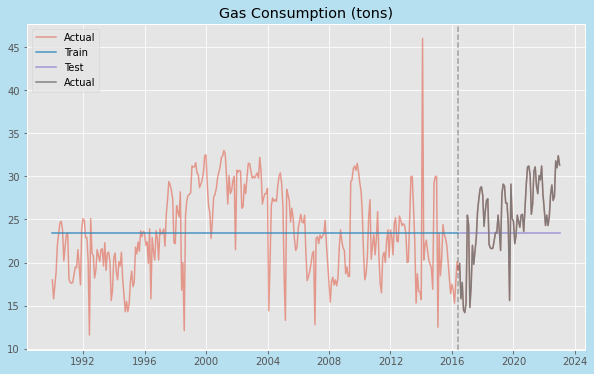

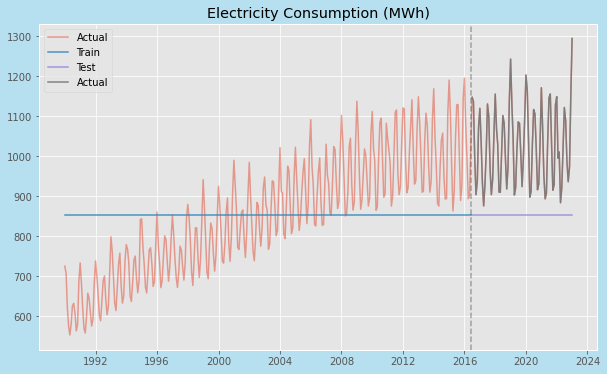

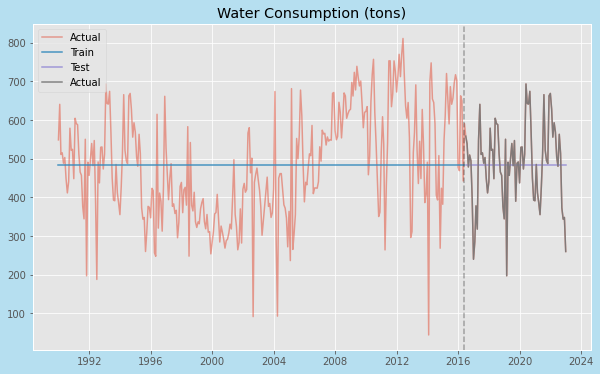

In [46]:
scores_avg = pd.DataFrame(columns=scores_num_cols)
scores_avg = average_forecast(scores_avg, train_data)

Run the evaluation metric for original dataframe

In [47]:
scores_avg.T.style.bar(color='green')

,0,1,2
Consumption,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
train_root_mean_squared_error,4.955261,145.665786,140.406189
test_root_mean_squared_error,4.722162,198.107174,102.638396
train_mean_absolute_percentage_error,0.185262,0.148233,0.317803
test_mean_absolute_percentage_error,0.163215,0.161372,0.187517


##### For interpolated data

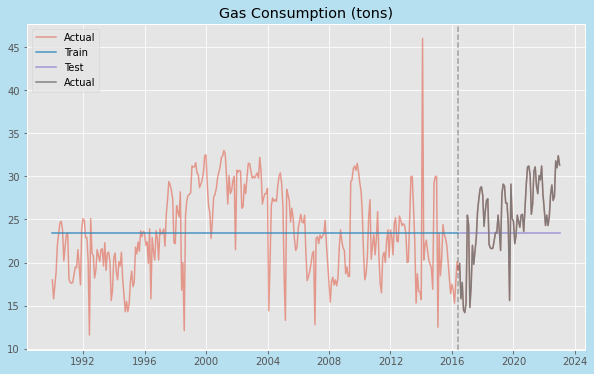

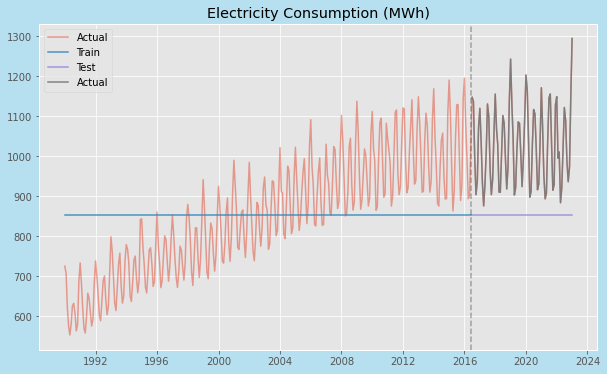

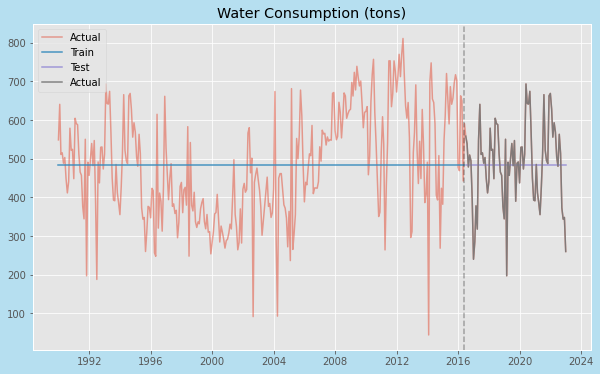

In [48]:
scores_avg_interpolate = pd.DataFrame(columns=scores_num_cols)
scores_avg_interpolate = average_forecast(scores_avg_interpolate, train_data_interpolate)

In [49]:
scores_avg_interpolate.T.style.bar(color='green')

,0,1,2
Consumption,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
train_root_mean_squared_error,4.955261,145.665786,140.406189
test_root_mean_squared_error,4.722162,198.107174,102.638396
train_mean_absolute_percentage_error,0.185262,0.148233,0.317803
test_mean_absolute_percentage_error,0.163215,0.161372,0.187517


##### Compare the difference in scores

In [50]:
(scores_avg_interpolate.loc[:, 'train_root_mean_squared_error':'test_mean_absolute_percentage_error'] -
 scores_avg.loc[:, 'train_root_mean_squared_error':'test_mean_absolute_percentage_error']).T


,0,1,2
train_root_mean_squared_error,0.0,0.0,0.0
test_root_mean_squared_error,0.0,0.0,0.0
train_mean_absolute_percentage_error,0.0,0.0,0.0
test_mean_absolute_percentage_error,0.0,0.0,0.0


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the both of the result above 
<ul>
  <li> For <mark>Gas Consumption</mark>, all evaluation metric did not perform well, the difference is the 0

  <li> For <mark>Electricity Consumption</mark>,all evaluation metric did not perform well, the difference is the 0

  <li> For <mark>Water Consumption</mark>, all evaluation metric did not perform well, the difference is the 0
  

__Overall, this is not a good fit for the data as seen from the forecast plot__
</ul>

</div>

### Drift Model

Here we prediction either linearly increase or decrease through time as a function of time step, h, scaled by the average historical trend

$$Y_T+h = y_T + h\times\frac{y_T-y_1}{T-1}$$

Define the function for the drift model

In [51]:
def drift_model(scores_drift,train_data):
    for col in num_cols:
        constant = (train_data[col].iloc[-1] - train_data[col].iloc[0])/(len(train_data)-1)
        length = range(len(test_data))
        avg_forecast = train_data[col].iloc[-1] + length*constant
        avg_forecast_train = train_data[col].iloc[-1] + range(len(train_data))*constant
        prediction_train, predictions_test = np.full_like( train_data[col],avg_forecast_train), np.full_like( test_data[col], avg_forecast)
        predictions_test_df,predictions_train_df = pd.DataFrame(index = test_data.index),  pd.DataFrame(index = train_data.index)
        predictions_test_df[col] = predictions_test
        predictions_train_df[col] = prediction_train
        test_eval = (evaulation_baseline(col,test_data[col],predictions_test,'test'))
        train_eval = (evaulation_baseline(col,train_data[col],prediction_train,'train'))
        new_row = {**train_eval, **test_eval}
        scores_drift = scores_drift.append(new_row,ignore_index=True)
        full_data = np.array(list(prediction_train)+list(predictions_test))
        fig, ax = plt.subplots(figsize=(10,6))
        fig.set_facecolor('#b6dff0')
        plot_forecast(ax,col, df_set_date, predictions_train_df, predictions_test_df, train_data.index[-1] )
        plt.show()
    return scores_drift

##### For original data

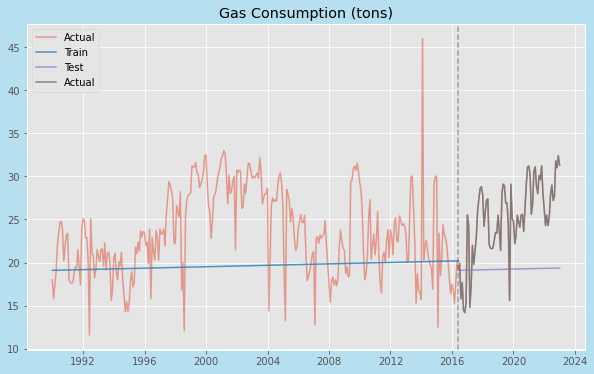

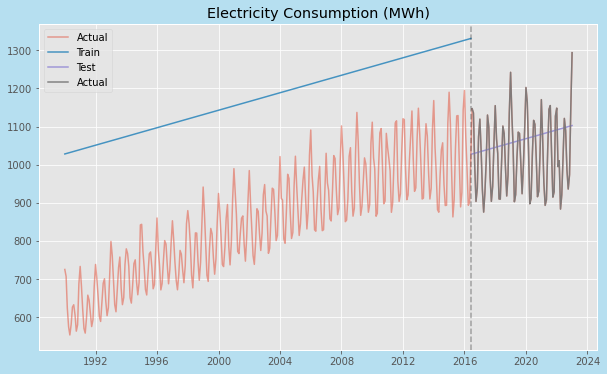

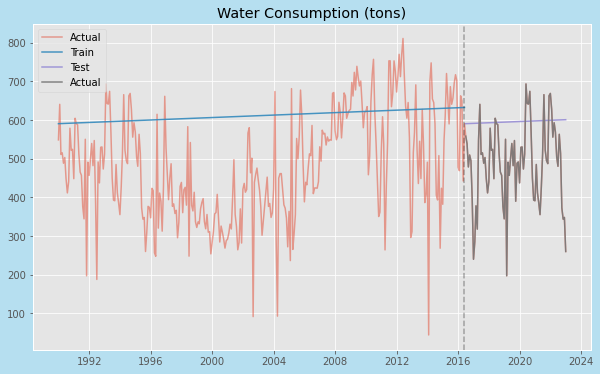

In [52]:
scores_drift = pd.DataFrame(columns=scores_num_cols)
scores_drift = drift_model(scores_drift, train_data)

In [53]:
scores_drift.T.style.bar(color='green')

,0,1,2
Consumption,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
train_root_mean_squared_error,6.233165,336.350246,187.055962
test_root_mean_squared_error,7.365658,104.530878,148.116000
train_mean_absolute_percentage_error,0.194816,0.407762,0.471342
test_mean_absolute_percentage_error,0.253963,0.089823,0.310360


#### To run the interpolated data

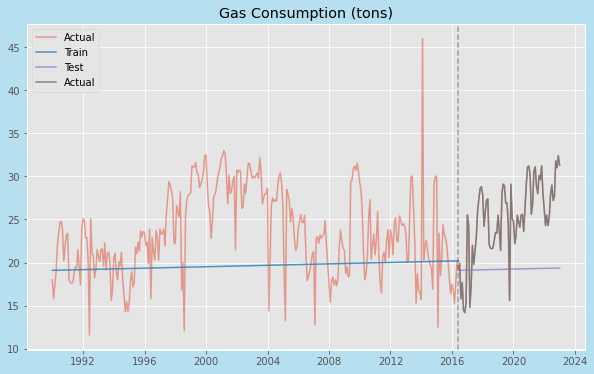

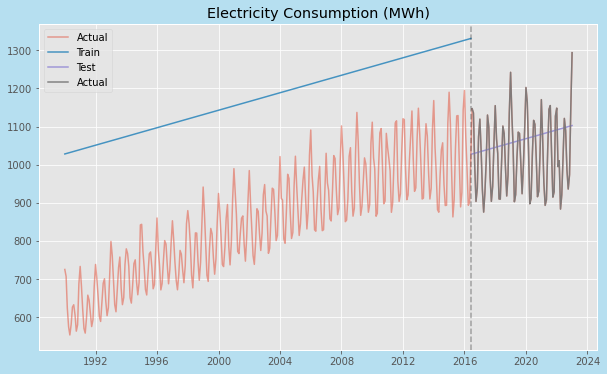

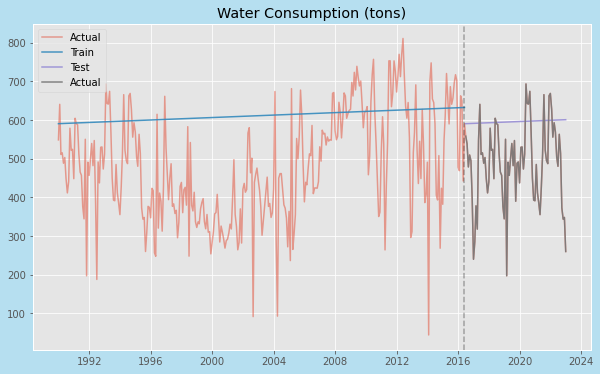

In [54]:
scores_drift_interpolate = pd.DataFrame(columns=scores_num_cols)
scores_drift_interpolate = drift_model(scores_drift_interpolate, train_data_interpolate)

In [55]:
scores_drift_interpolate.T.style.bar(color='green')

,0,1,2
Consumption,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
train_root_mean_squared_error,6.233165,336.350246,187.055962
test_root_mean_squared_error,7.365658,104.530878,148.116000
train_mean_absolute_percentage_error,0.194816,0.407762,0.471342
test_mean_absolute_percentage_error,0.253963,0.089823,0.310360


In [56]:
(scores_drift_interpolate.loc[:, 'train_root_mean_squared_error':'test_mean_absolute_percentage_error'] -
 scores_drift.loc[:, 'train_root_mean_squared_error':'test_mean_absolute_percentage_error']).T


,0,1,2
train_root_mean_squared_error,0.0,0.0,0.0
test_root_mean_squared_error,0.0,0.0,0.0
train_mean_absolute_percentage_error,0.0,0.0,0.0
test_mean_absolute_percentage_error,0.0,0.0,0.0


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the result above 
<ul>
  <li> For <mark>Gas Consumption</mark>, all evaluation metric did not perform well, the difference is 0

  <li> For <mark>Electricity Consumption</mark>,all evaluation metric did not perform well, the difference is 0

  <li> For <mark>Water Consumption</mark>, all evaluation metric did not perform well, the difference is 0
  
</ul>

__Overall we can see that the the model does not forecast the data effectively__
</div>

### Autoregressive Integrated Moving Average Model - ARIMA (Baseline)

This includes AR, MA and ARIMA

With a naive and unkown approach, assume that the p,q,r are all 1,0,1 for all models and check the result

Define the function 

In [57]:
def baseline_arima(df_set_date):
    models_baseline_arima = []
    index = 0
    for value in tqdm(df_set_date.columns):
        plt.figure(figsize=(8,8))
        models_baseline_arima.append(ARIMA(endog=train_data[value], order=(1, 0 ,1)).fit())
        print(models_baseline_arima[index].summary())
        models_baseline_arima[index].plot_diagnostics()
        plt.show()
        index += 1
    return models_baseline_arima


def plot__arima_baseline(scores_arima, train_data, model):
    for col, model in tqdm(zip(num_cols, model)):
        prediction_test = model.predict(start = test_data.index[0] ,end = test_data.index[-1])
        prediction_train = model.predict(start = train_data.index[0],end = train_data.index[-1])
        test_eval = (evaulation_baseline(col,test_data[col],prediction_test,'test'))
        train_eval = (evaulation_baseline(col,train_data[col],prediction_train,'train'))
        new_row = {**test_eval, **train_eval}
        scores_arima = scores_arima.append(new_row, ignore_index=True)
        fig, ax = plt.subplots(1,1, figsize=(10, 6))
        plot_forecast(ax,col, df_set_date,prediction_train, prediction_test, train_data.index[-1])
        fig.set_facecolor('#b6dff0')
        fig.suptitle(f'ARIMA Baseline',size=20,color='darkblue')
        plt.show()
    return scores_arima


##### For original data

  0%|          | 0/3 [00:00<?, ?it/s]

                                 SARIMAX Results                                  
Dep. Variable:     Gas Consumption (tons)   No. Observations:                  318
Model:                     ARIMA(1, 0, 1)   Log Likelihood                -860.254
Date:                    Fri, 11 Aug 2023   AIC                           1728.507
Time:                            22:49:14   BIC                           1743.556
Sample:                        01-01-1990   HQIC                          1734.518
                             - 06-01-2016                                         
Covariance Type:                      opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         23.2762      0.883     26.364      0.000      21.546      25.007
ar.L1          0.8492      0.056     15.203      0.000       0.740       0.959
ma.L1         -0.351

<Figure size 576x576 with 0 Axes>

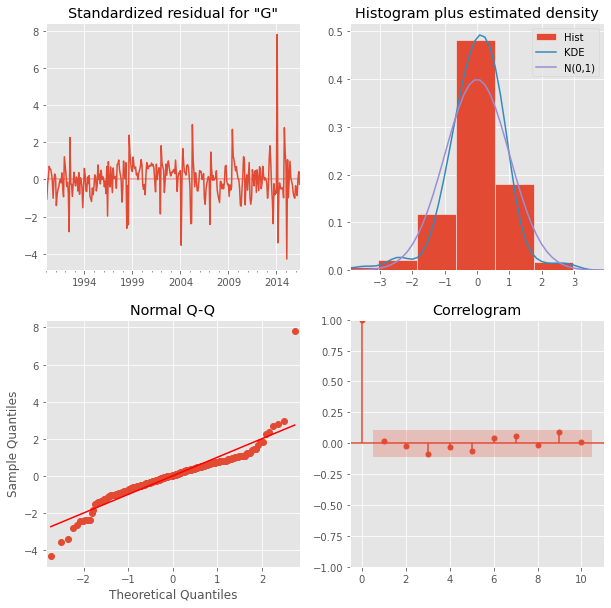

 33%|███▎      | 1/3 [00:00<00:01,  1.74it/s]

                                     SARIMAX Results                                     
Dep. Variable:     Electricity Consumption (MWh)   No. Observations:                  318
Model:                            ARIMA(1, 0, 1)   Log Likelihood               -1745.571
Date:                           Fri, 11 Aug 2023   AIC                           3499.142
Time:                                   22:49:15   BIC                           3514.190
Sample:                               01-01-1990   HQIC                          3505.152
                                    - 06-01-2016                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        854.0276     26.899     31.749      0.000     801.306     906.749
ar.L1          0.7849      0.044     17.737

<Figure size 576x576 with 0 Axes>

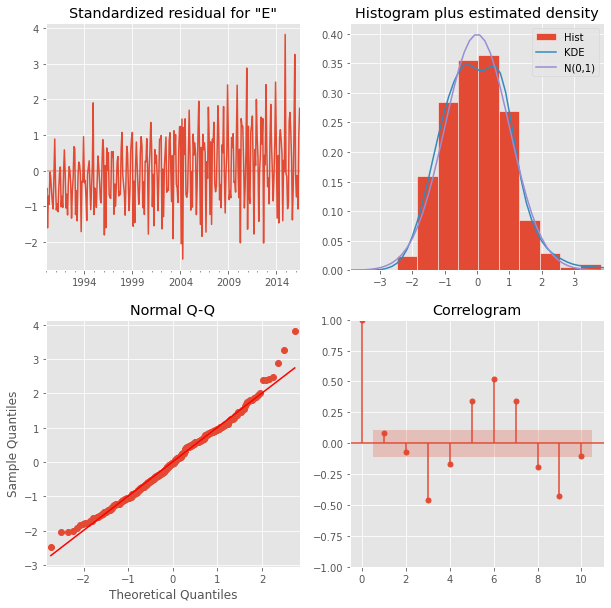

 67%|██████▋   | 2/3 [00:01<00:00,  1.64it/s]

                                  SARIMAX Results                                   
Dep. Variable:     Water Consumption (tons)   No. Observations:                  318
Model:                       ARIMA(1, 0, 1)   Log Likelihood               -1930.956
Date:                      Fri, 11 Aug 2023   AIC                           3869.912
Time:                              22:49:16   BIC                           3884.960
Sample:                          01-01-1990   HQIC                          3875.922
                               - 06-01-2016                                         
Covariance Type:                        opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        484.0987     27.446     17.638      0.000     430.306     537.891
ar.L1          0.8823      0.043     20.373      0.000       0.797       0.967
ma.L

<Figure size 576x576 with 0 Axes>

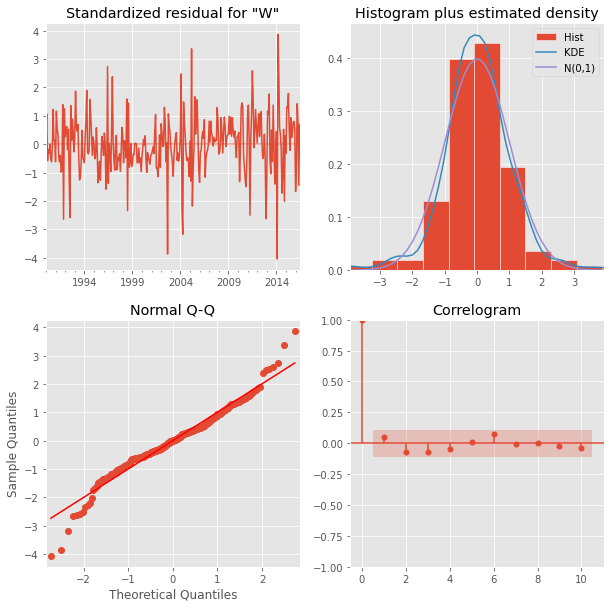

100%|██████████| 3/3 [00:01<00:00,  1.65it/s]


In [58]:
models_baseline_arima = baseline_arima(df_set_date)

##### Visualise the model

0it [00:00, ?it/s]

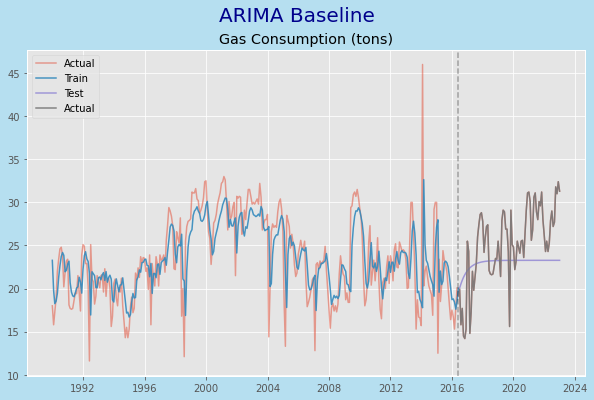

1it [00:00,  4.74it/s]

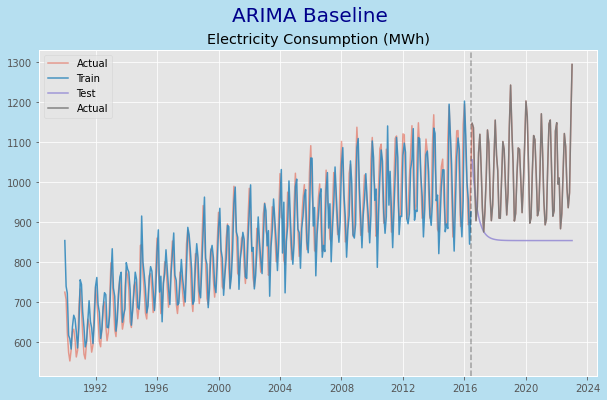

2it [00:00,  4.54it/s]

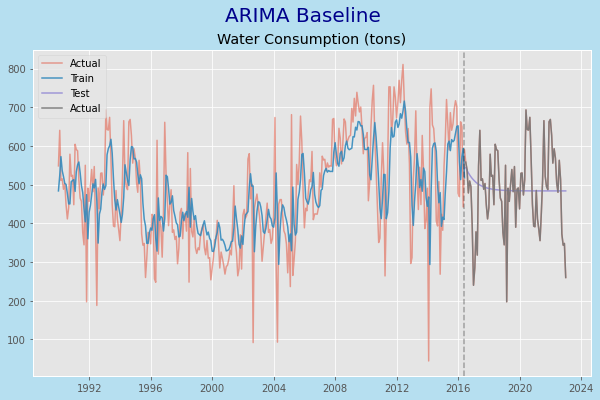

3it [00:00,  4.72it/s]


In [59]:
scores_arima = pd.DataFrame(columns=scores_num_cols)
scores_arima = plot__arima_baseline(scores_arima, train_data, models_baseline_arima)

In [60]:
scores_arima.T

,0,1,2
Consumption,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
train_root_mean_squared_error,3.621322,58.772535,104.857615
test_root_mean_squared_error,4.581271,189.752802,104.502594
train_mean_absolute_percentage_error,0.113344,0.055662,0.223666
test_mean_absolute_percentage_error,0.154341,0.151297,0.190286


##### For the interpolated model

  0%|          | 0/3 [00:00<?, ?it/s]

                                 SARIMAX Results                                  
Dep. Variable:     Gas Consumption (tons)   No. Observations:                  318
Model:                     ARIMA(1, 0, 1)   Log Likelihood                -860.254
Date:                    Fri, 11 Aug 2023   AIC                           1728.507
Time:                            22:49:17   BIC                           1743.556
Sample:                        01-01-1990   HQIC                          1734.518
                             - 06-01-2016                                         
Covariance Type:                      opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         23.2762      0.883     26.364      0.000      21.546      25.007
ar.L1          0.8492      0.056     15.203      0.000       0.740       0.959
ma.L1         -0.351

<Figure size 576x576 with 0 Axes>

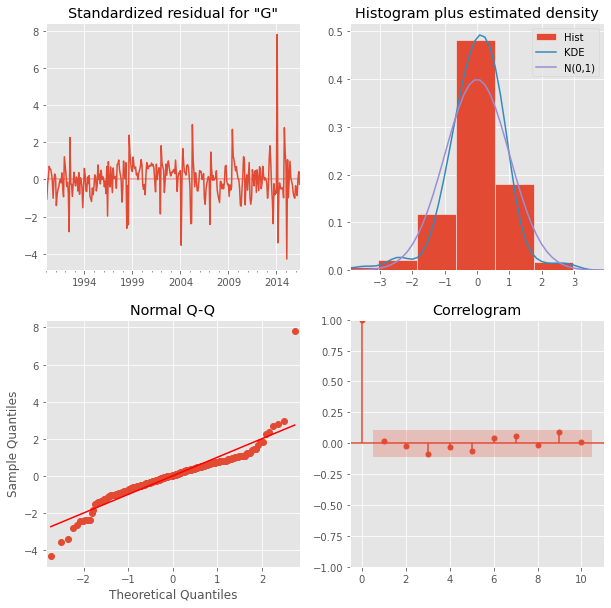

 33%|███▎      | 1/3 [00:00<00:01,  1.34it/s]

                                     SARIMAX Results                                     
Dep. Variable:     Electricity Consumption (MWh)   No. Observations:                  318
Model:                            ARIMA(1, 0, 1)   Log Likelihood               -1745.571
Date:                           Fri, 11 Aug 2023   AIC                           3499.142
Time:                                   22:49:18   BIC                           3514.190
Sample:                               01-01-1990   HQIC                          3505.152
                                    - 06-01-2016                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        854.0276     26.899     31.749      0.000     801.306     906.749
ar.L1          0.7849      0.044     17.737

<Figure size 576x576 with 0 Axes>

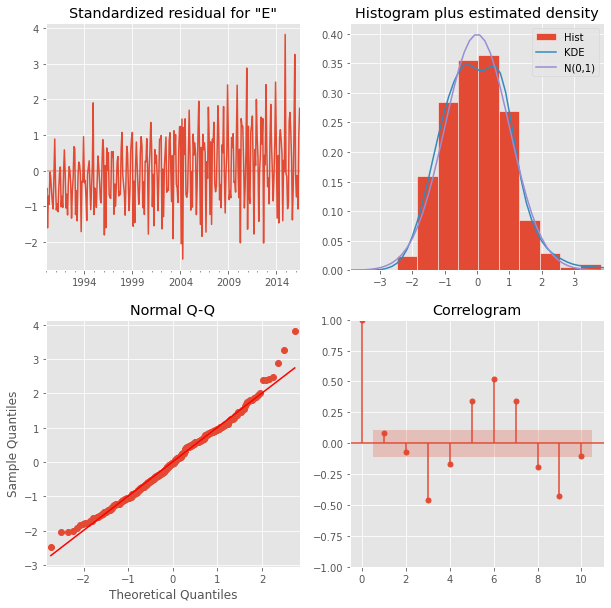

 67%|██████▋   | 2/3 [00:01<00:00,  1.54it/s]

                                  SARIMAX Results                                   
Dep. Variable:     Water Consumption (tons)   No. Observations:                  318
Model:                       ARIMA(1, 0, 1)   Log Likelihood               -1930.956
Date:                      Fri, 11 Aug 2023   AIC                           3869.912
Time:                              22:49:18   BIC                           3884.960
Sample:                          01-01-1990   HQIC                          3875.922
                               - 06-01-2016                                         
Covariance Type:                        opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        484.0987     27.446     17.638      0.000     430.306     537.891
ar.L1          0.8823      0.043     20.373      0.000       0.797       0.967
ma.L

<Figure size 576x576 with 0 Axes>

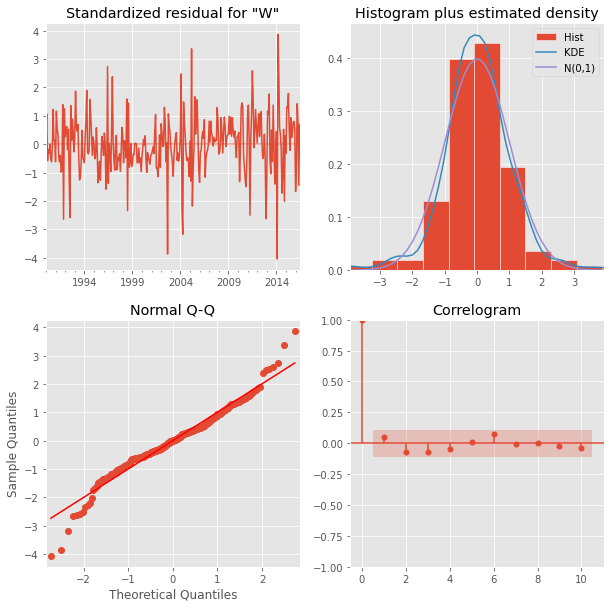

100%|██████████| 3/3 [00:01<00:00,  1.51it/s]


In [61]:
models_baseline_arima_ip = baseline_arima(df_set_date_interpolate)

##### Visualise the model

0it [00:00, ?it/s]

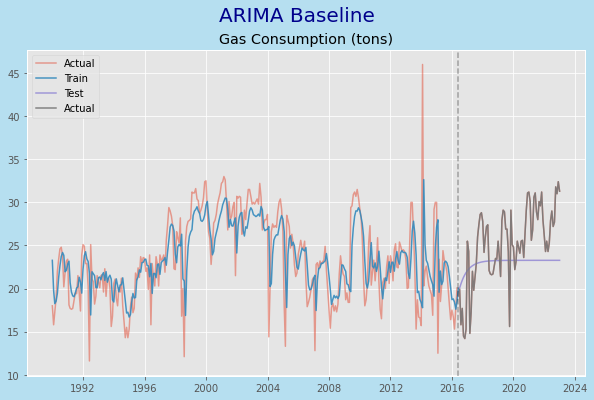

1it [00:00,  4.67it/s]

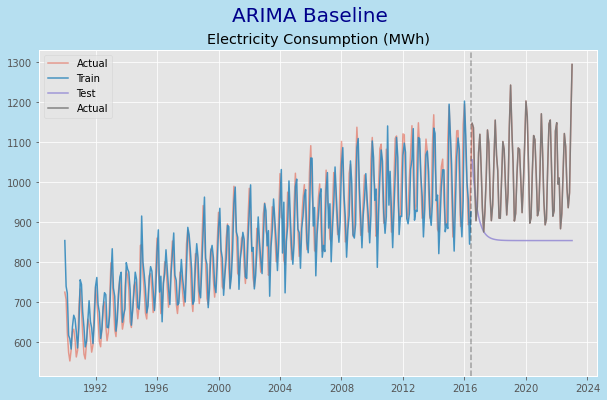

2it [00:00,  4.58it/s]

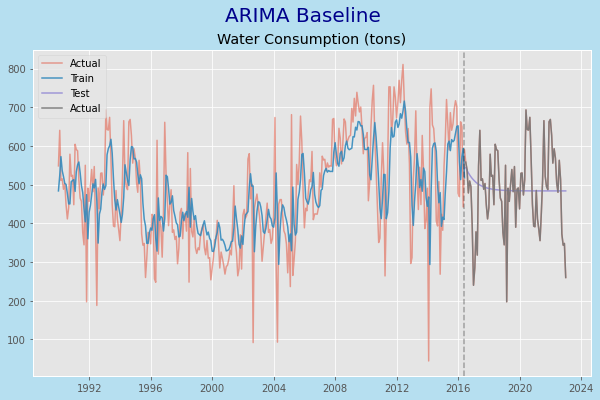

3it [00:00,  4.55it/s]


In [62]:
scores_arima_interpolate = pd.DataFrame(columns=scores_num_cols)
scores_arima_interpolate = plot__arima_baseline(scores_arima_interpolate, train_data_interpolate,models_baseline_arima_ip)

In [63]:
scores_arima_interpolate.T

,0,1,2
Consumption,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
train_root_mean_squared_error,3.621322,58.772535,104.857615
test_root_mean_squared_error,4.581271,189.752802,104.502594
train_mean_absolute_percentage_error,0.113344,0.055662,0.223666
test_mean_absolute_percentage_error,0.154341,0.151297,0.190286


#### Compare the scores

In [64]:
(scores_arima_interpolate.loc[:, 'train_root_mean_squared_error':'test_mean_absolute_percentage_error'] -
 scores_arima.loc[:, 'train_root_mean_squared_error':'test_mean_absolute_percentage_error']).T


,0,1,2
train_root_mean_squared_error,0.0,0.0,0.0
test_root_mean_squared_error,0.0,0.0,0.0
train_mean_absolute_percentage_error,0.0,0.0,0.0
test_mean_absolute_percentage_error,0.0,0.0,0.0


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>


For both of the results above

<ul>
  <li> For <mark>Gas Consumption</mark>, 

  - We can see that it is indepndently distributed, hence it is a white noise time series
  - Data does not have common variance
  - Data is not normal
  - From the residual plot, we can see that majority are pretty close to 0 with a huge spike in 2014
  - From the coefficient, the data are independely distributed, residual show no variances and that data is not normaly distributed


  <li> For <mark>Electricity Consumption</mark> 

  - We can see that it is indepndently distributed, hence it is a white noise time series
  - Data does not have common variance
  - Data is not normal
  - From the residual plot, we can see that majority are pretty close to 0 with a huge spike in 2014
  - From the coefficient, the data are independely distributed, residual show no variances and that data is not normaly distributed


  <li> For <mark>Water Consumption</mark>
  
  - We can see that it is indepndently distributed, hence it is a white noise time series
  - Data does not have common variance
  - Data is not normal
  - From the residual plot, we can see that majority are pretty close to 0 with a huge spike in 2014
  - From the coefficient, the data are independely distributed, residual show no variances and that data is not normaly distributed
  
__Forecast is not nicely fit for all__
</ul>

</div>

### Exponential Smoothing

- Method for forecasting univariate time series data which iss based on the principle that a prediction is a weighted linear sum of past observations or lags. This method works by assigning exponentially decreasing weights for past observations
- Holt winters is an example of triple exponential smoothing and is appropriate for time series with both a trend and a seasonal componen
- The Holt-Winters method includes separate smoothing constants for the level (average value), trend, and seasonal components of a time series
- Most effective when the values of the time series follow a gradual trend and display

Define the function

In [65]:
def es_baseline(train_data):
    model_baseline_es = []
    for col in num_cols:
        ses_model = ExponentialSmoothing(train_data[col]).fit()
        display(ses_model.summary())
        model_baseline_es.append(ses_model)
    return (model_baseline_es)


def es_visualise(scores_es, train_data,model_baseline_es):
    for col, model in tqdm(zip(num_cols, model_baseline_es)):
        prediction_test = model.predict(start = test_data.index[0] ,end = test_data.index[-1])
        prediction_train = model.predict(start = train_data.index[0],end = train_data.index[-1])
        test_eval = (evaulation_baseline(col,test_data[col],prediction_test,'test'))
        train_eval = (evaulation_baseline(col,train_data[col],prediction_train,'train'))
        new_row = {**test_eval, **train_eval}
        print(test_eval)
        scores_es = scores_es.append(new_row, ignore_index=True)
        fig, ax = plt.subplots(1,1, figsize=(10, 6))
        plot_forecast(ax,col, df_set_date_interpolate,prediction_train, prediction_test, train_data.index[-1])
        fig.set_facecolor('#b6dff0')
        fig.suptitle(f'Exponential Smoothing Baseline',size=20,color='darkblue')
        plt.show()
    return scores_es

#### For original data

In [66]:
model_baseline_es = es_baseline(train_data)

Dep. Variable:,Gas Consumption (tons),No. Observations:,318
Model:,ExponentialSmoothing,SSE,4383.779
Optimized:,True,AIC,838.310
Trend:,None,BIC,845.834
Seasonal:,None,AICC,838.437
Seasonal Periods:,None,Date:,"Fri, 11 Aug 2023"
Box-Cox:,False,Time:,22:49:20
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.4506185,alpha,True
initial_level,17.877354,l.0,True


Dep. Variable:,Electricity Consumption (MWh),No. Observations:,318
Model:,ExponentialSmoothing,SSE,1677199.424
Optimized:,True,AIC,2729.446
Trend:,None,BIC,2736.970
Seasonal:,None,AICC,2729.574
Seasonal Periods:,None,Date:,"Fri, 11 Aug 2023"
Box-Cox:,False,Time:,22:49:20
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,1.0000000,alpha,True
initial_level,766.01792,l.0,True


Dep. Variable:,Water Consumption (tons),No. Observations:,318
Model:,ExponentialSmoothing,SSE,3640575.142
Optimized:,True,AIC,2975.901
Trend:,None,BIC,2983.425
Seasonal:,None,AICC,2976.029
Seasonal Periods:,None,Date:,"Fri, 11 Aug 2023"
Box-Cox:,False,Time:,22:49:20
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.3692524,alpha,True
initial_level,550.91433,l.0,True


0it [00:00, ?it/s]

{'Consumption': 'Gas Consumption (tons)', 'test_root_mean_squared_error': 7.808980468317861, 'test_mean_absolute_percentage_error': 0.26911564155492873}


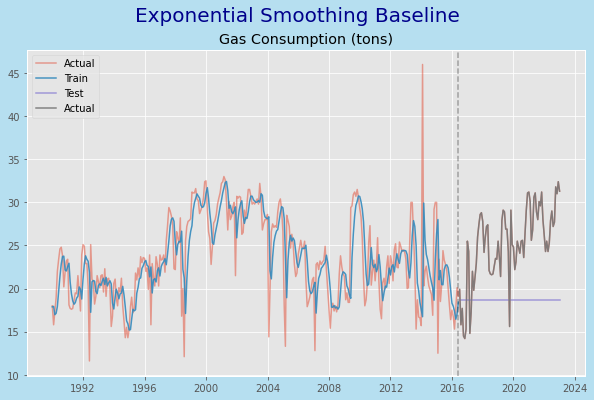

1it [00:00,  5.36it/s]

{'Consumption': 'Electricity Consumption (MWh)', 'test_root_mean_squared_error': 96.25154673696912, 'test_mean_absolute_percentage_error': 0.07953110625706676}


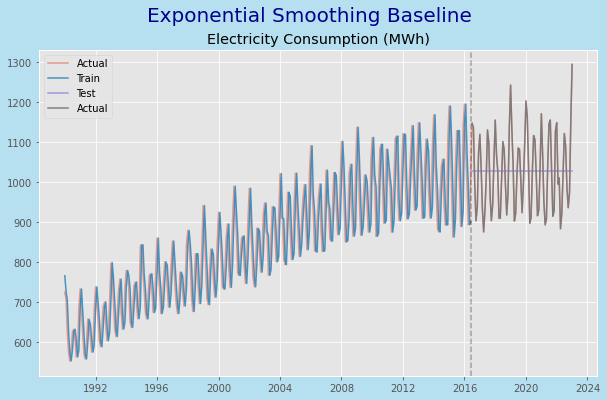

2it [00:00,  3.23it/s]

{'Consumption': 'Water Consumption (tons)', 'test_root_mean_squared_error': 128.7229145372177, 'test_mean_absolute_percentage_error': 0.2628401100820702}


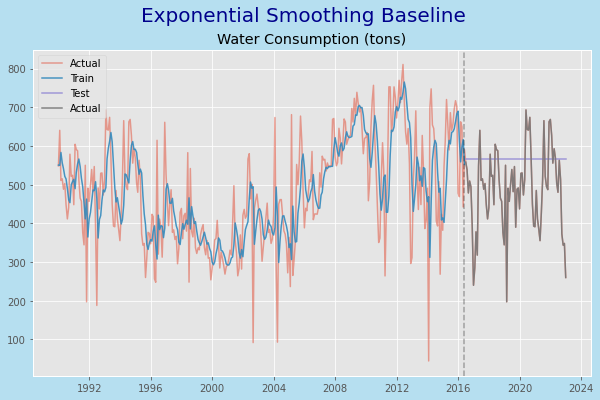

3it [00:00,  3.65it/s]


In [67]:
scores_es = pd.DataFrame(columns=scores_num_cols)
scores_es = es_visualise(scores_es, train_data,model_baseline_es)

In [68]:
scores_es.T

,0,1,2
Consumption,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
train_root_mean_squared_error,3.712879,72.62377,106.99696
test_root_mean_squared_error,7.80898,96.251547,128.722915
train_mean_absolute_percentage_error,0.114091,0.071179,0.222192
test_mean_absolute_percentage_error,0.269116,0.079531,0.26284


#### For interpolated data

In [69]:
model_baseline_es = es_baseline(train_data_interpolate)

Dep. Variable:,Gas Consumption (tons),No. Observations:,318
Model:,ExponentialSmoothing,SSE,4383.779
Optimized:,True,AIC,838.310
Trend:,None,BIC,845.834
Seasonal:,None,AICC,838.437
Seasonal Periods:,None,Date:,"Fri, 11 Aug 2023"
Box-Cox:,False,Time:,22:49:20
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.4506185,alpha,True
initial_level,17.877354,l.0,True


Dep. Variable:,Electricity Consumption (MWh),No. Observations:,318
Model:,ExponentialSmoothing,SSE,1677199.424
Optimized:,True,AIC,2729.446
Trend:,None,BIC,2736.970
Seasonal:,None,AICC,2729.574
Seasonal Periods:,None,Date:,"Fri, 11 Aug 2023"
Box-Cox:,False,Time:,22:49:20
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,1.0000000,alpha,True
initial_level,766.01792,l.0,True


Dep. Variable:,Water Consumption (tons),No. Observations:,318
Model:,ExponentialSmoothing,SSE,3640575.142
Optimized:,True,AIC,2975.901
Trend:,None,BIC,2983.425
Seasonal:,None,AICC,2976.029
Seasonal Periods:,None,Date:,"Fri, 11 Aug 2023"
Box-Cox:,False,Time:,22:49:20
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.3692524,alpha,True
initial_level,550.91433,l.0,True


0it [00:00, ?it/s]

{'Consumption': 'Gas Consumption (tons)', 'test_root_mean_squared_error': 7.808980468317861, 'test_mean_absolute_percentage_error': 0.26911564155492873}


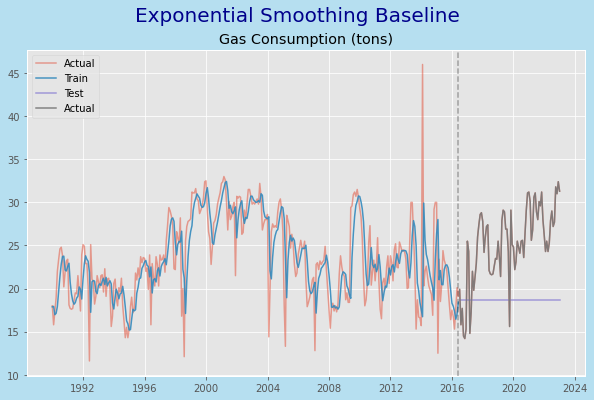

1it [00:00,  4.81it/s]

{'Consumption': 'Electricity Consumption (MWh)', 'test_root_mean_squared_error': 96.25154673696912, 'test_mean_absolute_percentage_error': 0.07953110625706676}


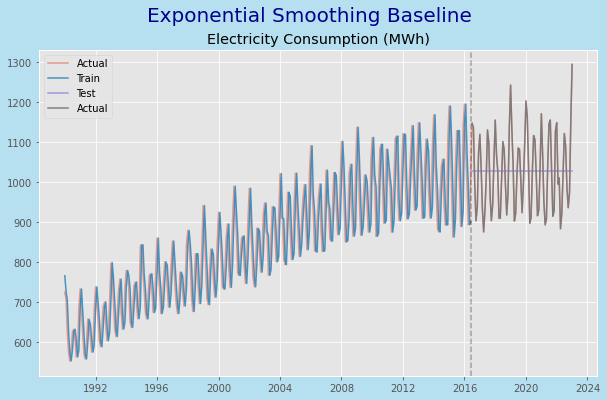

2it [00:00,  4.83it/s]

{'Consumption': 'Water Consumption (tons)', 'test_root_mean_squared_error': 128.7229145372177, 'test_mean_absolute_percentage_error': 0.2628401100820702}


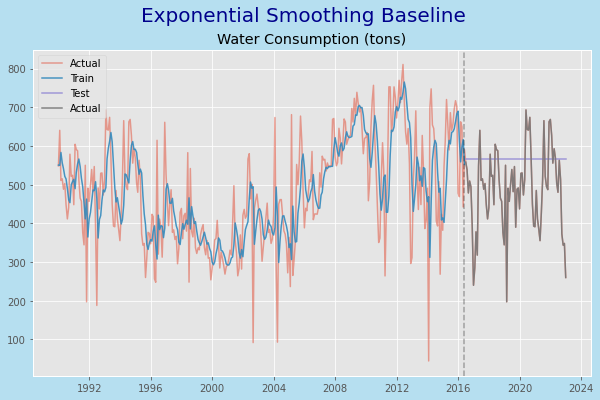

3it [00:00,  4.94it/s]


In [70]:
scores_es_interpolate = pd.DataFrame(columns=scores_num_cols)
scores_es_interpolate = es_visualise(scores_es_interpolate, train_data_interpolate , model_baseline_es)


#### Compare the difference of the score

In [71]:
(scores_es_interpolate.loc[:, 'train_root_mean_squared_error':'test_mean_absolute_percentage_error'] -
 scores_es.loc[:, 'train_root_mean_squared_error':'test_mean_absolute_percentage_error']).T


,0,1,2
train_root_mean_squared_error,0.0,0.0,0.0
test_root_mean_squared_error,0.0,0.0,0.0
train_mean_absolute_percentage_error,0.0,0.0,0.0
test_mean_absolute_percentage_error,0.0,0.0,0.0


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>


For both of the results above

<ul>
  <li> For <mark>Gas Consumption</mark>, 
  
  - From the result, we can see that AIC is 836.652 and BIC is 844.169
  - Smoothing level was choosen at 0.4499155
  - Evluation metric shows that all scores are bad
  - Forecast is not nicely fit
  <li> For <mark>Electricity Consumption</mark> 
   
  - From the result, we can see that AIC is 2719.964 and BIC is 2727.481
  - Smoothing level was choosen at 0.995
  - Evluation metric shows that all scores are bad
  - Forecast is not nicely fit

  <li> For <mark>Water Consumption</mark>
  
  - From the result, we can see that AIC is 2967.425 and BIC is 2974.943
  - Smoothing level was choosen at 0.3715462
  - Evluation metric shows that all scores are bad
  - Forecast is not nicely fit
</ul>

</div>

### Seasonal Autoregressive Integrated Moving Average SARIMA

Similar to ARIMA, SARIMA is an add on to ARIMA but with seasonality,

There are four seasonal elements that are not part of ARIMA and they are

- P: Seasonal autoregressive order
- D: Seasonal difference order
- Q: Seasonal moving average order
- m: The number of time steps for a single seasonal period

With a naive approach, we will use 1,0,1 as the usual p,d,r and with m base on seasonal plot

Define the function

In [72]:
def sarima_baseline(train_data):
    model_baseline_sarima = []
    index = 0
    for i in (num_cols):
        plt.figure(figsize=(8,8))
        model_baseline_sarima.append(
            SARIMAX(train_data[i],order=(1, 0, 1),seasonal_order=(2, 0, 0, 12),).fit())
        display(model_baseline_sarima[index].summary())
        model_baseline_sarima[index].plot_diagnostics()
        index += 1
        plt.show()
    return model_baseline_sarima


def plot_sarima(scores_sarima, train_data,model_baseline_sarimax):
    for col, model in tqdm(zip(num_cols, model_baseline_sarimax)):
        prediction_test = model.predict(start = test_data.index[0] ,end = test_data.index[-1])
        prediction_train = model.predict(start = train_data.index[0],end = train_data.index[-1])
        test_eval = (evaulation_baseline(col,test_data[col],prediction_test,'test'))
        train_eval = (evaulation_baseline(col,train_data[col],prediction_train,'train'))
        new_row = {**test_eval, **train_eval}
        scores_sarima = scores_sarima.append(new_row, ignore_index=True)
        fig, ax = plt.subplots(1,1, figsize=(10, 6))
        plot_forecast(ax,col, df_set_date_interpolate,prediction_train, prediction_test, train_data.index[-1])
        fig.set_facecolor('#b6dff0')
        fig.suptitle(f'SARIMA Baseline ',size=20,color='darkblue')
        plt.show()
    return scores_sarima


#### For original data

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:              Gas Consumption (tons)   No. Observations:                  318
Model:             SARIMAX(1, 0, 1)x(2, 0, [], 12)   Log Likelihood                -868.902
Date:                             Fri, 11 Aug 2023   AIC                           1747.803
Time:                                     22:49:22   BIC                           1766.614
Sample:                                 01-01-1990   HQIC                          1755.316
                                      - 06-01-2016                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9971      0.004    250.331      0.000       0.989       1.005
ma.L1         -0.5301      0.032    -16.329      0.000      -0.594      -0.466
ar.S.L12      -0.0961      0.034     -2.854      0.004      -0.162      -0.030
ar.S.L24       0.0185      0.070      0.263      0.793      -0.120       0.157
sigma2        13.6600      0.451     30.308      0.000      12.777      14.543
===================================================================================
Ljung-Box (L1) (Q):                   3.18   Jarque-Bera (JB):              2173.05
Prob(Q):                              0.07   Prob(JB):                         0.00
Heteroskedasticity (H):               2.27   Skew:                             1.01
Prob(H) (two-sided):                  0.00   Kurtosis:                        15.65
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

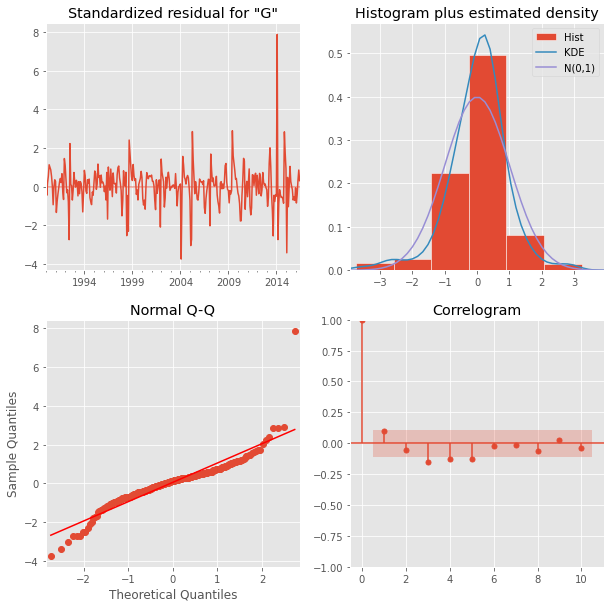

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:       Electricity Consumption (MWh)   No. Observations:                  318
Model:             SARIMAX(1, 0, 1)x(2, 0, [], 12)   Log Likelihood               -1499.924
Date:                             Fri, 11 Aug 2023   AIC                           3009.848
Time:                                     22:49:23   BIC                           3028.659
Sample:                                 01-01-1990   HQIC                          3017.361
                                      - 06-01-2016                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9532      0.022     42.515      0.000       0.909       0.997
ma.L1         -0.4304      0.055     -7.769      0.000      -0.539      -0.322
ar.S.L12       0.5856      0.044     13.226      0.000       0.499       0.672
ar.S.L24       0.3961      0.044      8.909      0.000       0.309       0.483
sigma2       644.0368     42.426     15.180      0.000     560.883     727.191
===================================================================================
Ljung-Box (L1) (Q):                   2.31   Jarque-Bera (JB):                19.04
Prob(Q):                              0.13   Prob(JB):                         0.00
Heteroskedasticity (H):               2.45   Skew:                            -0.16
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.15
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

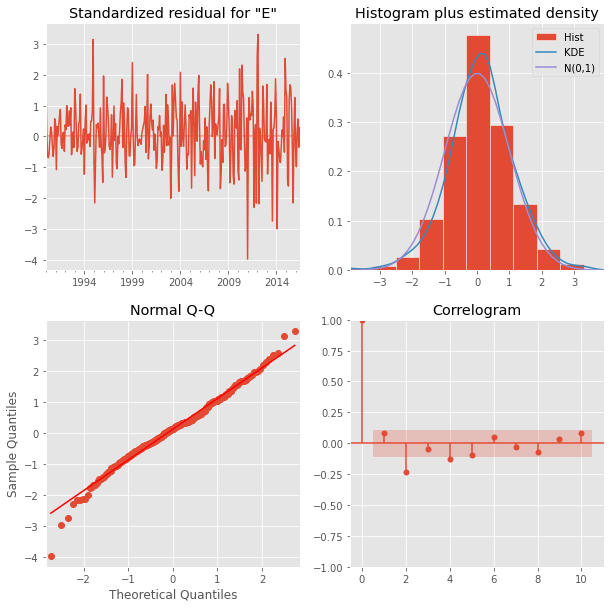

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:            Water Consumption (tons)   No. Observations:                  318
Model:             SARIMAX(1, 0, 1)x(2, 0, [], 12)   Log Likelihood               -1934.183
Date:                             Fri, 11 Aug 2023   AIC                           3878.365
Time:                                     22:49:25   BIC                           3897.175
Sample:                                 01-01-1990   HQIC                          3885.878
                                      - 06-01-2016                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9953      0.006    161.397      0.000       0.983       1.007
ma.L1         -0.6272      0.039    -16.112      0.000      -0.703      -0.551
ar.S.L12       0.0604      0.052      1.160      0.246      -0.042       0.162
ar.S.L24       0.1722      0.068      2.530      0.011       0.039       0.306
sigma2      1.108e+04    620.681     17.850      0.000    9862.460    1.23e+04
===================================================================================
Ljung-Box (L1) (Q):                   4.10   Jarque-Bera (JB):                80.82
Prob(Q):                              0.04   Prob(JB):                         0.00
Heteroskedasticity (H):               1.52   Skew:                            -0.14
Prob(H) (two-sided):                  0.03   Kurtosis:                         5.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

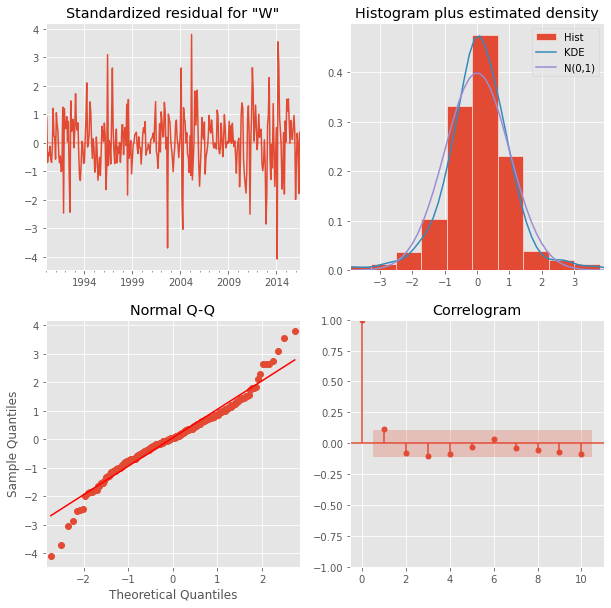

In [73]:
model_baseline_sarimax = sarima_baseline(train_data)

0it [00:00, ?it/s]

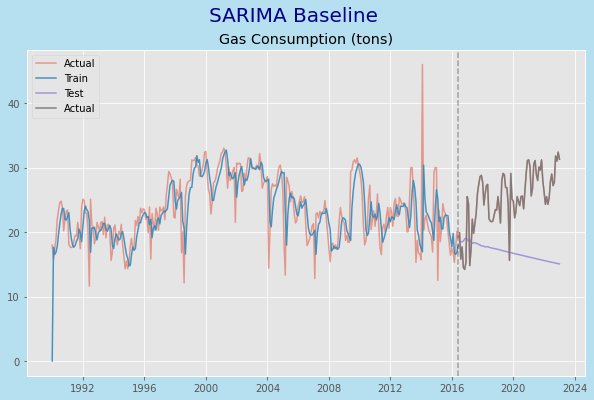

1it [00:00,  5.74it/s]

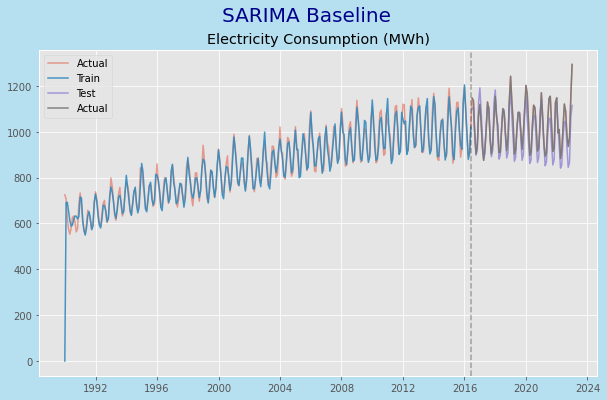

2it [00:00,  5.34it/s]

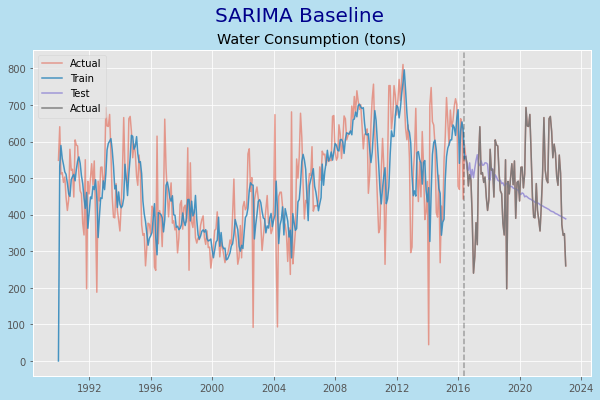

3it [00:00,  5.30it/s]


,Consumption,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error
0,Gas Consumption (tons),3.828023,9.799406,0.116581,0.334835
1,Electricity Consumption (MWh),48.682575,53.948920,0.026939,0.042576
2,Water Consumption (tons),109.632097,118.784284,0.219741,0.203144


In [74]:
scores_sarima = pd.DataFrame(columns=scores_num_cols)
plot_sarima(scores_sarima, train_data, model_baseline_sarimax)


In [75]:
scores_sarima.T

""
Consumption
train_root_mean_squared_error
test_root_mean_squared_error
train_mean_absolute_percentage_error
test_mean_absolute_percentage_error


#### For the interpolated data

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:              Gas Consumption (tons)   No. Observations:                  318
Model:             SARIMAX(1, 0, 1)x(2, 0, [], 12)   Log Likelihood                -868.902
Date:                             Fri, 11 Aug 2023   AIC                           1747.803
Time:                                     22:49:27   BIC                           1766.614
Sample:                                 01-01-1990   HQIC                          1755.316
                                      - 06-01-2016                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9971      0.004    250.331      0.000       0.989       1.005
ma.L1         -0.5301      0.032    -16.329      0.000      -0.594      -0.466
ar.S.L12      -0.0961      0.034     -2.854      0.004      -0.162      -0.030
ar.S.L24       0.0185      0.070      0.263      0.793      -0.120       0.157
sigma2        13.6600      0.451     30.308      0.000      12.777      14.543
===================================================================================
Ljung-Box (L1) (Q):                   3.18   Jarque-Bera (JB):              2173.05
Prob(Q):                              0.07   Prob(JB):                         0.00
Heteroskedasticity (H):               2.27   Skew:                             1.01
Prob(H) (two-sided):                  0.00   Kurtosis:                        15.65
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

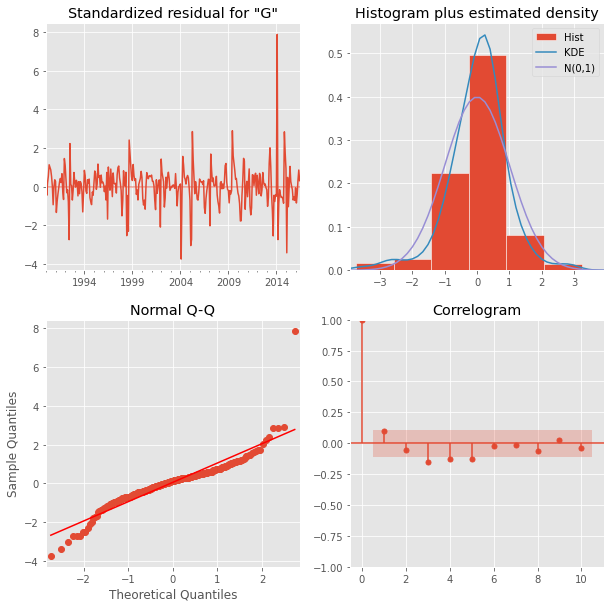

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:       Electricity Consumption (MWh)   No. Observations:                  318
Model:             SARIMAX(1, 0, 1)x(2, 0, [], 12)   Log Likelihood               -1499.924
Date:                             Fri, 11 Aug 2023   AIC                           3009.848
Time:                                     22:49:28   BIC                           3028.659
Sample:                                 01-01-1990   HQIC                          3017.361
                                      - 06-01-2016                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9532      0.022     42.515      0.000       0.909       0.997
ma.L1         -0.4304      0.055     -7.769      0.000      -0.539      -0.322
ar.S.L12       0.5856      0.044     13.226      0.000       0.499       0.672
ar.S.L24       0.3961      0.044      8.909      0.000       0.309       0.483
sigma2       644.0368     42.426     15.180      0.000     560.883     727.191
===================================================================================
Ljung-Box (L1) (Q):                   2.31   Jarque-Bera (JB):                19.04
Prob(Q):                              0.13   Prob(JB):                         0.00
Heteroskedasticity (H):               2.45   Skew:                            -0.16
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.15
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

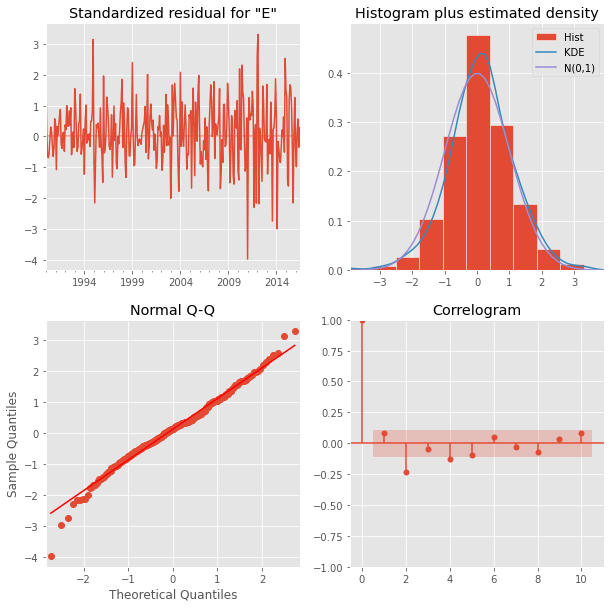

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:            Water Consumption (tons)   No. Observations:                  318
Model:             SARIMAX(1, 0, 1)x(2, 0, [], 12)   Log Likelihood               -1934.183
Date:                             Fri, 11 Aug 2023   AIC                           3878.365
Time:                                     22:49:29   BIC                           3897.175
Sample:                                 01-01-1990   HQIC                          3885.878
                                      - 06-01-2016                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9953      0.006    161.397      0.000       0.983       1.007
ma.L1         -0.6272      0.039    -16.112      0.000      -0.703      -0.551
ar.S.L12       0.0604      0.052      1.160      0.246      -0.042       0.162
ar.S.L24       0.1722      0.068      2.530      0.011       0.039       0.306
sigma2      1.108e+04    620.681     17.850      0.000    9862.460    1.23e+04
===================================================================================
Ljung-Box (L1) (Q):                   4.10   Jarque-Bera (JB):                80.82
Prob(Q):                              0.04   Prob(JB):                         0.00
Heteroskedasticity (H):               1.52   Skew:                            -0.14
Prob(H) (two-sided):                  0.03   Kurtosis:                         5.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

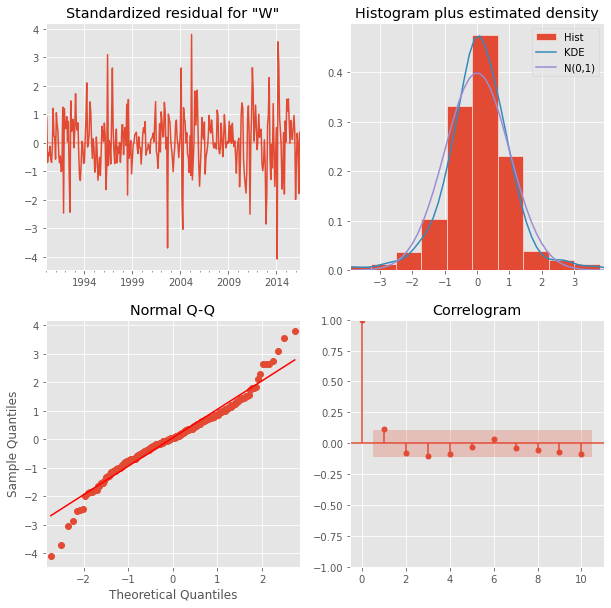

In [76]:
model_baseline_sarimax_interpolated = sarima_baseline(train_data_interpolate)

0it [00:00, ?it/s]

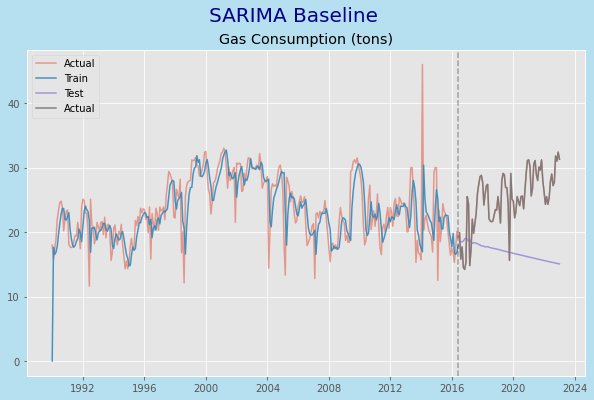

1it [00:00,  5.47it/s]

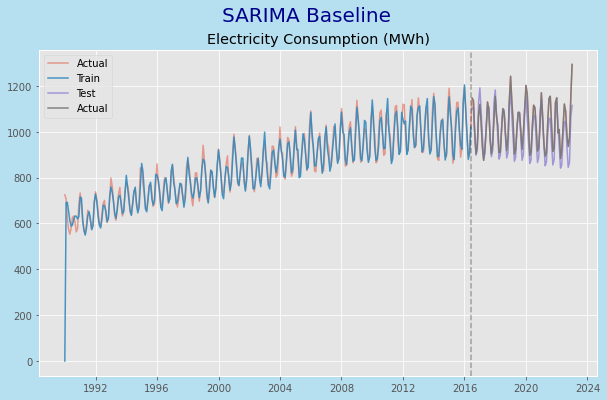

2it [00:00,  5.27it/s]

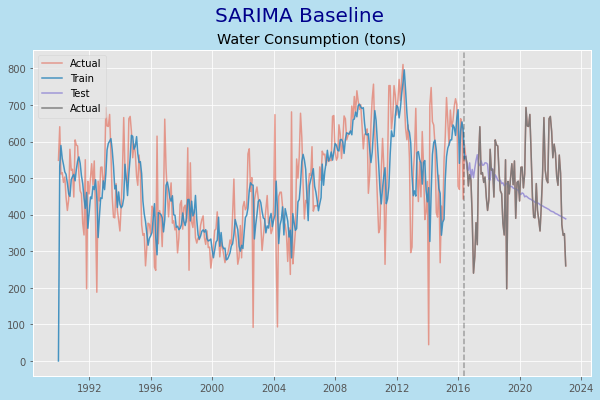

3it [00:00,  3.77it/s]


,Consumption,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error
0,Gas Consumption (tons),3.828023,9.799406,0.116581,0.334835
1,Electricity Consumption (MWh),48.682575,53.948920,0.026939,0.042576
2,Water Consumption (tons),109.632097,118.784284,0.219741,0.203144


In [77]:
scores_sarima_interpoalted = pd.DataFrame(columns=scores_num_cols)
plot_sarima(scores_sarima_interpoalted, train_data_interpolate , model_baseline_sarimax_interpolated)


In [78]:
scores_sarima_interpoalted.T

""
Consumption
train_root_mean_squared_error
test_root_mean_squared_error
train_mean_absolute_percentage_error
test_mean_absolute_percentage_error


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>


For both of the results above

<ul>
  <li> For <mark>Gas Consumption</mark>, 
  
  - From the result, we can see that AIC is 1743.249 and BIC is 1762.044
  - From the coefficient, the data are independely distributed, residual show no variances and that data is not normaly distributed
  - Other evaluation metric shows that the result are bad
  - We can see that it is indepndently distributed, hence it is a white noise time series
  - Data does not have common variance
  - Data is not normal
  - Forecast is not nicely fit

  <li> For <mark>Electricity Consumption</mark> 
   
  - From the result, we can see that AIC is 3001.460 and BIC is 3020.254
  - From the coefficient, the data are independely distributed, residual show no variances and that data is not normaly distributed
  -  Other evaluation metric shows that the result are bad
  - We can see that it is indepndently distributed, hence it is a white noise time series
  - Data does not have common variance
  - Data is not normal
  - From the residual plot, we can see that majority are pretty close to 0 with a huge spike in 2014
  - From the coefficient, the data are independely distributed, residual show no variances and that data is not normaly distributed
  - Forecast is nicely fit

  <li> For <mark>Water Consumption</mark>
  
  - From the result, we can see that AIC is 3867.083 and BIC is 3885.878
  - From the coefficient, the data are not independely distributed, residual show no variances and that data is not normaly distributed
  - Other evaluation metric shows that the result are bad
  - We can see that it is indepndently distributed, hence it is a white noise time series
  - Data does not have common variance
  - Data is not normal
  - From the residual plot, we can see that majority are pretty close to 0 with a huge spike in 2014
  - From the coefficient, the data are independely distributed, residual show no variances and that data is not normaly distributed
  - Forecast is not nicely fit
  
__Overall, interpolated data did not show an improvement, hence original data will be continued to use only__
</ul>

</div>

<a class="anchor" id="5"></a>
## <font color='#71a1e3'>__Advanced Model__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">

Here we will conduct a advanced model

### Ensure data is stationairy

According to the adf and kpss test, in either of the result, all columns occur at least once that it is not stationairy

Methods to do stationairy
1. Differencing

Methods to ensure mean and variance but not necessary stationairy with statsitic test
1. Box-Cox Transformation
   - Power transformation that's used in statistics to stabilize variance and make a dataset look more like a normal distribution. It's often used in time series analysis when the variance of a dataset changes over time (a behavior known as heteroscedasticity), or when a dataset is skewed.

#### Differencing

This is where it subtracts the current value of the series from the previous one, or from a lagged value

Setting the columns to be difference

In [79]:
cols_dif = num_cols[1:]
cols_dif

['Electricity Consumption (MWh)', 'Water Consumption (tons)']

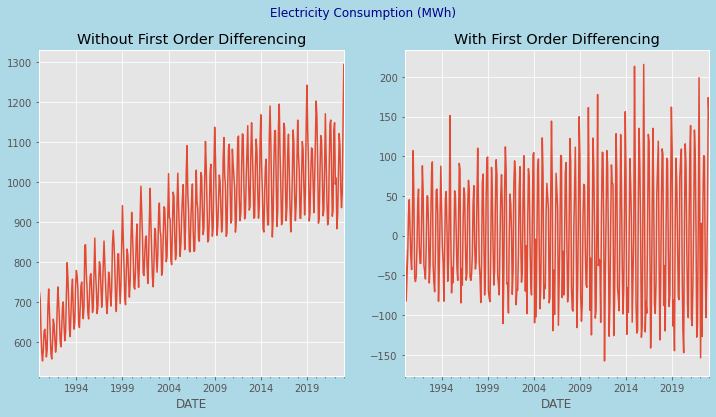

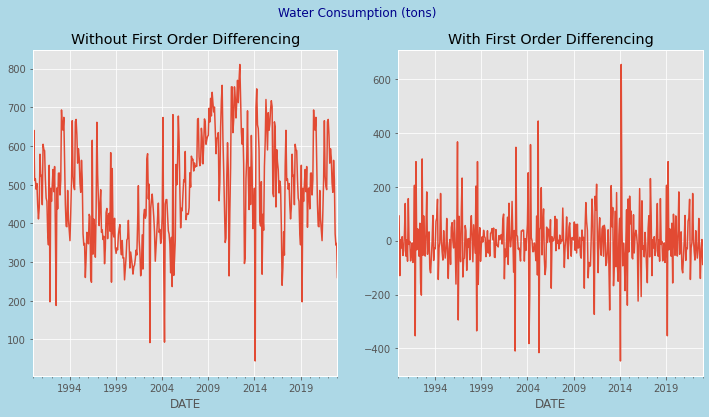

In [80]:
df_new_set_date = df_set_date.diff()

for col in cols_dif:
    fig,ax = plt.subplots(1,2,figsize=(12,6))
    fig.suptitle(f'{col}',color='darkblue')
    fig.set_facecolor(color='lightblue')
    ax[0].set_title('Without First Order Differencing')
    ax[1].set_title('With First Order Differencing')
    df_set_date[col].plot(ax=ax[0])
    df_new_set_date[col].plot()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>


For both of the results above

<ul>

  <li> For <mark>Electricity Consumption</mark> 
   
  - Visual shows constant mean and variance

  <li> For <mark>Water Consumption</mark>
  
  - Visual shows constant mean and variance

</ul>

</div>

Test on the differenced data (ADF and KPSS)

In [81]:
count = 1
for col in cols_dif:
    print(f'{count}. ADF test for stationality:', (colored(col+'\n', 'green')))
    test_adf(df_new_set_date.dropna()[col], col)
    count += 1


1. ADF test for stationality: Electricity Consumption (MWh)

ADF Statistics: -7.104805
p-value: 0.000000
No of Lags 14
Critical values:
	1%: -3.448
	5%: -2.869
	10%: -2.571
Summary:
P-Value < 0.05
Electricity Consumption (MWh) is Stationary

2. ADF test for stationality: Water Consumption (tons)

ADF Statistics: -9.069708
p-value: 0.000000
No of Lags 11
Critical values:
	1%: -3.447
	5%: -2.869
	10%: -2.571
Summary:
P-Value < 0.05
Water Consumption (tons) is Stationary



In [82]:
count2 = 1
for col in cols_dif:
    print(f'{count2}. KPSS test on stationality:',
          colored(col + '\n', 'green'))
    kpss_test(df_new_set_date.dropna()[col], col)
    count2 += 1


1. KPSS test on stationality: Electricity Consumption (MWh)

KPSS Statistic: 0.14519067668792687
p-value: 0.1
num lags: 34
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Summary:
P-Value < 0.05
Electricity Consumption (MWh) is Stationary

2. KPSS test on stationality: Water Consumption (tons)

KPSS Statistic: 0.11112601659149642
p-value: 0.1
num lags: 37
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Summary:
P-Value < 0.05
Water Consumption (tons) is Stationary



<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>


For both of the results of adf test and kpss test, after first differencing

<ul>
  <li> For <mark>Electricity Consumption</mark> 
   
  - Stationality was obtained with both kpss and adf confirmation

  <li> For <mark>Water Consumption</mark>
  
  - Stationality was obtained with both kpss and adf confirmation
  
__Differencing has result in stationality__
</ul>

</div>

#### Box Cox Transformation

Configurable data transform method that supports both square root and log transform, as well as a suite of related transforms.

Credits to [https://machinelearningmastery.com/power-transform-time-series-forecast-data-python/]

In [83]:
# !pip install scipy==1.9.0
# !pip install numpy --upgrade 

In [84]:
from scipy import stats
values = []
df_set_date_box_cox = df_set_date.copy()
for col in df_set_date.columns:
    df_set_date_box_cox[col], _ = stats.boxcox(df_set_date[col])
    values.append(_)
df_set_date_box_cox,values

(            Gas Consumption (tons)  Electricity Consumption (MWh)  \
 DATE                                                                
 1990-01-01               10.939314                    1103.769886   
 1990-02-01                9.757538                    1073.666767   
 1990-03-01               10.566931                     939.921696   
 1990-04-01               11.413452                     859.522909   
 1990-05-01               13.010424                     824.971016   
 ...                            ...                            ...   
 2022-09-01               15.824573                    1536.566111   
 2022-10-01               17.769517                    1452.772691   
 2022-11-01               17.394570                    1515.126821   
 2022-12-01               18.049366                    1807.935985   
 2023-01-01               17.535422                    2057.887370   
 
             Water Consumption (tons)  
 DATE                                  
 1990-01

Setting the train test split

In [85]:
test_sizes = 79

In [86]:
train_data_box_cox = df_set_date_box_cox.iloc[:-test_sizes]
test_data_box_cox  = df_set_date_box_cox.iloc[-test_sizes:]
display(train_data_box_cox) ,display(test_data_box_cox) 


,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
DATE,,,
1990-01-01,10.939314,1103.769886,687.883028
1990-02-01,9.757538,1073.666767,808.562363
1990-03-01,10.566931,939.921696,638.618337
1990-04-01,11.413452,859.522909,644.099245
1990-05-01,13.010424,824.971016,609.028977
...,...,...,...
2016-02-01,10.245103,1683.838291,584.047507
2016-03-01,9.484040,1544.611233,837.565891
2016-04-01,10.833249,1381.952659,820.686026


,Gas Consumption (tons),Electricity Consumption (MWh),Water Consumption (tons)
DATE,,,
2016-07-01,11.934490,1807.766501,700.582337
2016-08-01,9.757538,1788.960655,674.800978
2016-09-01,10.780118,1550.814674,596.532900
2016-10-01,9.042306,1398.593944,636.791794
2016-11-01,8.875285,1456.111422,617.365530
...,...,...,...
2022-09-01,15.824573,1536.566111,641.489050
2022-10-01,17.769517,1452.772691,459.703122
2022-11-01,17.394570,1515.126821,422.176813


(None, None)

Conversion

In [87]:
import numpy as np

def invboxcox(y,ld):
   if ld == 0:
      return(np.exp(y))
   else:
      return(np.exp(np.log(ld*y+1)/ld))


### Partial Auto-Correlation (PACF) and Auto-Correlation (ACF)

As the data has all been confirmed stationary, our next step is to analyse the PACF and ACF to provide an idea to determine the order of AR and MA or ARIMA

__ACF__:
- How well the present value of the series is related with its past value
- It considers components from trend, seasonality, cyclic and residual

__PACF__:
- Instead of finding correlations of present with lags like ACF, but find correlation of residuals (remains after removing the effects explained by the earlier lags) with the next lag value


Definition of lag: A lag 1 autocorrelation is the correlation between values that are one time period apart

What does this help us ?
**This enables us to find out about the type of process to use**

__Auto Regressive (AR)__
- When present value of time series can be obtained using previous values of the same time series 
- Definied by: $$Y(t) = c + \sum_{i=1}^{p} \phi_i \cdot Y(t-i) + \varepsilon(t)$$

Where ϵt is a white noise and y’t-₁ and y’t-₂ are the lags

__Moving average (MA)__
- Where present value of the series is defined as a linear combination of past errors and assumes that errors to be indepently distributed with the normal distribution
- Defined as: $$Y(t) = μ + \sum_{i=1}^{q} \theta_i \cdot \varepsilon(t-i) + \varepsilon(t)$$

Where ϵt is a white noise also known as the error

__ARIMA__ 
- Combines the AR and MA models and include differencing to make the time series stationairy
  $$(1 - Σ(φi * B^i)) * (1 - B)^d * Y_t = μ + (1 + Σ(θi * B^i)) * ε_t$$
  -  Y_t is the value of the time series at time t,
   - μ is the expectation of Y_t,
   - φ1, φ2, ..., φp are the parameters of the AR part of the model,
   - θ1, θ2, ..., θq are the parameters of the MA part of the model,
   - B is the backshift operator, which shifts the time series back by one period,
  -  d is the order of differencing,
   - ε_t is the error term.

Credits to [https://towardsdatascience.com/significance-of-acf-and-pacf-plots-in-time-series-analysis-2fa11a5d10a8,  https://otexts.com/fpp2/]

#### For non-differenced data

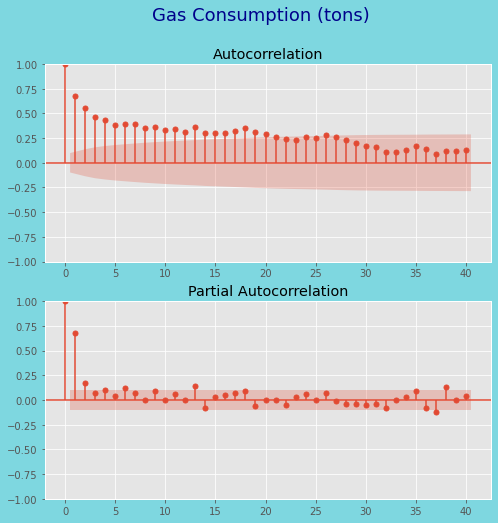

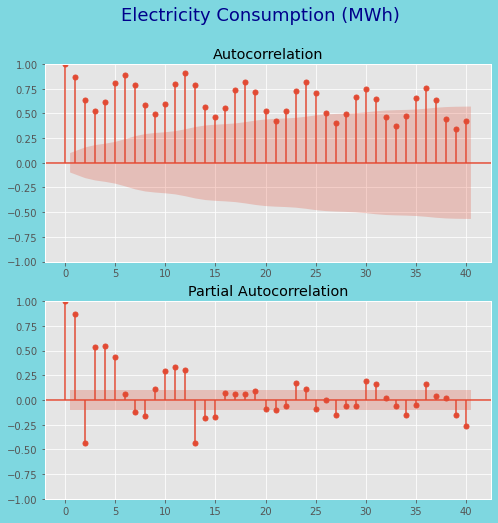

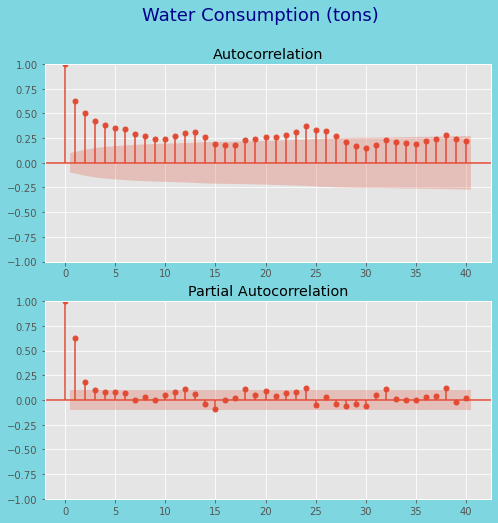

In [88]:
for column in df.columns[1:]:
    fig, ax = plt.subplots(2, 1,figsize=(8,8))
    plot_acf(df_set_date[column], lags = 40, ax=ax[0])
    plot_pacf(df_set_date[column],lags =40, ax=ax[1])
    fig.suptitle(column, fontsize=18,color='darkblue')
    fig.set_facecolor('#7ed7e0')
    plt.show()


#### For differenced data

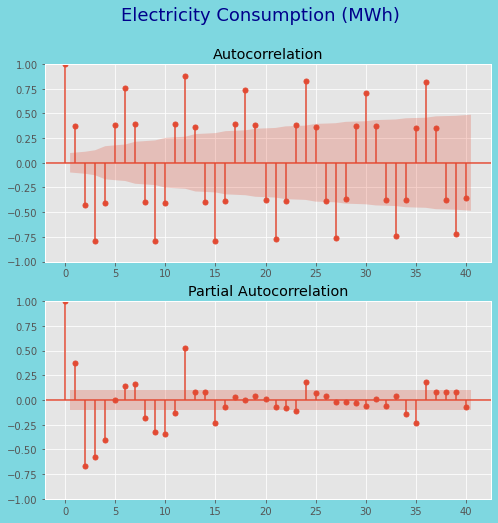

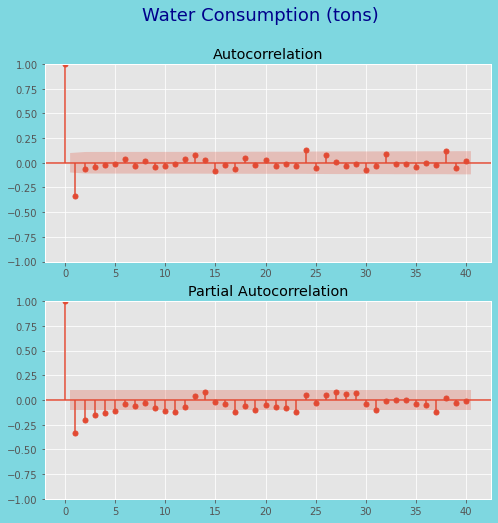

In [89]:
for column in df.columns[2:]:
    fig, ax = plt.subplots(2, 1,figsize=(8,8))
    plot_acf(df_new_set_date[column].dropna(), lags = 40, ax=ax[0])
    plot_pacf(df_new_set_date[column].dropna(),lags =40, ax=ax[1])
    fig.suptitle(column, fontsize=18,color='darkblue')
    fig.set_facecolor('#7ed7e0')
    plt.show()


#### For Box Cox Data

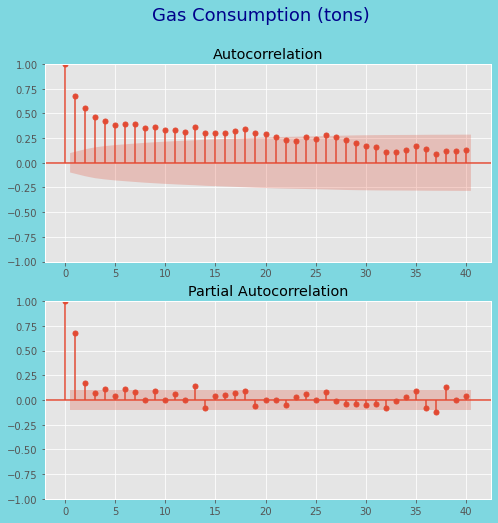

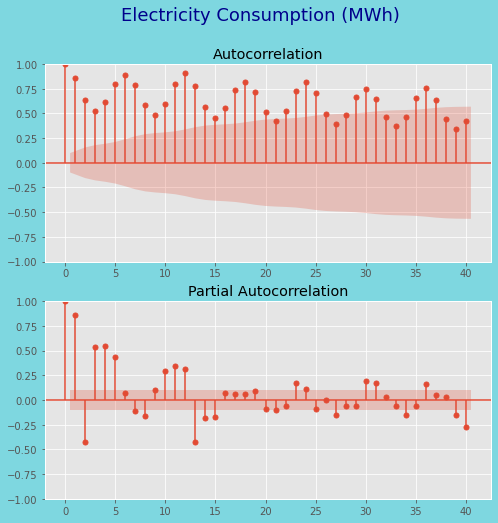

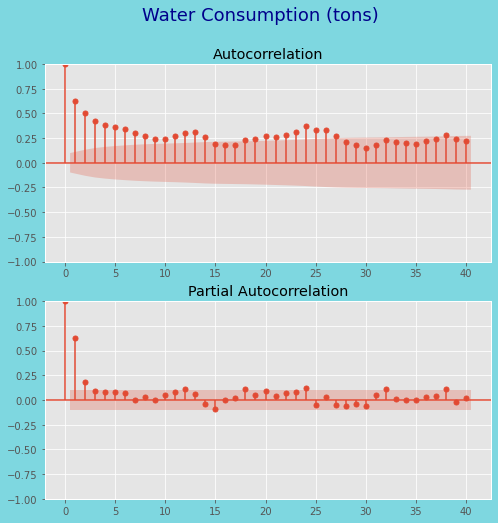

In [90]:
for column in df.columns[1:]:
    fig, ax = plt.subplots(2, 1,figsize=(8,8))
    plot_acf(df_set_date_box_cox[column], lags = 40, ax=ax[0])
    plot_pacf(df_set_date_box_cox[column],lags =40, ax=ax[1])
    fig.suptitle(column, fontsize=18,color='darkblue')
    fig.set_facecolor('#7ed7e0')
    plt.show()


#### For Box Cox (differenced)

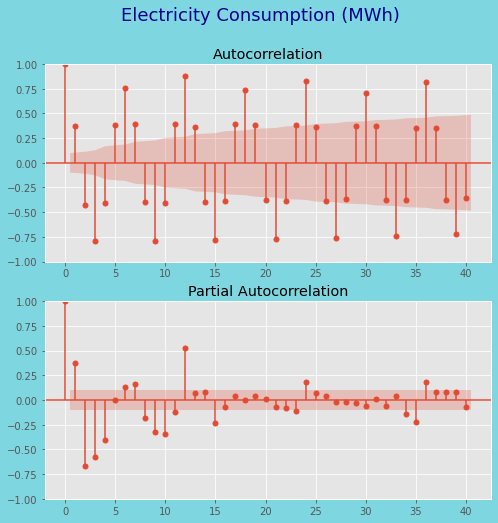

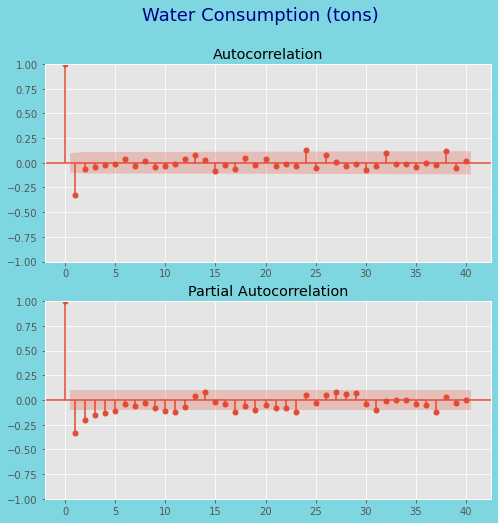

In [91]:
for column in df.columns[2:]:
    fig, ax = plt.subplots(2, 1,figsize=(8,8))
    plot_acf(df_set_date_box_cox[column].diff().dropna(), lags = 40, ax=ax[0])
    plot_pacf(df_set_date_box_cox[column].diff().dropna(),lags =40, ax=ax[1])
    fig.suptitle(column, fontsize=18,color='darkblue')
    fig.set_facecolor('#7ed7e0')
    plt.show()


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>


From the result of pacf and acf plots, possible values with possible values

- Non-differecned data

| Types of Consumption | q | p  | 
| ---    | ---     | :---                                   | 
| Gas Consumption     | 20,1,0     | 0,2   | (2,0,0,7) |
| Electricity Consumption   | 1     | 1,2    | 
| Water Consumption    | 1,2     | 1-2    | 

- Differenced data

| Types of Consumption | q | p  | 
| ---    | ---     | :---                                   | 
|   Electricity Consumption   | 1,2     | 1,3   | (2,0,0,7) |
| Water Consumption   | 1     | 1,2    | 

- From box cox model

| Types of Consumption | q | p  | 
| ---    | ---     | :---                                   | 
| Gas Consumption     | 20,1,0     | 0,2   | (2,0,0,7) |
| Electricity Consumption   | 1     | 1,2    | 
| Water Consumption    | 1,2     | 1,2    | 

- For box cox differenced data

 |  Types of Consumption | q | p  | 
| ---    | ---     | :---                                   | 
|   Electricity Consumption   | 1,2     | 1,3   | (2,0,0,7) |
| Water Consumption   | 1     | 1,2    | 
</div>



### Expanding Window Function

This is also known as the cross validation for time series.

From previous baseline model, Train test split was use, however, the result may not provide an accurate representation of the result

It is method to determine the best performing model and parameters through training and testing the model on different portions of the data

Example of how it looks like is shown below:

![crossval](crossval.jpg)

Below is the defined function for the time series split

In [92]:
def expanding_window(model, endog, column, box_cox, lmbda, exog=None, test_size=80, n_splits=3, scores=None,**kwargs):
    tscv = TimeSeriesSplit(test_size=test_size, n_splits = n_splits)
    for idx, (train_index, test_index) in enumerate(tscv.split(endog)):
        cv_train, cv_test = endog.iloc[train_index], endog.iloc[test_index]
        res = model(cv_train, **kwargs).fit()
        if box_cox != True:
            prediction_test = res.predict(cv_test.index.values[0], cv_test.index.values[-1])
            prediction_train = res.predict(cv_train.index.values[0], cv_train.index.values[-1])
            true_values_test = cv_test.values
            true_values_train = cv_train.values
        else: 
            prediction_test = invboxcox(res.predict(cv_test.index.values[0], cv_test.index.values[-1]),lmbda)
            prediction_train = invboxcox(res.predict(cv_train.index.values[0], cv_train.index.values[-1]),lmbda)
            true_values_test = invboxcox(cv_test.values,lmbda)
            true_values_train = invboxcox(cv_train.values,lmbda)
        test_eval = (evluation_2(column,true_values_test,prediction_test,'test',res))
        train_eval = (evluation_2(column,true_values_train,prediction_train,'train',res))
        new_row = {**train_eval, **test_eval}
        scores = scores.append(new_row,ignore_index=True)
    return scores, res

Setting the new evaluation function to include AIC and BIC

In [93]:
scores_num_cols_new = scores_num_cols.copy() + ['AIC','BIC']

In [94]:
def evluation_2(col, true_values, pred, types,res):
    mse = mean_squared_error(true_values, pred)
    mape = mean_absolute_percentage_error(true_values, pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(true_values, pred)
    new_row = {'Consumption': col,  f'{types}_root_mean_squared_error': rmse, f'{types}_mean_absolute_percentage_error': mape, f'AIC':res.aic, f'BIC':res.bic}
    return new_row


In [95]:
def style_result(df):
    return (df).style.highlight_max(subset=scores_num_cols_new[1:],
                                                    color='coral')\
    .highlight_min(subset=scores_num_cols_new[1:],color='green').highlight_null(subset=scores_num_cols_new[1:],null_color='yellow')


### ARIMA and SARIMA
### Additional parameters

Arima contains three different parameters, as seen from above we have set the potential initial model

Three common parameters include
- p:  P is called the lag order which represents the number of prior lag observations we include in the model i.e. the number of lags which have a significant correlation with the current observation
- q:  Q represents the size of the moving window i.e. the number of lag observation errors which have a significant impact on the current observation. Its similar to the lag order(p), but it considers errors instead of the observations themselves
- d: Order of differencing to determine the stationality of the data 

For sarimax
- P, D, Q: Sasonal counterparts to p, d, and q. 'P' stands for Seasonal Autoregressive order, 'D' is the Seasonal Difference order, and 'Q' is the Seasonal Moving Average order
- m: Number of time steps for a single seasonal period. For example, if the time series has a yearly cycle and the data points are measured monthly, we would set m to 12

#### Gas Consumption

##### ARIMA

__AR Model__ and __MA Model__

Setting the order predetermined from the pacf and pcf plots

In [96]:
order_ar_ma_gc = [(20,0,0),(1,0,0),(0,0,2)]

Running the cross validation to test on the order

In [97]:
scores_arima_gc = pd.DataFrame(columns = scores_num_cols_new)
for order in tqdm(order_ar_ma_gc):
    scores_arima_gc,models = expanding_window(ARIMA, train_data['Gas Consumption (tons)'],f'Gas Consumption (tons) {order}',False,0, order = order,scores = scores_arima_gc)

100%|██████████| 3/3 [00:04<00:00,  1.54s/it]


In [98]:
style_result(scores_arima_gc.groupby('Consumption').mean())

,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Gas Consumption (tons) (0, 0, 2)",3.110304,6.013082,0.116154,0.213720,828.079405,839.934837
"Gas Consumption (tons) (1, 0, 0)",2.866096,5.932327,0.099182,0.210811,796.263690,805.155265
"Gas Consumption (tons) (20, 0, 0)",2.601693,6.592178,0.090233,0.241532,806.196931,871.401811


__ARIMA__

Setting the order predetermined from the pacf and pcf plots

In [99]:
order_arima_gc = [(20,0,2),(20,0,1)]

Running the cross validation to test on the order

In [100]:
for order in tqdm(order_arima_gc):
    scores_arima_gc,models = expanding_window(ARIMA, train_data['Gas Consumption (tons)'],f'Gas Consumption (tons) {order}',False,0, order = order,scores = scores_arima_gc)

100%|██████████| 2/2 [00:14<00:00,  7.32s/it]


In [101]:
style_result(scores_arima_gc.groupby('Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Gas Consumption (tons) (0, 0, 2)",3.110304,6.013082,0.116154,0.213720,828.079405,839.934837
"Gas Consumption (tons) (1, 0, 0)",2.866096,5.932327,0.099182,0.210811,796.263690,805.155265
"Gas Consumption (tons) (20, 0, 0)",2.601693,6.592178,0.090233,0.241532,806.196931,871.401811
"Gas Consumption (tons) (20, 0, 1)",2.587906,6.604866,0.090463,0.238823,807.294794,875.463532
"Gas Consumption (tons) (20, 0, 2)",2.574424,7.076865,0.088908,0.262018,806.513676,877.646272


Box Cox Transformation

__AR Model__ and __MA Model__

Setting the orders from the pacf and acf plot

In [102]:
order_ar_ma_gc_bc = [(20,0,0),(1,0,0),(0,0,2)]

Running the cross validation to test on the order

In [103]:
scores_arima_gc_bc = pd.DataFrame(columns = scores_num_cols_new)
for order in tqdm(order_ar_ma_gc_bc):
    scores_arima_gc_bc,models = expanding_window(ARIMA, train_data_box_cox['Gas Consumption (tons)'],f'Gas Consumption (tons) {order}',True,values[0], order = order,scores = scores_arima_gc_bc)

  0%|          | 0/3 [00:00<?, ?it/s]100%|██████████| 3/3 [00:03<00:00,  1.15s/it]


In [104]:
style_result(scores_arima_gc_bc.groupby('Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Gas Consumption (tons) (0, 0, 2)",3.122769,6.014445,0.116183,0.213011,615.524870,627.380302
"Gas Consumption (tons) (1, 0, 0)",2.873783,5.930962,0.099623,0.210167,586.267407,595.158982
"Gas Consumption (tons) (20, 0, 0)",2.615396,6.560756,0.090721,0.239617,596.080516,661.285396


__ARIMA__

Setting the order predetermined from the pacf and pcf plots

In [105]:
order_arima_gc_bc = [(20,0,2),(20,0,1),(1,0,1),(1,0,2)]

Running the cross validation to test on the order

In [106]:
for order in tqdm(order_arima_gc):
    scores_arima_gc_bc,models = expanding_window(ARIMA, train_data['Gas Consumption (tons)'],f'Gas Consumption (tons) {order}',True, values[0], order = order,scores = scores_arima_gc_bc)

100%|██████████| 2/2 [00:13<00:00,  6.86s/it]


In [107]:
style_result(scores_arima_gc_bc.groupby('Consumption').mean())

,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Gas Consumption (tons) (0, 0, 2)",3.122769,6.014445,0.116183,0.213011,615.524870,627.380302
"Gas Consumption (tons) (1, 0, 0)",2.873783,5.930962,0.099623,0.210167,586.267407,595.158982
"Gas Consumption (tons) (20, 0, 0)",2.615396,6.560756,0.090721,0.239617,596.080516,661.285396
"Gas Consumption (tons) (20, 0, 1)",5.794876,15.317331,0.110059,0.292335,807.294794,875.463532
"Gas Consumption (tons) (20, 0, 2)",5.763771,16.460828,0.108279,0.322984,806.513676,877.646272


Compare the scores

In [108]:
scores_arima_gc_bc.groupby('Consumption').mean().sort_values(by='AIC').iloc[0] - scores_arima_gc.groupby('Consumption').mean().sort_values(by='AIC').iloc[0]

train_root_mean_squared_error             0.007687
test_root_mean_squared_error             -0.001365
train_mean_absolute_percentage_error      0.000441
test_mean_absolute_percentage_error      -0.000644
AIC                                    -209.996283
BIC                                    -209.996283
Name: Gas Consumption (tons) (1, 0, 0), dtype: float64

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the results above

- From the result of original dataframe and box cox transformed data, we can see both performed relatively better for the validation portion on test set with order (1,0,0) and (20,0,0)
- When comparing the differnece, box cox transformed data performed better as compared to original dataframe
- In addition, we can see that the test AIC is about 500 - 800

</div>



__Plot Forecast__

In [109]:
model = ARIMA(train_data_box_cox['Gas Consumption (tons)'], order=(20,0,0)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)

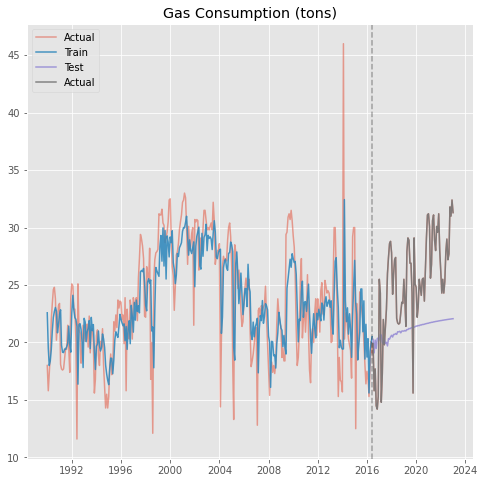

In [110]:
fig,ax = plt.subplots(1,1,figsize=(8,8))
plot_forecast(ax,'Gas Consumption (tons)', invboxcox(df_set_date_box_cox, values[0]),invboxcox(full_pred,values[0]), invboxcox(pred,values[0]),train_data.index[-1] )
plt.show()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 SARIMAX Results                                  
==================================================================================
Dep. Variable:     Gas Consumption (tons)   No. Observations:                  318
Model:                    ARIMA(20, 0, 0)   Log Likelihood                -624.889
Date:                    Fri, 11 Aug 2023   AIC                           1293.778
Time:                            22:50:13   BIC                           1376.543
Sample:                        01-01-1990   HQIC                          1326.835
                             - 06-01-2016                                         
Covariance Type:                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.3065      1.043     12.761      0.000      11.263      15.350
ar.L1          0.5063      0.046     11.075      0.000       0.417       0.596
ar.L2          0.1198      0.069      1.747      0.081      -0.015       0.254
ar.L3         -0.0151      0.096     -0.157      0.876      -0.204       0.174
ar.L4          0.0223      0.096      0.231      0.817      -0.167       0.211
ar.L5         -0.0324      0.092     -0.351      0.726      -0.213       0.149
ar.L6          0.0958      0.082      1.172      0.241      -0.064       0.256
ar.L7          0.0195      0.088      0.220      0.826      -0.154       0.193
ar.L8         -0.0352      0.079     -0.448      0.654      -0.189       0.119
ar.L9          0.0792      0.061      1.306      0.192      -0.040       0.198
ar.L10        -0.0127      0.068     -0.186      0.853      -0.147       0.121
ar.L11         0.0147      0.076      0.193      0.847      -0.134       0.163
ar.L12        -0.0845      0.047     -1.800      0.072      -0.177       0.008
ar.L13         0.2118      0.077      2.760      0.006       0.061       0.362
ar.L14        -0.0891      0.084     -1.064      0.287      -0.253       0.075
ar.L15        -0.0248      0.101     -0.245      0.806      -0.223       0.173
ar.L16         0.0058      0.083      0.071      0.944      -0.156       0.168
ar.L17         0.0615      0.100      0.616      0.538      -0.134       0.257
ar.L18         0.0978      0.105      0.930      0.352      -0.108       0.304
ar.L19        -0.0673      0.103     -0.652      0.514      -0.270       0.135
ar.L20         0.0210      0.075      0.280      0.780      -0.126       0.168
sigma2         2.9638      0.190     15.567      0.000       2.591       3.337
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              1295.06
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               1.95   Skew:                             0.53
Prob(H) (two-sided):                  0.00   Kurtosis:                        12.83
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

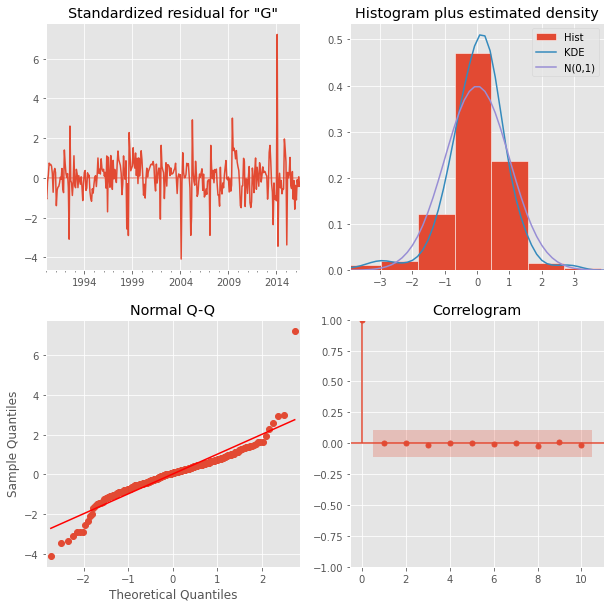

In [111]:
plt.figure(figsize=(8,8))
model.plot_diagnostics()
display(model.summary())
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the result with a better box cox data,

  - We can see that it is indepndently distributed, hence it is a white noise time series
  - Residual does not have common variance
  - Data is not normal
  - Forecast is not nicely fit
</div>



##### SARIMA

Setting the seasonal orders

In [112]:
orders_gc_seasonal = [(0,0,1,12)]

Running the cross validation to test on the order

In [113]:
scores_sarima_gc = pd.DataFrame(columns = scores_num_cols_new)
order_sarima_gc = order_arima_gc_bc + order_ar_ma_gc_bc
for order in tqdm(order_sarima_gc):
    for seasonal_order in tqdm(orders_gc_seasonal):
        scores_sarima_gc,models = expanding_window(SARIMAX, train_data['Gas Consumption (tons)'],f'Gas Consumption (tons) {order} {seasonal_order}',False,0, scores = scores_sarima_gc, order = order, seasonal_order = seasonal_order)

100%|██████████| 7/7 [00:20<00:00,  2.98s/it]


In [114]:
style_result(scores_sarima_gc.groupby('Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Gas Consumption (tons) (0, 0, 2) (0, 0, 1, 12)",7.196145,23.548199,0.263406,0.931036,1081.427285,1093.282718
"Gas Consumption (tons) (1, 0, 0) (0, 0, 1, 12)",3.458291,9.249749,0.104968,0.301290,819.869232,828.760807
"Gas Consumption (tons) (1, 0, 1) (0, 0, 1, 12)",3.282460,7.968025,0.106177,0.299704,802.038717,813.894150
"Gas Consumption (tons) (1, 0, 2) (0, 0, 1, 12)",3.263712,7.852136,0.106330,0.302898,801.531286,816.350577
"Gas Consumption (tons) (20, 0, 0) (0, 0, 1, 12)",3.034167,6.514086,0.096416,0.241643,807.948890,873.153770
"Gas Consumption (tons) (20, 0, 1) (0, 0, 1, 12)",3.045218,6.996487,0.096934,0.263901,811.338988,879.507727
"Gas Consumption (tons) (20, 0, 2) (0, 0, 1, 12)",3.022439,7.239074,0.096395,0.276986,810.428110,881.560706


Box Cox Transformation

In [115]:
scores_sarima_gc_bc = pd.DataFrame(columns=scores_num_cols_new)
for order in tqdm(order_sarima_gc):
    for seasonal_order in tqdm(orders_gc_seasonal):
        try:
            scores_sarima_gc_bc, models = expanding_window(
            SARIMAX, train_data_box_cox['Gas Consumption (tons)'], f'Gas Consumption (tons) {order} {seasonal_order}',True,values[1], scores=scores_sarima_gc_bc, order=order, seasonal_order=seasonal_order)
        except:
            pass

100%|██████████| 7/7 [00:20<00:00,  2.99s/it]


In [116]:
style_result(scores_sarima_gc_bc.groupby('Consumption').mean())

,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Gas Consumption (tons) (1, 0, 0) (0, 0, 1, 12)",1.575124,3.808565,0.079215,0.231047,611.242043,620.133617
"Gas Consumption (tons) (1, 0, 1) (0, 0, 1, 12)",1.496551,3.326370,0.080104,0.226540,591.901828,603.757261
"Gas Consumption (tons) (1, 0, 2) (0, 0, 1, 12)",1.488552,3.263990,0.080143,0.225192,591.348069,606.167360
"Gas Consumption (tons) (20, 0, 0) (0, 0, 1, 12)",1.398445,2.634138,0.072825,0.173175,598.686249,663.891129
"Gas Consumption (tons) (20, 0, 1) (0, 0, 1, 12)",1.399554,2.897603,0.073155,0.194554,600.789007,668.957745
"Gas Consumption (tons) (20, 0, 2) (0, 0, 1, 12)",1.393360,2.810397,0.072675,0.189903,601.157659,672.290255


Compare the difference in scores

In [117]:
scores_sarima_gc_bc.groupby('Consumption').mean().sort_values(by='AIC').iloc[0] - scores_arima_gc.groupby('Consumption').mean().sort_values(by='AIC').iloc[0]

train_root_mean_squared_error            -1.377544
test_root_mean_squared_error             -2.668337
train_mean_absolute_percentage_error     -0.019039
test_mean_absolute_percentage_error       0.014381
AIC                                    -204.915621
BIC                                    -198.987905
dtype: float64

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the results above

- From the result of original dataframe and box cox transformed data, we can see both performed relatively better for the validation portion on test set with order (20,0,0),(0,0,1,12) and (1,0,2),(0,0,2,12)
- When comparing the differnece, box cox transformed data performed better as compared to original dataframe
- In addition, we can see that the test AIC is about 500 - 800

</div>



__Plot Forecast__

In [118]:
model = SARIMAX(train_data_box_cox['Gas Consumption (tons)'], order=(20,0,0), seasonal_order = (0,0,2,12)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)

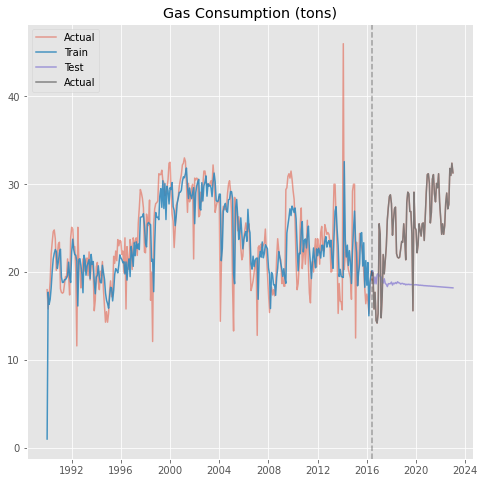

In [119]:
fig,ax = plt.subplots(1,1,figsize=(8,8))
plot_forecast(ax,'Gas Consumption (tons)',invboxcox(df_set_date_box_cox,values[0]), invboxcox(full_pred,values[0]), invboxcox(pred,values[0]),train_data.index[-1] )
plt.show()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                         
================================================================================================
Dep. Variable:                   Gas Consumption (tons)   No. Observations:                  318
Model:             SARIMAX(20, 0, 0)x(0, 0, [1, 2], 12)   Log Likelihood                -628.172
Date:                                  Fri, 11 Aug 2023   AIC                           1302.343
Time:                                          22:50:57   BIC                           1388.871
Sample:                                      01-01-1990   HQIC                          1336.903
                                           - 06-01-2016                                         
Covariance Type:                                    opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5180      0.043     12.042      0.000       0.434       0.602
ar.L2          0.1243      0.070      1.787      0.074      -0.012       0.261
ar.L3         -0.0176      0.102     -0.173      0.863      -0.218       0.183
ar.L4          0.0306      0.100      0.307      0.759      -0.165       0.226
ar.L5         -0.0269      0.093     -0.288      0.773      -0.210       0.156
ar.L6          0.0964      0.086      1.122      0.262      -0.072       0.265
ar.L7          0.0264      0.091      0.289      0.772      -0.153       0.206
ar.L8         -0.0277      0.083     -0.332      0.740      -0.191       0.136
ar.L9          0.0874      0.063      1.395      0.163      -0.035       0.210
ar.L10        -0.0090      0.070     -0.128      0.898      -0.147       0.129
ar.L11         0.0094      0.076      0.123      0.902      -0.139       0.158
ar.L12        -0.0446      0.354     -0.126      0.900      -0.739       0.650
ar.L13         0.2059      0.199      1.037      0.300      -0.183       0.595
ar.L14        -0.0922      0.095     -0.973      0.330      -0.278       0.093
ar.L15        -0.0211      0.108     -0.196      0.845      -0.233       0.190
ar.L16         0.0139      0.088      0.158      0.875      -0.159       0.187
ar.L17         0.0608      0.105      0.579      0.563      -0.145       0.267
ar.L18         0.0975      0.116      0.840      0.401      -0.130       0.325
ar.L19        -0.0570      0.103     -0.554      0.580      -0.259       0.145
ar.L20         0.0234      0.076      0.307      0.759      -0.126       0.173
ma.S.L12      -0.0267      0.360     -0.074      0.941      -0.733       0.680
ma.S.L24       0.0480      0.068      0.703      0.482      -0.086       0.182
sigma2         2.9900      0.171     17.533      0.000       2.656       3.324
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              1327.27
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):               1.96   Skew:                             0.49
Prob(H) (two-sided):                  0.00   Kurtosis:                        12.96
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

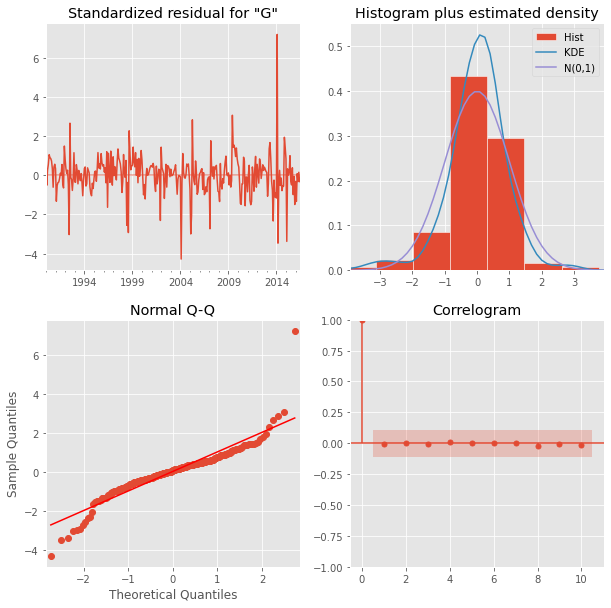

In [120]:
plt.figure(figsize=(8,8))
model.plot_diagnostics()
display(model.summary())
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the result with a better box cox result,

  - We can see that it is indepndently distributed, hence it is a white noise time series
  - Residual does not have common variance
  - Data is not normal
  - Forecast is not nicely fit
</div>



#### Electricity Consumption

##### ARIMA

__AR Model__ and __MA Model__

Setting the order predetermined from the pacf and pcf plots

In [121]:
order_ar_ma_ec  = [(0,0,1),(0,0,2),(0,1,1),(0,1,2)]

Running the cross validation to test on the order

In [122]:
scores_arima_ec = pd.DataFrame(columns = scores_num_cols_new)
for order in tqdm(order_ar_ma_ec):
    scores_arima_ec,models = expanding_window(ARIMA, train_data['Electricity Consumption (MWh)'],f'Electricity Consumption (MWh) {order}',False,0, order = order,scores = scores_arima_ec)

100%|██████████| 4/4 [00:01<00:00,  3.71it/s]


In [123]:
style_result(scores_arima_ec.groupby(
    'Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Electricity Consumption (MWh) (0, 0, 1)",58.877461,186.679450,0.065364,0.175330,1762.873069,1771.764644
"Electricity Consumption (MWh) (0, 0, 2)",46.098108,185.862477,0.051261,0.173685,1682.925181,1694.780614
"Electricity Consumption (MWh) (0, 1, 1)",79.963961,127.996380,0.061224,0.108544,1680.996720,1686.908794
"Electricity Consumption (MWh) (0, 1, 2)",77.888981,106.660380,0.054633,0.089958,1659.925960,1668.794071


__ARIMA__

Setting the order predetermined from the pacf and pcf plots

In [124]:
order_arima_ec = [(1,0,2),(1,1,2),(2,0,1)]

Running the cross validation to test on the order

In [125]:
for order in tqdm(order_arima_ec):
    scores_arima_ec,models = expanding_window(ARIMA, train_data_box_cox['Electricity Consumption (MWh)'],f'Electricity Consumption (MWh) {order}',True,values[1], order = order,scores = scores_arima_ec)

100%|██████████| 3/3 [00:01<00:00,  2.41it/s]


In [126]:
style_result(scores_arima_ec.groupby('Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Electricity Consumption (MWh) (0, 0, 1)",58.877461,186.679450,0.065364,0.175330,1762.873069,1771.764644
"Electricity Consumption (MWh) (0, 0, 2)",46.098108,185.862477,0.051261,0.173685,1682.925181,1694.780614
"Electricity Consumption (MWh) (0, 1, 1)",79.963961,127.996380,0.061224,0.108544,1680.996720,1686.908794
"Electricity Consumption (MWh) (0, 1, 2)",77.888981,106.660380,0.054633,0.089958,1659.925960,1668.794071
"Electricity Consumption (MWh) (1, 0, 2)",42.585667,184.995931,0.046477,0.172511,1814.713671,1829.532962
"Electricity Consumption (MWh) (1, 1, 2)",76.241300,109.831636,0.052785,0.092531,1800.307998,1812.132147
"Electricity Consumption (MWh) (2, 0, 1)",43.194036,186.189562,0.047113,0.174695,1821.223908,1836.043199


Box Cox Transformation

__AR Model__ and __MA Model__

Setting the orders from the pacf and acf plot

In [127]:
order_ar_ma_ec  = [(0,0,1),(0,0,2),(0,1,1),(0,1,2)]

Running the cross validation to test on the order

In [128]:
scores_arima_ec_bc = pd.DataFrame(columns = scores_num_cols_new)
for order in tqdm(order_ar_ma_ec):
    scores_arima_ec_bc,models = expanding_window(ARIMA, train_data_box_cox['Electricity Consumption (MWh)'],f'Electricity Consumption (MWh {order}',True,values[0], order = order,scores = scores_arima_ec_bc)

100%|██████████| 4/4 [00:01<00:00,  3.77it/s]


In [129]:
style_result(scores_arima_ec_bc.groupby('Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Electricity Consumption (MWh (0, 0, 1)",660.968504,2195.269266,0.090702,0.230852,1920.475442,1929.367016
"Electricity Consumption (MWh (0, 0, 2)",516.742456,2186.320490,0.071064,0.228655,1840.909679,1852.765112
"Electricity Consumption (MWh (0, 1, 1)",754.115093,1540.704513,0.081578,0.145140,1838.473303,1844.385377
"Electricity Consumption (MWh (0, 1, 2)",724.513673,1282.755200,0.072206,0.121009,1816.985929,1825.854040


__ARIMA__

Setting the order predetermined from the pacf and pcf plots

In [130]:
order_arima_ec = [(1,0,2),(1,1,2),(2,0,1),(3,1,2)]

Running the cross validation to test on the order

In [131]:
for order in tqdm(order_arima_ec):
    scores_arima_ec_bc,models = expanding_window(ARIMA, train_data_box_cox['Electricity Consumption (MWh)'],f'Electricity Consumption (MWh) {order}',True, values[1], order = order,scores = scores_arima_ec_bc)

100%|██████████| 4/4 [00:02<00:00,  1.77it/s]


In [132]:
style_result(scores_arima_ec_bc.groupby('Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Electricity Consumption (MWh (0, 0, 1)",660.968504,2195.269266,0.090702,0.230852,1920.475442,1929.367016
"Electricity Consumption (MWh (0, 0, 2)",516.742456,2186.320490,0.071064,0.228655,1840.909679,1852.765112
"Electricity Consumption (MWh (0, 1, 1)",754.115093,1540.704513,0.081578,0.145140,1838.473303,1844.385377
"Electricity Consumption (MWh (0, 1, 2)",724.513673,1282.755200,0.072206,0.121009,1816.985929,1825.854040
"Electricity Consumption (MWh) (1, 0, 2)",42.585667,184.995931,0.046477,0.172511,1814.713671,1829.532962
"Electricity Consumption (MWh) (1, 1, 2)",76.241300,109.831636,0.052785,0.092531,1800.307998,1812.132147
"Electricity Consumption (MWh) (2, 0, 1)",43.194036,186.189562,0.047113,0.174695,1821.223908,1836.043199
"Electricity Consumption (MWh) (3, 1, 2)",68.601796,83.768196,0.037246,0.078095,1667.671602,1685.407824


Compare the difference in scores

In [133]:
scores_arima_ec_bc.groupby('Consumption').mean().sort_values(by='AIC').iloc[0] - scores_arima_ec.groupby('Consumption').mean().sort_values(by='AIC').iloc[0]

train_root_mean_squared_error           -9.287185
test_root_mean_squared_error           -22.892184
train_mean_absolute_percentage_error    -0.017387
test_mean_absolute_percentage_error     -0.011863
AIC                                      7.745642
BIC                                     16.613753
dtype: float64

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the results above

- From the result of original dataframe and box cox transformed data, we can see both performed relatively better for the validation portion on test set with order (3,1,3) 
- When comparing the differnece, box cox transformed data performed better as compared to original dataframe in terms of AIC, BIC but worst in order validation
- In addition, we can see that the test AIC is about 500 - 800

</div>



__Plot Forecast__

In [134]:
model = ARIMA(train_data_box_cox['Electricity Consumption (MWh)'], order=(3,1,2)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)

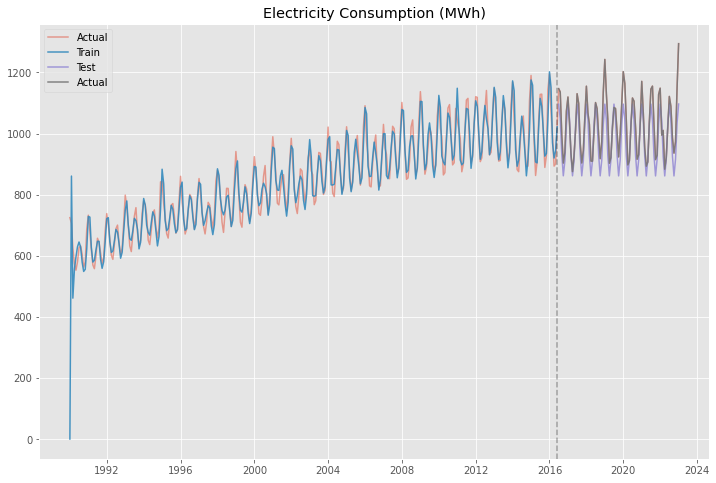

In [135]:
fig,ax = plt.subplots(1,1,figsize=(12,8))
plot_forecast(ax,'Electricity Consumption (MWh)',invboxcox(df_set_date_box_cox,values[1]), invboxcox(full_pred,values[1]), invboxcox(pred,values[1]),train_data.index[-1] )
plt.show()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:     Electricity Consumption (MWh)   No. Observations:                  318
Model:                            ARIMA(3, 1, 2)   Log Likelihood               -1714.916
Date:                           Fri, 11 Aug 2023   AIC                           3441.832
Time:                                   22:51:04   BIC                           3464.385
Sample:                               01-01-1990   HQIC                          3450.841
                                    - 06-01-2016                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8822      0.058     15.175      0.000       0.768       0.996
ar.L2         -0.8837      0.058    -15.287      0.000      -0.997      -0.770
ar.L3         -0.1164      0.058     -2.010      0.044      -0.230      -0.003
ma.L1         -1.0606      0.039    -27.170      0.000      -1.137      -0.984
ma.L2          1.0000      0.072     13.880      0.000       0.859       1.141
sigma2      2817.9637   3.28e-05   8.58e+07      0.000    2817.964    2817.964
===================================================================================
Ljung-Box (L1) (Q):                   0.18   Jarque-Bera (JB):                 9.47
Prob(Q):                              0.67   Prob(JB):                         0.01
Heteroskedasticity (H):               2.09   Skew:                            -0.03
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.84
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.18e+24. Standard errors may be unstable.
"""

<Figure size 576x576 with 0 Axes>

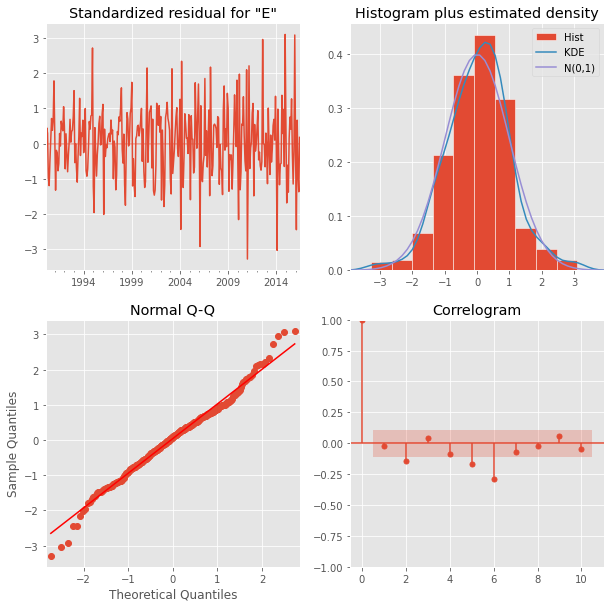

In [136]:
plt.figure(figsize=(8,8))
display(model.summary())
model.plot_diagnostics()
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the result with a better box cox result,

  - We can see that it is indepndently distributed, hence it is a white noise time series
  - Residual does not have common variance
  - Data is not normal
  - Forecast is pretty nicely fit
</div>



##### SARIMA

Setting the seasonal orders

In [137]:
orders_ec_seasonal = [(0,0,1,12),(0,0,2,12)]

Running the cross validation to test on the order

In [138]:
scores_sarima_ec = pd.DataFrame(columns = scores_num_cols_new)
order_sarima_ec = order_arima_ec + order_ar_ma_ec
for order in tqdm(order_sarima_ec):
    for seasonal_order in tqdm(orders_ec_seasonal):
        scores_sarima_ec,models = expanding_window(SARIMAX, train_data['Electricity Consumption (MWh)'],f'Electricity Consumption (MWh) {order} {seasonal_order}',False,0, scores = scores_sarima_ec, order = order, seasonal_order = seasonal_order)

100%|██████████| 8/8 [00:28<00:00,  3.59s/it]


In [139]:
style_result(scores_sarima_ec.groupby('Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Electricity Consumption (MWh) (0, 0, 1) (0, 0, 1, 12)",238.659770,865.570453,0.301909,0.925659,2182.521618,2191.413193
"Electricity Consumption (MWh) (0, 0, 1) (0, 0, 2, 12)",169.771698,826.286204,0.199771,0.860701,2041.263070,2053.118502
"Electricity Consumption (MWh) (0, 0, 2) (0, 0, 1, 12)",195.905871,860.496019,0.214369,0.915371,2130.380355,2142.235788
"Electricity Consumption (MWh) (0, 0, 2) (0, 0, 2, 12)",123.734558,825.196502,0.130372,0.858148,1932.360849,1947.180140
"Electricity Consumption (MWh) (0, 1, 1) (0, 0, 1, 12)",72.616135,113.319516,0.045647,0.093955,1589.411163,1598.279274
"Electricity Consumption (MWh) (0, 1, 1) (0, 0, 2, 12)",71.262728,108.744971,0.042080,0.090296,1565.108369,1576.932517
"Electricity Consumption (MWh) (0, 1, 2) (0, 0, 1, 12)",70.976571,102.057516,0.041274,0.085161,1559.125642,1570.949790
"Electricity Consumption (MWh) (0, 1, 2) (0, 0, 2, 12)",69.587799,101.304108,0.037733,0.082962,1528.316652,1543.096838
"Electricity Consumption (MWh) (1, 0, 2) (0, 0, 1, 12)",70.972847,104.084772,0.041223,0.086836,1577.261564,1592.080855


Box Cox Transformation

In [140]:
scores_sarima_ec_bc = pd.DataFrame(columns=scores_num_cols_new)
for order in tqdm(order_sarima_ec):
    for seasonal_order in tqdm(orders_ec_seasonal):
        try:
            scores_sarima_ec_bc, models = expanding_window(
                SARIMAX, train_data_box_cox['Electricity Consumption (MWh)'], f'Electricity Consumption (MWh) {order} {seasonal_order}', True, values[1], scores=scores_sarima_ec_bc, order=order, seasonal_order=seasonal_order)
        except:
            pass

100%|██████████| 8/8 [00:24<00:00,  3.08s/it]


In [141]:
style_result(scores_sarima_ec_bc.groupby('Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Electricity Consumption (MWh) (0, 0, 1) (0, 0, 1, 12)",227.743599,863.014455,0.285335,0.921045,2320.390142,2329.281717
"Electricity Consumption (MWh) (0, 0, 1) (0, 0, 2, 12)",162.692398,822.442353,0.189111,0.854115,2181.160518,2193.015950
"Electricity Consumption (MWh) (0, 0, 2) (0, 0, 1, 12)",150.604771,858.517755,0.179600,0.912178,2171.589837,2183.445270
"Electricity Consumption (MWh) (0, 1, 1) (0, 0, 1, 12)",72.555936,113.193213,0.045694,0.093855,1746.953244,1755.821355
"Electricity Consumption (MWh) (0, 1, 1) (0, 0, 2, 12)",71.197795,108.754359,0.042112,0.090300,1722.743142,1734.567291
"Electricity Consumption (MWh) (0, 1, 2) (0, 0, 1, 12)",70.902394,101.994914,0.041272,0.085109,1716.482817,1728.306965
"Electricity Consumption (MWh) (0, 1, 2) (0, 0, 2, 12)",69.511542,101.182934,0.037736,0.082854,1685.776200,1700.556385
"Electricity Consumption (MWh) (1, 0, 2) (0, 0, 1, 12)",70.910397,104.157124,0.041248,0.086896,1735.570385,1750.389676
"Electricity Consumption (MWh) (1, 0, 2) (0, 0, 2, 12)",69.517735,103.532708,0.037724,0.084946,1704.892924,1722.676073


Compare the difference in scores

In [142]:
scores_sarima_ec_bc.groupby('Consumption').mean().sort_values(by='AIC').iloc[0] - scores_arima_ec.groupby('Consumption').mean().sort_values(by='AIC').iloc[0]

train_root_mean_squared_error          -11.013608
test_root_mean_squared_error           -27.690333
train_mean_absolute_percentage_error    -0.023221
test_mean_absolute_percentage_error     -0.017005
AIC                                    -44.321011
BIC                                    -29.540825
dtype: float64

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the results above

- From the result of original dataframe and box cox transformed data, we can see both performed relatively better for the validation portion on test set with order (0,1,2),(0,0,2,12) and (1,1,2),(0,0,2,12)
- When comparing the differnece, box cox transformed data performed better as compared to original dataframe
- In addition, we can see that the test AIC is about 1600-1700

</div>



__Plot Forecast__

In [143]:
model = SARIMAX(train_data_box_cox['Electricity Consumption (MWh)'], order=(1,1,2), seasonal_order = (0,0,2,12)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)

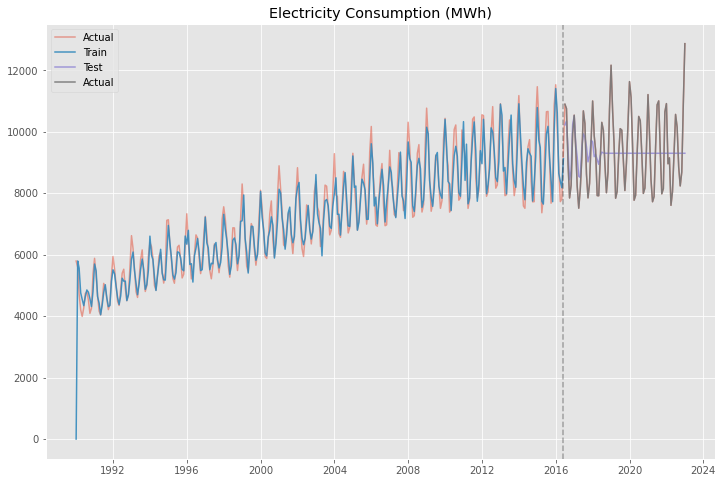

In [144]:
fig,ax = plt.subplots(1,1,figsize=(12,8))
plot_forecast(ax,'Electricity Consumption (MWh)',invboxcox(df_set_date_box_cox,values[0]), invboxcox(full_pred,values[0]), invboxcox(pred,values[0]),train_data.index[-1] )
plt.show()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:      Electricity Consumption (MWh)   No. Observations:                  318
Model:             SARIMAX(1, 1, 2)x(0, 0, 2, 12)   Log Likelihood               -1740.342
Date:                            Fri, 11 Aug 2023   AIC                           3492.684
Time:                                    22:52:01   BIC                           3515.237
Sample:                                01-01-1990   HQIC                          3501.693
                                     - 06-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2395      0.091      2.622      0.009       0.060       0.419
ma.L1         -0.3646      0.069     -5.312      0.000      -0.499      -0.230
ma.L2         -0.5474      0.061     -9.012      0.000      -0.666      -0.428
ma.S.L12       0.7762      0.052     14.850      0.000       0.674       0.879
ma.S.L24       0.4200      0.049      8.579      0.000       0.324       0.516
sigma2      3334.9590    241.046     13.835      0.000    2862.518    3807.400
===================================================================================
Ljung-Box (L1) (Q):                   0.09   Jarque-Bera (JB):                 7.83
Prob(Q):                              0.76   Prob(JB):                         0.02
Heteroskedasticity (H):               2.62   Skew:                             0.34
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.37
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

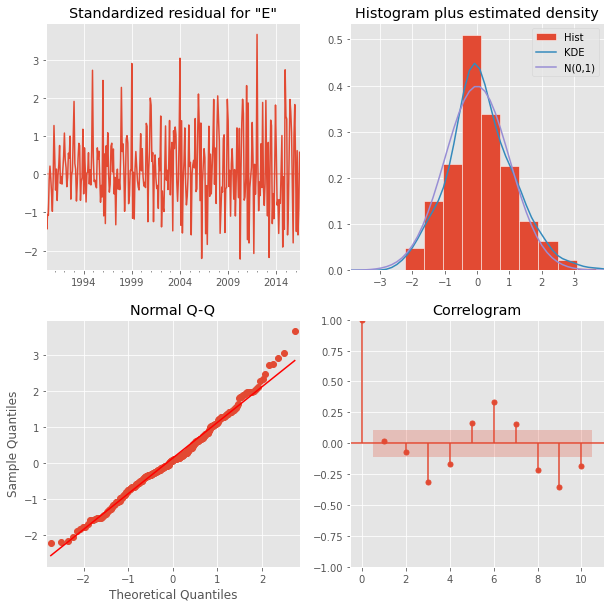

In [145]:
plt.figure(figsize=(8,8))
display(model.summary())
model.plot_diagnostics()
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the result with a better box cox result,

  - We can see that it is indepndently distributed, hence it is a white noise time series
  - Residual does not have common variance
  - Data is not normal
  - Forecast is not nicely fit
</div>



#### Water Consumption

##### ARIMA

__AR Model__ and __MA Model__

Setting the order predetermined from the pacf and pcf plots

In [146]:
order_ar_ma_wc  = [(1,0,0),(2,0,0),(0,0,1),(0,0,2),(1,1,0),(0,1,1)]

Running the cross validation to test on the order

In [147]:
scores_arima_wc = pd.DataFrame(columns = scores_num_cols_new)
for order in tqdm(order_ar_ma_wc):
    scores_arima_wc,models = expanding_window(ARIMA, train_data['Water Consumption (tons)'],f'Water Consumption (tons) {order}',False,0, order = order,scores = scores_arima_wc)

 33%|███▎      | 2/6 [00:00<00:01,  2.34it/s]100%|██████████| 6/6 [00:01<00:00,  3.43it/s]


In [148]:
style_result(scores_arima_wc.groupby(
    'Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Water Consumption (tons) (0, 0, 1)",103.851862,159.118863,0.216932,0.347470,1926.397376,1935.288950
"Water Consumption (tons) (0, 0, 2)",99.040899,159.604735,0.201462,0.349137,1911.905574,1923.761007
"Water Consumption (tons) (0, 1, 1)",107.829091,149.928598,0.199541,0.355256,1882.441601,1888.353675
"Water Consumption (tons) (1, 0, 0)",97.060738,159.080639,0.192128,0.348241,1902.347979,1911.239554
"Water Consumption (tons) (1, 1, 0)",111.850316,164.719361,0.200409,0.403369,1898.290759,1904.202834
"Water Consumption (tons) (2, 0, 0)",94.692188,157.008054,0.189208,0.346364,1894.910705,1906.766138


__ARIMA__

Setting the order predetermined from the pacf and pcf plots

In [149]:
order_arima_wc = [(1,1,1),(2,1,1)]

Running the cross validation to test on the order

In [150]:
for order in tqdm(order_arima_wc):
    scores_arima_wc,models = expanding_window(ARIMA, train_data_box_cox['Water Consumption (tons)'],f'Water Consumption (tons) {order}',True,values[1], order = order,scores = scores_arima_wc)

100%|██████████| 2/2 [00:00<00:00,  2.51it/s]


In [151]:
style_result(scores_arima_wc.groupby('Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Water Consumption (tons) (0, 0, 1)",103.851862,159.118863,0.216932,0.347470,1926.397376,1935.288950
"Water Consumption (tons) (0, 0, 2)",99.040899,159.604735,0.201462,0.349137,1911.905574,1923.761007
"Water Consumption (tons) (0, 1, 1)",107.829091,149.928598,0.199541,0.355256,1882.441601,1888.353675
"Water Consumption (tons) (1, 0, 0)",97.060738,159.080639,0.192128,0.348241,1902.347979,1911.239554
"Water Consumption (tons) (1, 1, 0)",111.850316,164.719361,0.200409,0.403369,1898.290759,1904.202834
"Water Consumption (tons) (1, 1, 1)",88.669253,132.775448,0.188792,0.362811,1959.991483,1968.859595
"Water Consumption (tons) (2, 0, 0)",94.692188,157.008054,0.189208,0.346364,1894.910705,1906.766138
"Water Consumption (tons) (2, 1, 1)",88.139796,133.799912,0.188081,0.362108,1959.705672,1971.529821


Box Cox Transformation

__AR Model__ and __MA Model__

Setting the orders from the pacf and acf plot

In [152]:
order_ar_ma_wc  = [(1,0,0),(2,0,0),(0,0,1),(0,0,2),(1,1,0),(0,1,1)]

Running the cross validation to test on the order

In [153]:
scores_arima_wc_bc = pd.DataFrame(columns = scores_num_cols_new)
for order in tqdm(order_ar_ma_ec):
    scores_arima_wc_bc,models = expanding_window(ARIMA, train_data_box_cox['Water Consumption (tons)'],f'Water Consumption (tons) {order}',True,values[0], order = order,scores = scores_arima_wc_bc)

100%|██████████| 4/4 [00:01<00:00,  3.18it/s]


In [154]:
style_result(scores_arima_wc_bc.groupby('Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Water Consumption (tons) (0, 0, 1)",741.378365,1172.266388,0.310322,0.526174,2007.903863,2016.795438
"Water Consumption (tons) (0, 0, 2)",704.255845,1174.564343,0.288517,0.527897,1993.239294,2005.094727
"Water Consumption (tons) (0, 1, 1)",739.209185,1097.433597,0.282299,0.586643,1963.164936,1969.077010
"Water Consumption (tons) (0, 1, 2)",734.330233,1069.056686,0.277146,0.562936,1962.704107,1971.572218


__ARIMA__

Setting the order predetermined from the pacf and pcf plots

In [155]:
order_arima_wc = [(1,0,1),(1,1,1),(1,0,2)]

Running the cross validation to test on the order

In [156]:
for order in tqdm(order_arima_wc):
    scores_arima_wc_bc,models = expanding_window(ARIMA, train_data_box_cox['Water Consumption (tons)'],f'Water Consumption (tons) {order}',True, values[2], order = order,scores = scores_arima_wc_bc)

 67%|██████▋   | 2/3 [00:00<00:00,  2.12it/s]100%|██████████| 3/3 [00:01<00:00,  1.84it/s]


In [157]:
style_result(scores_arima_wc_bc.groupby('Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Water Consumption (tons) (0, 0, 1)",741.378365,1172.266388,0.310322,0.526174,2007.903863,2016.795438
"Water Consumption (tons) (0, 0, 2)",704.255845,1174.564343,0.288517,0.527897,1993.239294,2005.094727
"Water Consumption (tons) (0, 1, 1)",739.209185,1097.433597,0.282299,0.586643,1963.164936,1969.077010
"Water Consumption (tons) (0, 1, 2)",734.330233,1069.056686,0.277146,0.562936,1962.704107,1971.572218
"Water Consumption (tons) (1, 0, 1)",93.740222,151.148888,0.188676,0.343939,1971.922770,1983.778202
"Water Consumption (tons) (1, 0, 2)",93.566504,147.655732,0.187163,0.346168,1973.125746,1987.945037
"Water Consumption (tons) (1, 1, 1)",106.000330,159.858456,0.195402,0.379303,1959.991483,1968.859595


Compare the difference in scores

In [158]:
scores_arima_wc_bc.groupby('Consumption').mean().sort_values(by='AIC').iloc[0] - scores_arima_wc.groupby('Consumption').mean().sort_values(by='AIC').iloc[0]

train_root_mean_squared_error           -1.828761
test_root_mean_squared_error             9.929858
train_mean_absolute_percentage_error    -0.004139
test_mean_absolute_percentage_error      0.024047
AIC                                     77.549883
BIC                                     80.505920
dtype: float64

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the results above

- From the result of original dataframe and box cox transformed data, we can see both performed relatively better for the validation portion on test set with order (1,1,1) ,(1,0,2)
- When comparing the differnece, box cox transformed data performed worst as compared to original dataframe in terms of AIC, BIC but better in other validation
- In addition, we can see that the test AIC is about 1900 - 2000

</div>



__Plot Forecast__

In [159]:
model = ARIMA(train_data_box_cox['Water Consumption (tons)'], order=(1,0,2)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)

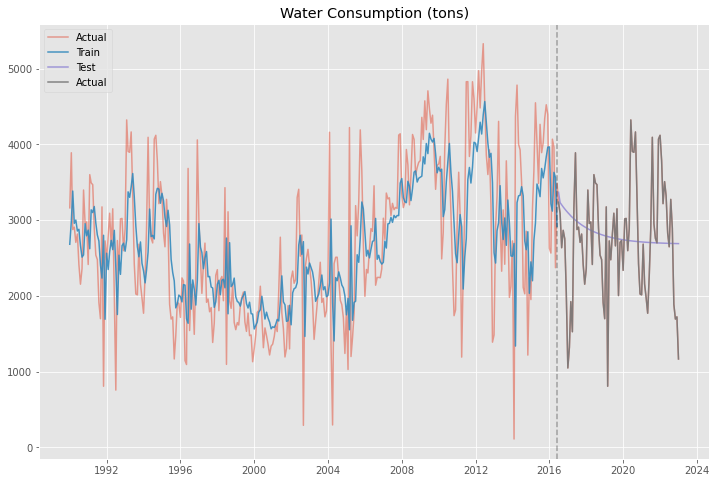

In [160]:
fig,ax = plt.subplots(1,1,figsize=(12,8))
plot_forecast(ax,'Water Consumption (tons)',invboxcox(df_set_date_box_cox,values[0]), invboxcox(full_pred,values[0]), invboxcox(pred,values[0]),train_data.index[-1] )
plt.show()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                  SARIMAX Results                                   
====================================================================================
Dep. Variable:     Water Consumption (tons)   No. Observations:                  318
Model:                       ARIMA(1, 0, 2)   Log Likelihood               -2009.943
Date:                      Fri, 11 Aug 2023   AIC                           4029.887
Time:                              22:52:08   BIC                           4048.697
Sample:                          01-01-1990   HQIC                          4037.400
                               - 06-01-2016                                         
Covariance Type:                        opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        604.6320     48.132     12.562      0.000     510.295     698.969
ar.L1          0.9475      0.028     34.019      0.000       0.893       1.002
ma.L1         -0.5002      0.046    -10.959      0.000      -0.590      -0.411
ma.L2         -0.1723      0.051     -3.365      0.001      -0.273      -0.072
sigma2      1.804e+04   1095.950     16.465      0.000    1.59e+04    2.02e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):                79.08
Prob(Q):                              0.80   Prob(JB):                         0.00
Heteroskedasticity (H):               1.36   Skew:                            -0.18
Prob(H) (two-sided):                  0.12   Kurtosis:                         5.42
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

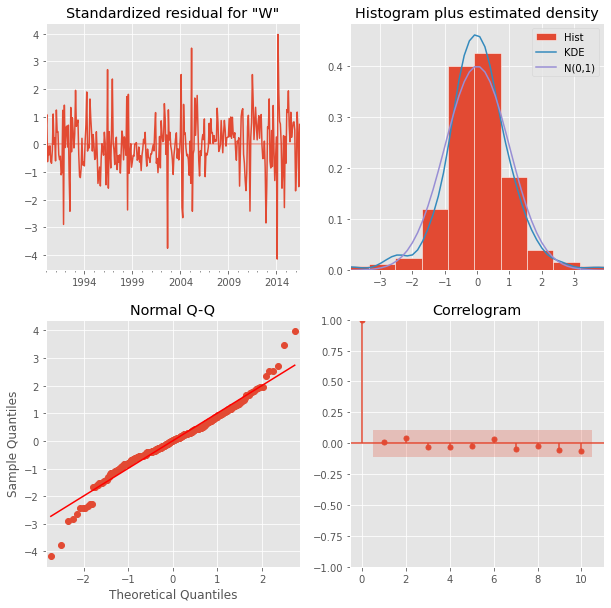

In [161]:
plt.figure(figsize=(8,8))
display(model.summary())
model.plot_diagnostics()
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the result with a better box cox result,

  - We can see that it is indepndently distributed, hence it is a white noise time series
  - Residual does have common variance
  - Data is not normal
  - Forecast is not nicely fit
</div>



##### SARIMA

Setting the seasonal orders

In [162]:
orders_wc_seasonal = [(1,0,0,12),(1,0,1,12)] 

Running the cross validation to test on the order

In [163]:
scores_sarima_wc = pd.DataFrame(columns = scores_num_cols_new)
order_sarima_wc = order_arima_wc + order_ar_ma_wc
for order in tqdm(order_sarima_wc):
    for seasonal_order in tqdm(orders_ec_seasonal):
        scores_sarima_wc,models = expanding_window(SARIMAX, train_data['Water Consumption (tons)'],f'Water Consumption (tons) {order} {seasonal_order}',False,0, scores = scores_sarima_wc, order = order, seasonal_order = seasonal_order)

100%|██████████| 9/9 [00:22<00:00,  2.49s/it]


In [164]:
style_result(scores_sarima_wc.groupby('Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Water Consumption (tons) (0, 0, 1) (0, 0, 1, 12)",227.284898,484.768977,0.410801,0.946519,2165.908893,2174.800468
"Water Consumption (tons) (0, 0, 1) (0, 0, 2, 12)",193.027153,454.234770,0.349265,0.847102,2106.483915,2118.339348
"Water Consumption (tons) (0, 0, 2) (0, 0, 1, 12)",193.732190,484.642735,0.351239,0.943839,2112.264021,2124.119454
"Water Consumption (tons) (0, 0, 2) (0, 0, 2, 12)",174.986148,456.560288,0.320208,0.862913,2081.504471,2096.323762
"Water Consumption (tons) (0, 1, 1) (0, 0, 1, 12)",107.717296,149.811163,0.198838,0.355963,1884.053925,1892.922036
"Water Consumption (tons) (0, 1, 1) (0, 0, 2, 12)",105.621999,143.398178,0.194594,0.343325,1878.476305,1890.300454
"Water Consumption (tons) (1, 0, 0) (0, 0, 1, 12)",119.066169,325.741140,0.195423,0.545334,1941.309636,1950.201211
"Water Consumption (tons) (1, 0, 0) (0, 0, 2, 12)",117.021713,342.799508,0.196757,0.573859,1936.042624,1947.898057
"Water Consumption (tons) (1, 0, 1) (0, 0, 1, 12)",107.617628,153.128189,0.197125,0.321784,1901.241372,1913.096805


Box Cox Transformation

In [165]:
scores_sarima_wc_bc = pd.DataFrame(columns=scores_num_cols_new)
#reset some of the order here
order_ar_ma_wc  = [(1,0,0),(2,0,0),(0,0,1),(0,1,1)]
order_sarima_wc = order_arima_wc + order_ar_ma_wc
for order in tqdm(order_sarima_wc):
    for seasonal_order in tqdm(orders_wc_seasonal):
        scores_sarima_wc_bc, models = expanding_window(
            SARIMAX, train_data_box_cox['Water Consumption (tons)'], f'Water Consumption (tons) {order} {seasonal_order}',True,values[2], scores=scores_sarima_wc_bc, order=order, seasonal_order=seasonal_order)

100%|██████████| 7/7 [00:12<00:00,  1.85s/it]


In [166]:
style_result(scores_sarima_wc_bc.groupby('Consumption').mean())


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Water Consumption (tons) (0, 0, 1) (1, 0, 0, 12)",162.537520,197.507004,0.285012,0.387821,2098.385413,2107.276987
"Water Consumption (tons) (0, 0, 1) (1, 0, 1, 12)",147.353005,170.484674,0.271371,0.353915,2055.188064,2067.043497
"Water Consumption (tons) (0, 1, 1) (1, 0, 0, 12)",107.594986,149.981430,0.198355,0.357717,1964.599913,1973.468024
"Water Consumption (tons) (0, 1, 1) (1, 0, 1, 12)",106.844192,140.185350,0.195281,0.332722,1964.123019,1975.947168
"Water Consumption (tons) (1, 0, 0) (1, 0, 0, 12)",118.993865,331.965873,0.195191,0.558355,2021.790278,2030.681853
"Water Consumption (tons) (1, 0, 0) (1, 0, 1, 12)",116.686545,214.206063,0.195788,0.368370,2016.835887,2028.691320
"Water Consumption (tons) (1, 0, 1) (1, 0, 0, 12)",107.478709,155.050095,0.196543,0.323276,1982.207062,1994.062495
"Water Consumption (tons) (1, 0, 1) (1, 0, 1, 12)",106.401644,159.041285,0.191947,0.340804,1980.769360,1995.588651
"Water Consumption (tons) (1, 0, 2) (1, 0, 0, 12)",106.948436,149.661095,0.193894,0.322675,1982.143404,1996.962695


Compare the difference in scores

In [167]:
scores_sarima_wc_bc.groupby('Consumption').mean().sort_values(by='AIC').iloc[0] - scores_arima_wc.groupby('Consumption').mean().sort_values(by='AIC').iloc[0]

train_root_mean_squared_error           -2.524042
test_root_mean_squared_error             8.515003
train_mean_absolute_percentage_error    -0.007571
test_mean_absolute_percentage_error      0.021510
AIC                                     78.999526
BIC                                     87.867637
dtype: float64

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the results above

- From the result of original dataframe and box cox transformed data, we can see both performed relatively better for the validation portion on test set with order (1,1,1),(1,0,1,12) and (1,1,1),(1,0,0,12)
- When comparing the differnece, box cox transformed data performed better as compared to original dataframe in rmse but relatively lower in the rest, hence original data used here
- In addition, we can see that the test AIC is about 1900-2000

</div>



__Plot Forecast__

In [168]:
model = SARIMAX(train_data['Water Consumption (tons)'], order=(1,1,1), seasonal_order = (1,0,1,12)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)

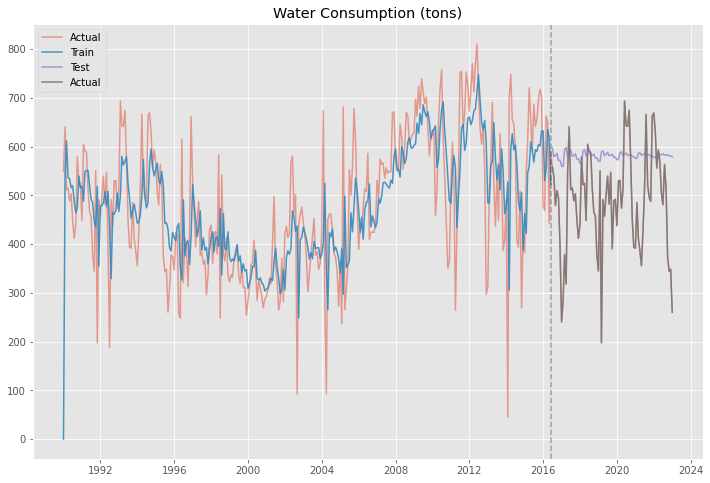

In [169]:
fig,ax = plt.subplots(1,1,figsize=(12,8))
plot_forecast(ax,'Water Consumption (tons)',df_set_date, full_pred, pred,train_data.index[-1] )
plt.show()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:           Water Consumption (tons)   No. Observations:                  318
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 12)   Log Likelihood               -1920.561
Date:                            Fri, 11 Aug 2023   AIC                           3851.123
Time:                                    22:52:45   BIC                           3869.917
Sample:                                01-01-1990   HQIC                          3858.630
                                     - 06-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3965      0.050      7.912      0.000       0.298       0.495
ma.L1         -0.9211      0.025    -36.823      0.000      -0.970      -0.872
ar.S.L12       0.7451      0.376      1.984      0.047       0.009       1.481
ma.S.L12      -0.6821      0.403     -1.693      0.090      -1.472       0.108
sigma2      1.067e+04    585.087     18.238      0.000    9523.978    1.18e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.20   Jarque-Bera (JB):               118.92
Prob(Q):                              0.65   Prob(JB):                         0.00
Heteroskedasticity (H):               1.37   Skew:                            -0.32
Prob(H) (two-sided):                  0.11   Kurtosis:                         5.93
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

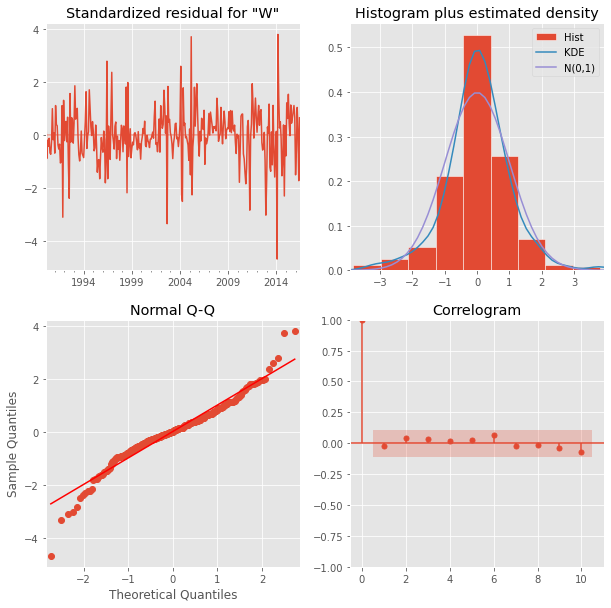

In [170]:
plt.figure(figsize=(8,8))
display(model.summary())
model.plot_diagnostics()
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the result with a better box cox result,

  - We can see that it is indepndently distributed, hence it is a white noise time series
  - Residual does have common variance
  - Data is not normal
  - Forecast is not nicely fit
</div>



Overall, box cox will be use for gas while original data will used for the other two consumption

## <font color='#71a1e3'> __Hyperparameter tuning__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">

Hyperparameter tuning is where we start to select the values suitable for the parameters in the different models, and which is where a search will have to be done here 

### Gas Consumption 


#### ARIMA

Running the results

In [171]:
scores_arima_gc_ht = pd.DataFrame(columns=scores_num_cols_new)
for p in tqdm(range(0, 10)):
    for q in range(0, 10):
        for d in range(2):
            try:
                scores_arima_gc_ht, model = expanding_window(
                    ARIMA, train_data_box_cox['Gas Consumption (tons)'], f'Gas Consumption (tons) ({p},{d},{q})', True, values[0], order=(p, d, q), scores=scores_arima_gc_ht)
            except:
                pass


  0%|          | 0/10 [00:00<?, ?it/s]100%|██████████| 10/10 [09:03<00:00, 54.35s/it]


Checking the results for top 5

In [172]:
style_result(scores_arima_gc_ht.groupby('Consumption').mean().sort_values(by=['test_root_mean_squared_error']).head(15))

,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Gas Consumption (tons) (7,0,4)",2.732360,5.791726,0.095854,0.200426,589.776046,628.306203
"Gas Consumption (tons) (6,0,4)",2.695774,5.796282,0.095243,0.198125,585.231135,620.797434
"Gas Consumption (tons) (8,0,4)",2.685942,5.895500,0.094217,0.206420,589.087034,630.581048
"Gas Consumption (tons) (2,0,0)",2.811879,5.909472,0.098932,0.208690,580.501853,592.357286
"Gas Consumption (tons) (3,0,0)",2.810176,5.917026,0.099079,0.208986,582.253705,597.072996
"Gas Consumption (tons) (1,0,1)",2.808941,5.927246,0.099153,0.208748,579.968928,591.824361
"Gas Consumption (tons) (1,0,0)",2.873783,5.930962,0.099623,0.210167,586.267407,595.158982
"Gas Consumption (tons) (2,0,2)",2.790455,5.931513,0.098563,0.210313,581.246236,599.029385
"Gas Consumption (tons) (4,0,0)",2.800972,5.942575,0.098972,0.209893,582.946016,600.729166


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the results above, best few

| p | d | q |
| ---    | ---                    | ---                | 
| 7                  | 0           | 4                      |

</div>



With (7,0,4)

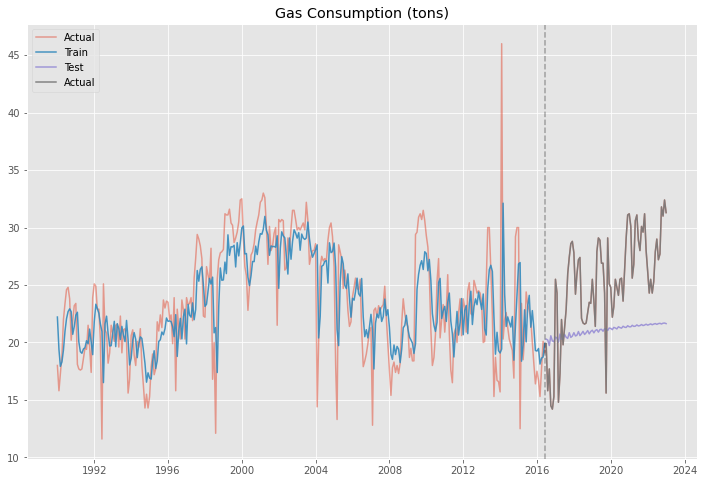

In [173]:
fig,ax = plt.subplots(1,1,figsize=(12,8))
model = ARIMA(train_data_box_cox['Gas Consumption (tons)'], order=(7,0,4)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)
plot_forecast(ax,'Gas Consumption (tons)',invboxcox(df_set_date_box_cox,values[0]), invboxcox(full_pred,values[0]), invboxcox(pred,values[0]),train_data.index[-1] )
plt.show()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 SARIMAX Results                                  
==================================================================================
Dep. Variable:     Gas Consumption (tons)   No. Observations:                  318
Model:                     ARIMA(7, 0, 4)   Log Likelihood                -630.517
Date:                    Fri, 11 Aug 2023   AIC                           1287.034
Time:                            23:01:53   BIC                           1335.941
Sample:                        01-01-1990   HQIC                          1306.568
                             - 06-01-2016                                         
Covariance Type:                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.1197      1.045     12.549      0.000      11.071      15.169
ar.L1         -0.6501      0.115     -5.630      0.000      -0.876      -0.424
ar.L2          0.5465      0.126      4.352      0.000       0.300       0.793
ar.L3          1.0748      0.113      9.475      0.000       0.852       1.297
ar.L4          0.3773      0.129      2.917      0.004       0.124       0.631
ar.L5         -0.4718      0.110     -4.302      0.000      -0.687      -0.257
ar.L6         -0.0450      0.087     -0.518      0.605      -0.215       0.125
ar.L7          0.1076      0.079      1.367      0.172      -0.047       0.262
ma.L1          1.1469      0.118      9.733      0.000       0.916       1.378
ma.L2          0.1551      0.133      1.164      0.244      -0.106       0.416
ma.L3         -0.8935      0.135     -6.595      0.000      -1.159      -0.628
ma.L4         -0.8072      0.115     -7.001      0.000      -1.033      -0.581
sigma2         3.0652      0.183     16.763      0.000       2.707       3.424
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              1191.36
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               1.94   Skew:                             0.34
Prob(H) (two-sided):                  0.00   Kurtosis:                        12.46
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

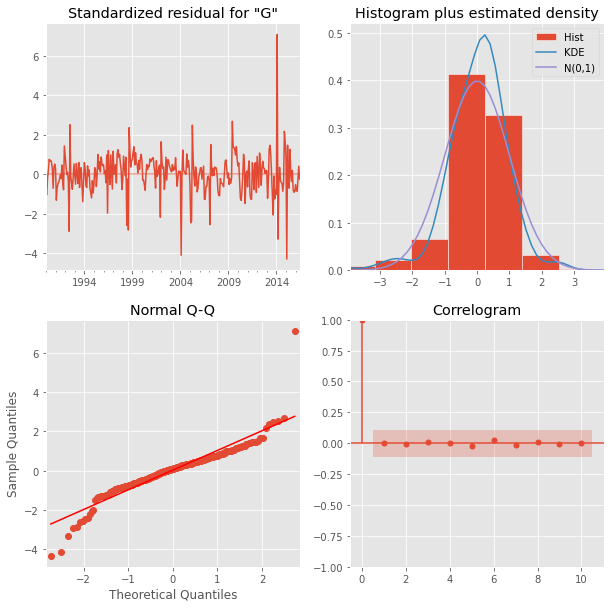

In [174]:
plt.figure(figsize=(8,8))
display(model.summary())
model.plot_diagnostics()
plt.show()

__With Auto Arima__

In [175]:
!pip install pmdarima

'pip' is not recognized as an internal or external command,
operable program or batch file.


In [176]:
from pmdarima.arima import auto_arima
arima_model = auto_arima(train_data_box_cox['Gas Consumption (tons)'], m=12, n_jobs=-1)
arima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  318
Model:             SARIMAX(1, 1, 1)x(1, 0, [], 12)   Log Likelihood                -632.820
Date:                             Fri, 11 Aug 2023   AIC                           1273.639
Time:                                     23:02:30   BIC                           1288.675
Sample:                                 01-01-1990   HQIC                          1279.645
                                      - 06-01-2016                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4220      0.045      9.363      0.000       0.334       0.510
ma.L1         -0.8976      0.037    -23.963      0.000      -0.971      -0.824
ar.S.L12      -0.1236      0.034     -3.649      0.000      -0.190      -0.057
sigma2         3.1617      0.130     24.355      0.000       2.907       3.416
===================================================================================
Ljung-Box (L1) (Q):                   0.12   Jarque-Bera (JB):              1291.32
Prob(Q):                              0.72   Prob(JB):                         0.00
Heteroskedasticity (H):               1.96   Skew:                             0.45
Prob(H) (two-sided):                  0.00   Kurtosis:                        12.85
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

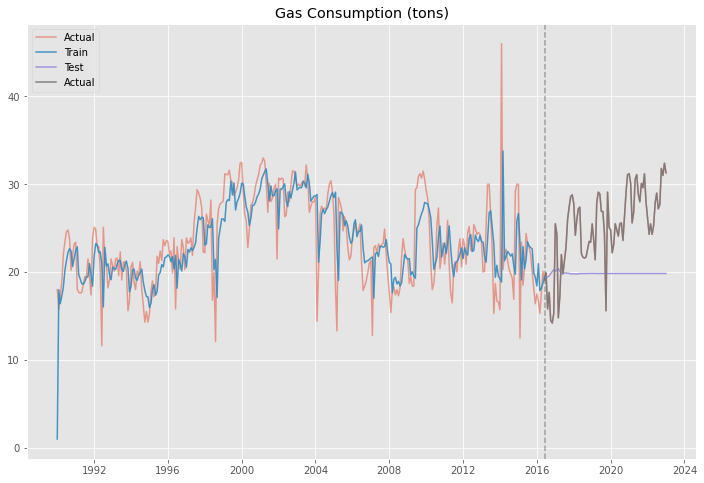

In [177]:
fig,ax = plt.subplots(1,1,figsize=(12,8))
model = SARIMAX(train_data_box_cox['Gas Consumption (tons)'], order=(1,1,1), seasonal_order=(1,0,0,12)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)
plot_forecast(ax,'Gas Consumption (tons)',invboxcox(df_set_date_box_cox,values[0]), invboxcox(full_pred,values[0]), invboxcox(pred,values[0]),train_data.index[-1] )
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the results above, 

- order (7,0,4) is a better fit as it provide forecast instead of just a flat forecast
-   We can see that it is indepndently distributed, hence it is a white noise time series
  - Residual does not have common variance
  - Data is not normal
  - Forecast is not nicely fit

</div>



#### SARIMA

Running the results

In [178]:
p_range = range(0,5)
q_range = range(0,5)
P_range = range(0,2)
Q_range = range(0,2)
m = [12]
scores_sarima_gc_ht = pd.DataFrame(columns = scores_num_cols_new)

for p, q, P, Q, m in tqdm(itertools.product(*(p_range, q_range, P_range, Q_range, m))):
    try:
        scores_sarima_gc_ht ,model = expanding_window(SARIMAX,train_data_box_cox['Gas Consumption (tons)'],f'Gas Consumption (tons) ({p},0,{q}) ({P},0,{Q},{m})',True, values[0], scores = scores_sarima_gc_ht, order = (p,0,q), seasonal_order=(P,0,Q,m))
    except:
        continue



100it [03:41,  2.21s/it]


Checking the result for top 5

In [179]:
style_result(scores_sarima_gc_ht.groupby('Consumption').mean().sort_values(by=['test_root_mean_squared_error']).head(10))


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Gas Consumption (tons) (3,0,1) (0,0,0,12)",3.199658,6.182025,0.104427,0.220403,587.897086,602.716377
"Gas Consumption (tons) (3,0,1) (0,0,1,12)",3.195257,6.205897,0.104257,0.221950,589.447579,607.230728
"Gas Consumption (tons) (3,0,1) (1,0,0,12)",3.196042,6.238605,0.104403,0.223223,589.476794,607.259943
"Gas Consumption (tons) (3,0,1) (1,0,1,12)",3.206032,6.304775,0.104628,0.220711,592.291711,613.038718
"Gas Consumption (tons) (2,0,3) (1,0,1,12)",3.198247,6.619915,0.105922,0.243491,592.876072,616.586938
"Gas Consumption (tons) (0,0,4) (1,0,1,12)",4.150258,6.700686,0.142943,0.234215,650.746589,671.493596
"Gas Consumption (tons) (4,0,2) (0,0,1,12)",3.219953,6.713736,0.104746,0.248335,598.103769,621.814635
"Gas Consumption (tons) (0,0,3) (1,0,1,12)",4.474803,6.766947,0.155263,0.237053,657.579589,675.362738
"Gas Consumption (tons) (2,0,3) (0,0,0,12)",3.183569,6.793530,0.104479,0.251979,587.717629,605.500778


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the results above, we can see that the best order are (3,0,1) (0,0,0,12)

</div>



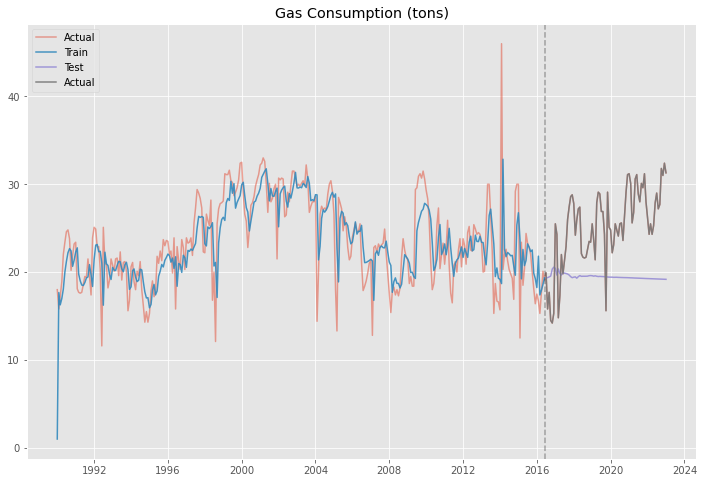

In [180]:
fig,ax = plt.subplots(1,1 ,  figsize=(12,8))
model = SARIMAX(train_data_box_cox['Gas Consumption (tons)'], order=(3,0,1),seasonal_order=(2,0,0,12)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)
plot_forecast(ax,'Gas Consumption (tons)',invboxcox(df_set_date_box_cox,values[0]), invboxcox(full_pred,values[0]), invboxcox(pred,values[0]),train_data.index[-1] )
plt.show()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:              Gas Consumption (tons)   No. Observations:                  318
Model:             SARIMAX(3, 0, 1)x(2, 0, [], 12)   Log Likelihood                -636.012
Date:                             Fri, 11 Aug 2023   AIC                           1286.023
Time:                                     23:06:14   BIC                           1312.358
Sample:                                 01-01-1990   HQIC                          1296.541
                                      - 06-01-2016                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4109      0.050     28.228      0.000       1.313       1.509
ar.L2         -0.3619      0.066     -5.502      0.000      -0.491      -0.233
ar.L3         -0.0491      0.062     -0.798      0.425      -0.170       0.071
ma.L1         -0.9075      0.044    -20.608      0.000      -0.994      -0.821
ar.S.L12      -0.1076      0.035     -3.065      0.002      -0.176      -0.039
ar.S.L24       0.0490      0.061      0.807      0.419      -0.070       0.168
sigma2         3.1451      0.128     24.484      0.000       2.893       3.397
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              1326.79
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):               1.99   Skew:                             0.49
Prob(H) (two-sided):                  0.00   Kurtosis:                        12.96
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

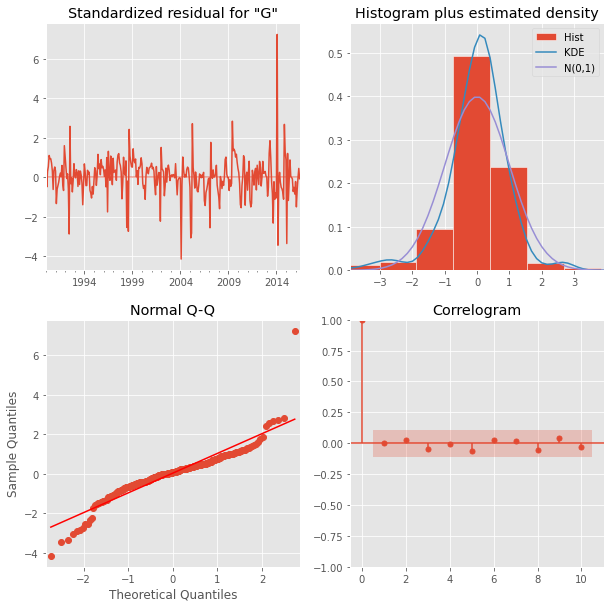

In [181]:
plt.figure(figsize=(8,8))
model.plot_diagnostics()
display(model.summary())
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the results above, 
  - We can see that it is indepndently distributed, hence it is a white noise time series
  - Residual does not have common variance
  - Data is not normal
  - Forecast is not nicely fit

</div>



#### Exponential Smoothing

In [182]:
trends = ['add', 'mul', None]
seasonals = ['add', 'mul', None]
seasonal_periods = [12, 24, 36]
scores_es_gc_ht = pd.DataFrame(columns=scores_num_cols_new)
for trend in tqdm(trends):
    for seasonal in tqdm(seasonals):
        for seasonal_period in (seasonal_periods):
            try:
                scores_es_gc_ht,model = expanding_window(ExponentialSmoothing, train_data_box_cox['Gas Consumption (tons)'], f'Gas Consumption (tons) ({trend}, {seasonal},{seasonal_period})', True, values[0], scores=scores_es_gc_ht, trend=trend
                                 , seasonal=seasonal, seasonal_periods=seasonal_period)
            except:
                continue


100%|██████████| 3/3 [00:09<00:00,  3.02s/it]


In [183]:
style_result(scores_es_gc_ht.groupby('Consumption').mean().sort_values(by=['AIC','BIC']).head(10))


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Gas Consumption (tons) (None, None,12)",2.881799,8.918660,0.098781,0.357038,134.686083,140.613799
"Gas Consumption (tons) (None, None,24)",2.881799,8.918660,0.098781,0.357038,134.686083,140.613799
"Gas Consumption (tons) (None, None,36)",2.881799,8.918660,0.098781,0.357038,134.686083,140.613799
"Gas Consumption (tons) (add, None,12)",2.880162,10.647216,0.098654,0.440780,138.471859,150.327291
"Gas Consumption (tons) (add, None,24)",2.880162,10.647216,0.098654,0.440780,138.471859,150.327291
"Gas Consumption (tons) (add, None,36)",2.880162,10.647216,0.098654,0.440780,138.471859,150.327291
"Gas Consumption (tons) (mul, None,12)",2.881404,9.724133,0.098720,0.388537,138.647221,150.502654
"Gas Consumption (tons) (mul, None,24)",2.881404,9.724133,0.098720,0.388537,138.647221,150.502654
"Gas Consumption (tons) (mul, None,36)",2.881404,9.724133,0.098720,0.388537,138.647221,150.502654


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the results above, we can see that the best combination are None,add, and 12

</div>



Additional evaluation on the smoothing level

In [184]:
model = ExponentialSmoothing(train_data_box_cox['Gas Consumption (tons)'],seasonal='add',seasonal_periods=12)
smoothing_levels = np.linspace(0.1, 10, 1000)
best = 0
score = 1000000
for level in smoothing_levels:
    model_fit = model.fit(smoothing_level = level)
    if model_fit.aic < score:
        score = model_fit.aic
        best = level
best

0.45675675675675675

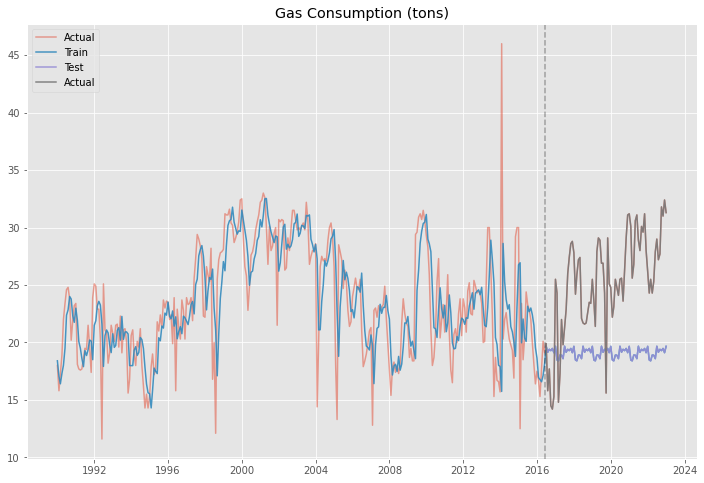

In [185]:
fig,ax = plt.subplots(1,1,figsize=(12,8))
model_fit = model.fit(smoothing_level=best)
full_pred = model_fit.predict(start = df_set_date_box_cox.index[0], end=df_set_date_box_cox.index[-1])
pred =  model_fit.predict(start = test_data_box_cox.index[0], end=test_data_box_cox.index[-1])
plot_forecast(ax,'Gas Consumption (tons)',invboxcox(df_set_date_box_cox,values[0]), invboxcox(full_pred,values[0]), invboxcox(pred,values[0]),train_data.index[-1] )
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the results above, we can see that the foreast does much the trend

</div>



### Electricity Consumption 

#### ARIMA

Running the results

In [186]:
scores_arima_ec_ht = pd.DataFrame(columns = scores_num_cols_new)
for p in tqdm(range(10)):
    for q in range(10):
        for d in range(2):
            try:
                scores_arima_ec_ht,model = expanding_window(ARIMA, train_data_box_cox['Electricity Consumption (MWh)'],f'Electricity Consumption (MWh) ({p},{d},{q})',True, values[1], order = (p,d,q),scores = scores_arima_ec_ht)
            except:
                pass


  0%|          | 0/10 [00:00<?, ?it/s]100%|██████████| 10/10 [05:53<00:00, 35.36s/it]


Checking the results for top 5

In [187]:
style_result(scores_arima_ec_ht.groupby('Consumption').mean().sort_values(by=['test_root_mean_squared_error']).head(10))


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Electricity Consumption (MWh) (5,1,7)",67.345381,76.512912,0.033983,0.068995,1654.311953,1692.740435
"Electricity Consumption (MWh) (8,1,7)",66.151803,77.243633,0.029434,0.070775,1625.714547,1673.011141
"Electricity Consumption (MWh) (2,1,5)",68.259526,77.621498,0.036076,0.070390,1661.710210,1685.358507
"Electricity Consumption (MWh) (2,1,7)",68.123036,77.944669,0.035890,0.072135,1662.374061,1691.934433
"Electricity Consumption (MWh) (7,1,9)",66.787636,78.049818,0.031896,0.070653,1649.513110,1699.765741
"Electricity Consumption (MWh) (8,1,6)",66.576925,78.243588,0.030460,0.072455,1632.815839,1677.156395
"Electricity Consumption (MWh) (5,1,5)",67.660701,78.364703,0.034322,0.072250,1651.914373,1684.430782
"Electricity Consumption (MWh) (9,1,6)",66.204679,78.410829,0.029652,0.072121,1619.098462,1666.395056
"Electricity Consumption (MWh) (9,1,8)",65.928615,78.628992,0.028775,0.072558,1618.092150,1671.300818


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the results above, best few

| p | d | q |
| ---    | ---                    | ---                | 
 | 5          | 1                 | 7                      |

</div>



With (8,1,7)

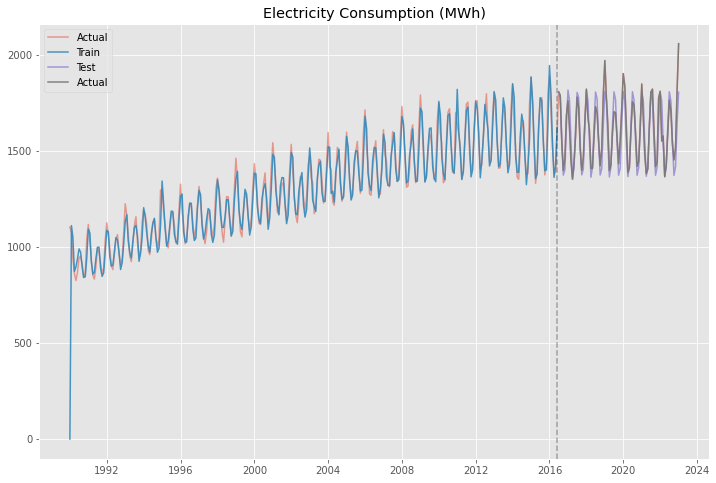

In [188]:
fig,ax = plt.subplots(1,1,figsize=(12,8))
model = ARIMA(train_data_box_cox['Electricity Consumption (MWh)'], order=(5,1,7)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)
plot_forecast(ax,'Electricity Consumption (MWh)',df_set_date_box_cox,full_pred,pred,train_data.index[-1] )
plt.show()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:     Electricity Consumption (MWh)   No. Observations:                  318
Model:                            ARIMA(5, 1, 7)   Log Likelihood               -1690.930
Date:                           Fri, 11 Aug 2023   AIC                           3407.859
Time:                                   23:12:31   BIC                           3456.725
Sample:                               01-01-1990   HQIC                          3427.379
                                    - 06-01-2016                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1397      0.729     -0.192      0.848      -1.569       1.289
ar.L2          0.1559      0.514      0.304      0.761      -0.851       1.162
ar.L3         -0.6175      0.181     -3.413      0.001      -0.972      -0.263
ar.L4         -0.5185      0.554     -0.937      0.349      -1.603       0.567
ar.L5          0.5377      0.685      0.785      0.433      -0.805       1.880
ma.L1         -0.0339      0.722     -0.047      0.963      -1.448       1.380
ma.L2         -0.4991      0.425     -1.173      0.241      -1.333       0.335
ma.L3          0.5557      0.237      2.347      0.019       0.092       1.020
ma.L4          0.2619      0.314      0.835      0.404      -0.353       0.877
ma.L5         -0.8756      0.406     -2.158      0.031      -1.671      -0.081
ma.L6         -0.0665      0.451     -0.147      0.883      -0.951       0.818
ma.L7          0.1080      0.318      0.340      0.734      -0.515       0.731
sigma2      3134.0451    435.725      7.193      0.000    2280.039    3988.051
===================================================================================
Ljung-Box (L1) (Q):                   0.68   Jarque-Bera (JB):                49.15
Prob(Q):                              0.41   Prob(JB):                         0.00
Heteroskedasticity (H):               1.98   Skew:                             0.30
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.84
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

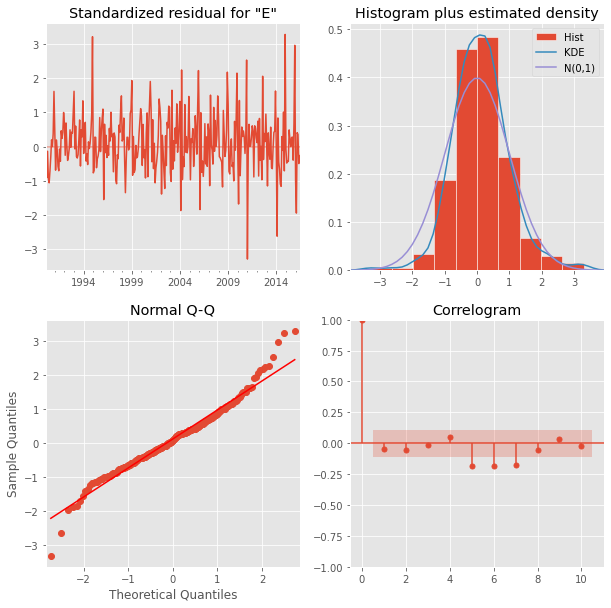

In [189]:
plt.figure(figsize=(8,8))
model.plot_diagnostics()
display(model.summary())
plt.show()

__With Auto Arima__

In [190]:
from pmdarima.arima import auto_arima
arima_model = auto_arima(train_data['Electricity Consumption (MWh)'], m=30, n_jobs=-1)
arima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  318
Model:             SARIMAX(3, 1, 1)x(2, 0, [], 30)   Log Likelihood               -1528.061
Date:                             Fri, 11 Aug 2023   AIC                           3070.123
Time:                                     23:17:47   BIC                           3096.435
Sample:                                 01-01-1990   HQIC                          3080.633
                                      - 06-01-2016                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5979      0.057     10.522      0.000       0.487       0.709
ar.L2         -0.2236      0.068     -3.271      0.001      -0.358      -0.090
ar.L3         -0.1134      0.067     -1.704      0.088      -0.244       0.017
ma.L1         -0.9089      0.031    -29.192      0.000      -0.970      -0.848
ar.S.L30       0.1292      0.037      3.522      0.000       0.057       0.201
ar.S.L60       0.7732      0.030     25.682      0.000       0.714       0.832
sigma2       726.7195     49.644     14.639      0.000     629.420     824.019
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                11.56
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               2.45   Skew:                             0.01
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

With (1,1,1)

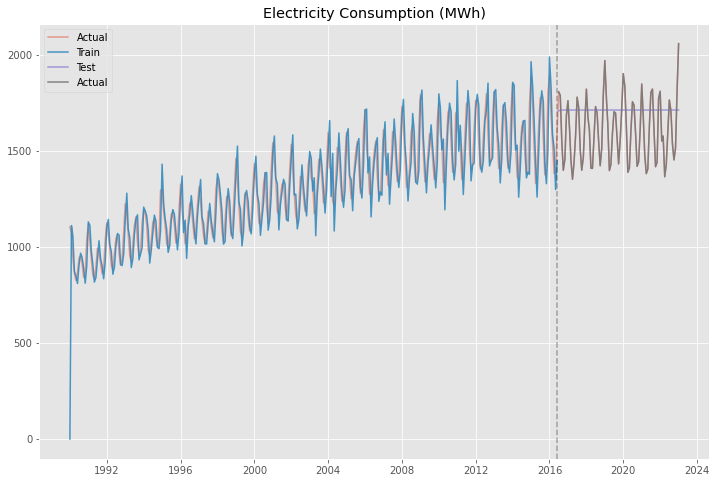

In [191]:
fig,ax = plt.subplots(1,1,figsize=(12,8))
model = ARIMA(train_data_box_cox['Electricity Consumption (MWh)'], order=(1,1,1)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)
plot_forecast(ax,'Electricity Consumption (MWh)',df_set_date_box_cox,full_pred,pred,train_data.index[-1] )
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the results above, 
- We can see that it is indepndently distributed, hence it is a white noise time series
- Residual does not have common variance
- Data is not normal
- Forecast is nicely fit

</div>



#### SARIMA

Running the results

In [192]:
p_range = range(0,5)
q_range = range(0,5)
P_range = range(0,2)
Q_range = range(0,2)
m = [12]
scores_sarima_ec_ht = pd.DataFrame(columns = scores_num_cols_new)

for p, q, P, Q, m in tqdm(itertools.product(*(p_range, q_range, P_range, Q_range, m))):
    try:
        scores_sarima_ec_ht ,model = expanding_window(SARIMAX,train_data_box_cox['Electricity Consumption (MWh)'],f'Electricity Consumption (MWh) ({p},0,{q}) ({P},0,{Q},{m})',True, values[1], scores = scores_sarima_ec_ht, order = (p,0,q), seasonal_order=(P,0,Q,m))
    except :
        continue



2it [00:00,  3.28it/s]100it [03:32,  2.12s/it]


Checking the result for top 5

In [193]:
style_result(scores_sarima_ec_ht.groupby('Consumption').mean().sort_values(by=['test_root_mean_squared_error','BIC']).head(10))


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Electricity Consumption (MWh) (1,0,4) (1,0,1,12)",65.984642,36.575346,0.029681,0.032345,1577.627593,1601.338459
"Electricity Consumption (MWh) (1,0,3) (1,0,1,12)",65.986927,37.838893,0.029797,0.033886,1581.725470,1602.472477
"Electricity Consumption (MWh) (4,0,0) (1,0,1,12)",66.251219,41.674583,0.030620,0.036891,1595.736383,1616.483390
"Electricity Consumption (MWh) (4,0,2) (1,0,1,12)",65.844098,51.026135,0.029202,0.046759,1585.640199,1612.314923
"Electricity Consumption (MWh) (3,0,0) (1,0,1,12)",66.624166,51.310804,0.031495,0.046996,1602.960232,1620.743381
"Electricity Consumption (MWh) (4,0,4) (1,0,1,12)",65.994277,58.619388,0.029264,0.050338,1593.952867,1626.555306
"Electricity Consumption (MWh) (3,0,4) (1,0,0,12)",66.956063,60.617844,0.032081,0.051589,1626.323583,1652.998307
"Electricity Consumption (MWh) (4,0,1) (1,0,1,12)",65.946029,67.282417,0.029840,0.064684,1591.822963,1615.533828
"Electricity Consumption (MWh) (3,0,1) (1,0,1,12)",66.351697,67.317213,0.030458,0.064313,1589.638518,1610.385525


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the results above, we can see that the best order are (1,0,4) (1,0,1,12) 

</div>



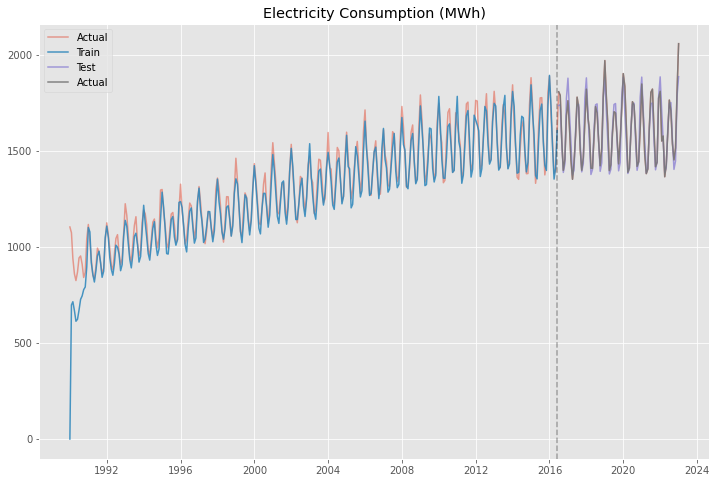

In [194]:
fig,ax = plt.subplots(1,1, figsize=(12,8))
model = SARIMAX(train_data_box_cox['Electricity Consumption (MWh)'], order=(1,0,4),seasonal_order=(1,0,1,12)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)
plot_forecast(ax,'Electricity Consumption (MWh)',df_set_date_box_cox,full_pred,pred,train_data.index[-1] )
plt.show()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:        Electricity Consumption (MWh)   No. Observations:                  318
Model:             SARIMAX(1, 0, 4)x(1, 0, [1], 12)   Log Likelihood               -1789.179
Date:                              Fri, 11 Aug 2023   AIC                           3594.358
Time:                                      23:21:22   BIC                           3624.455
Sample:                                  01-01-1990   HQIC                          3606.379
                                       - 06-01-2016                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9988      0.037     26.849      0.000       0.926       1.072
ma.L1         -0.5000      0.186     -2.682      0.007      -0.865      -0.135
ma.L2         -0.2549      0.305     -0.837      0.403      -0.852       0.342
ma.L3         -0.0774      0.192     -0.403      0.687      -0.454       0.299
ma.L4         -0.1638      0.237     -0.690      0.490      -0.629       0.302
ar.S.L12       0.9972      0.003    284.948      0.000       0.990       1.004
ma.S.L12      -0.3994      0.218     -1.834      0.067      -0.826       0.027
sigma2      8181.7932   1151.718      7.104      0.000    5924.468    1.04e+04
===================================================================================
Ljung-Box (L1) (Q):                   2.56   Jarque-Bera (JB):                40.04
Prob(Q):                              0.11   Prob(JB):                         0.00
Heteroskedasticity (H):               1.54   Skew:                            -0.40
Prob(H) (two-sided):                  0.03   Kurtosis:                         4.54
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

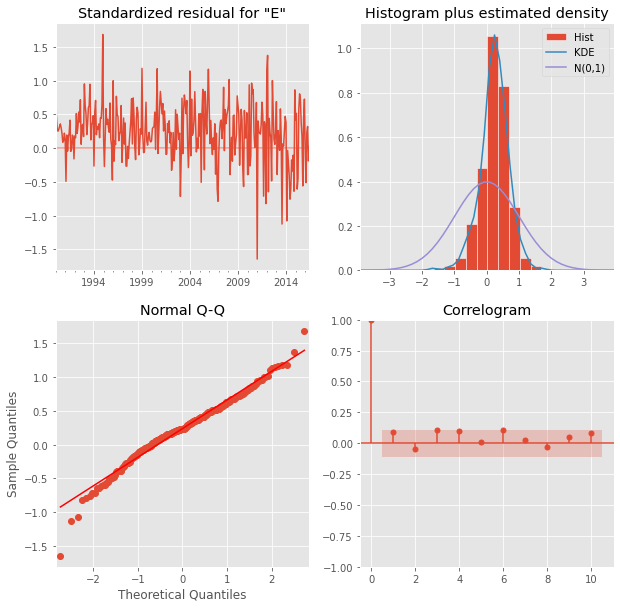

In [195]:
plt.figure(figsize=(8,8))
model.plot_diagnostics()
display(model.summary())
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From of the results above, 
- We can see that it is indepndently distributed, hence it is a white noise time series
- Residual does not have common variance
- Data is not normal
- Forecast is not nicely fit




</div>



#### Exponential Smoothing

In [196]:
trends = ['add', 'mul', None]
seasonals = ['add', 'mul', None]
seasonal_periods = [12, 24, 36]
scores_es_ec_ht = pd.DataFrame(columns=scores_num_cols_new)
for trend in tqdm(trends):
    for seasonal in tqdm(seasonals):
        for seasonal_period in (seasonal_periods):
            try:
                scores_es_ec_ht,model = expanding_window(ExponentialSmoothing, train_data_box_cox['Electricity Consumption (MWh)'], f'Electricity Consumption (MWh) ({trend}, {seasonal},{seasonal_period})', True, values[1], scores=scores_es_ec_ht, trend=trend
                                 , seasonal=seasonal, seasonal_periods=seasonal_period)
            except:
                continue


100%|██████████| 3/3 [00:08<00:00,  2.98s/it]


In [197]:
style_result(scores_es_gc_ht.groupby('Consumption').mean().sort_values(by=['test_root_mean_squared_error','BIC']).head(10))


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Gas Consumption (tons) (None, mul,24)",2.553163,8.410922,0.089164,0.326127,151.349071,228.409384
"Gas Consumption (tons) (None, mul,12)",2.738126,8.448668,0.095035,0.333779,145.255055,186.749069
"Gas Consumption (tons) (None, add,12)",2.732657,8.530302,0.095259,0.337425,144.538515,186.032529
"Gas Consumption (tons) (None, add,24)",2.519312,8.551686,0.087789,0.332464,147.228696,224.289009
"Gas Consumption (tons) (mul, add,24)",2.513695,8.647304,0.087614,0.313196,150.351981,233.340010
"Gas Consumption (tons) (mul, mul,24)",2.552874,8.789839,0.089166,0.343918,155.309476,238.297505
"Gas Consumption (tons) (mul, mul,12)",2.737854,8.895828,0.095071,0.351803,149.221057,196.642787
"Gas Consumption (tons) (None, None,12)",2.881799,8.918660,0.098781,0.357038,134.686083,140.613799
"Gas Consumption (tons) (None, None,24)",2.881799,8.918660,0.098781,0.357038,134.686083,140.613799


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the results above, we can see that the best combination are add,mul, and 24

</div>



Additional evaluation on the smoothing level

In [198]:
model = ExponentialSmoothing(train_data_box_cox['Electricity Consumption (MWh)'],seasonal='add',trend='add',seasonal_periods=24)
smoothing_levels = np.linspace(0.1, 10, 1000)
best = 0
score = 1000000
for level in smoothing_levels:
    model_fit = model.fit(smoothing_level = level)
    if model_fit.aic < score:
        score = model_fit.aic
        best = level
best

0.4270270270270271

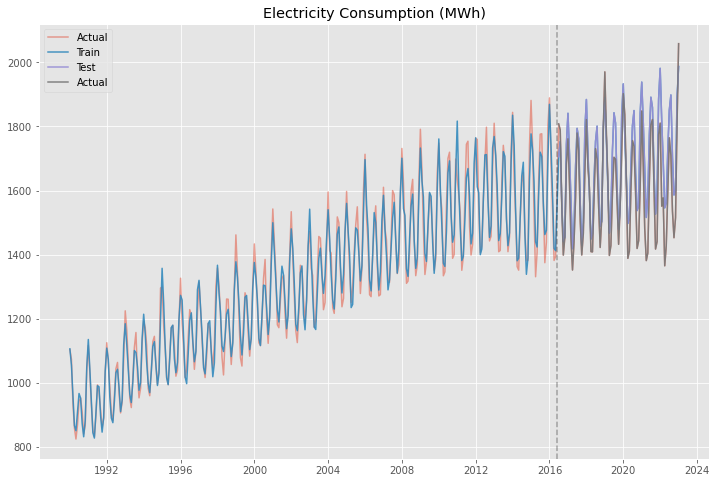

In [199]:
fig,ax = plt.subplots(1,1,figsize=(12,8))
model_fit = model.fit(smoothing_level=best)
full_pred = model_fit.predict(start = df_set_date_box_cox.index[0], end=df_set_date_box_cox.index[-1])
pred =  model_fit.predict(start = test_data_box_cox.index[0], end=test_data_box_cox.index[-1])
plot_forecast(ax,'Electricity Consumption (MWh)',df_set_date_box_cox,full_pred,pred,train_data.index[-1] )
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the results above, we can see that the foreast does much the trend

</div>



### Water Consumption 

#### ARIMA

Running the results

In [200]:
scores_arima_wc_ht = pd.DataFrame(columns = scores_num_cols_new)
for p in tqdm(range(10)):
    for q in range(10):
            scores_arima_wc_ht,model = expanding_window(ARIMA, train_data_box_cox['Water Consumption (tons)'],f'Water Consumption (tons) ({p},{d},{q})',True, values[2], order = (p,1,q),scores = scores_arima_wc_ht)


100%|██████████| 10/10 [02:33<00:00, 15.36s/it]


Checking the results for top 5

In [201]:
style_result(scores_arima_wc_ht.groupby('Consumption').mean().sort_values(by=['test_root_mean_squared_error']).head(10))


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Water Consumption (tons) (9,1,0)",104.354124,144.301457,0.185706,0.341017,1970.698516,2000.258887
"Water Consumption (tons) (0,1,2)",107.110897,146.478515,0.196084,0.342524,1962.704107,1971.572218
"Water Consumption (tons) (6,1,7)",99.762853,147.582971,0.181866,0.348555,1965.524042,2006.908561
"Water Consumption (tons) (4,1,0)",107.814941,150.013496,0.196221,0.359771,1969.779210,1984.559396
"Water Consumption (tons) (3,1,0)",108.723643,150.319476,0.200277,0.360663,1971.452999,1983.277147
"Water Consumption (tons) (6,1,5)",102.968003,150.325271,0.187174,0.370963,1969.880370,2005.352815
"Water Consumption (tons) (0,1,1)",107.754206,150.358621,0.199437,0.356953,1963.164936,1969.077010
"Water Consumption (tons) (7,1,0)",107.052538,150.422958,0.193797,0.355779,1973.103552,1996.751849
"Water Consumption (tons) (5,1,0)",107.605160,151.645917,0.196168,0.360143,1970.804221,1988.540444


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the results above, best few

| p | d | q |
| ---    | ---                    | ---                | 
 | 9                     | 1                  | 0                   |

</div>



With (9,1,0)

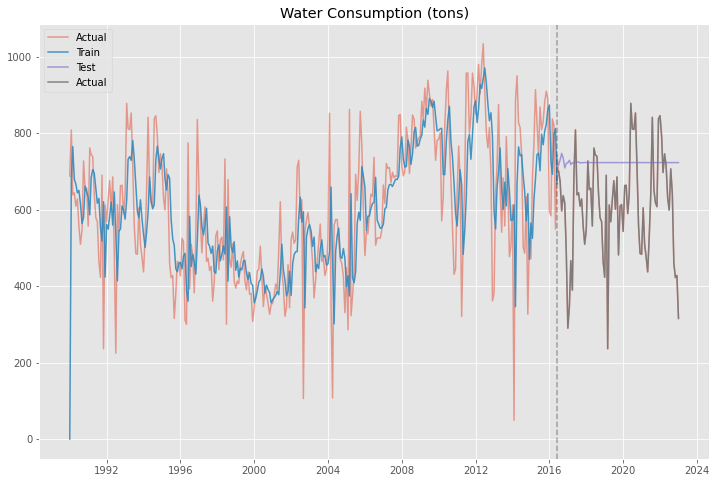

In [202]:
fig,ax = plt.subplots(1,1,figsize=(12,8))
model = ARIMA(train_data_box_cox['Water Consumption (tons)'], order=(9,1,0)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)
plot_forecast(ax,'Water Consumption (tons)',df_set_date_box_cox,full_pred,pred,train_data.index[-1] )
plt.show()

__With Auto Arima__

In [203]:
from pmdarima.arima import auto_arima
arima_model = auto_arima(train_data['Water Consumption (tons)'], m=30, n_jobs=-1)
arima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  318
Model:             SARIMAX(1, 1, 1)x(0, 0, 1, 30)   Log Likelihood               -1918.972
Date:                            Fri, 11 Aug 2023   AIC                           3845.944
Time:                                    23:25:58   BIC                           3860.979
Sample:                                01-01-1990   HQIC                          3851.950
                                     - 06-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3683      0.051      7.258      0.000       0.269       0.468
ma.L1         -0.9036      0.027    -33.258      0.000      -0.957      -0.850
ma.S.L30      -0.1548      0.060     -2.568      0.010      -0.273      -0.037
sigma2      1.055e+04    660.767     15.964      0.000    9253.189    1.18e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.16   Jarque-Bera (JB):                80.07
Prob(Q):                              0.69   Prob(JB):                         0.00
Heteroskedasticity (H):               1.34   Skew:                            -0.33
Prob(H) (two-sided):                  0.13   Kurtosis:                         5.37
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

With (1,1,1)

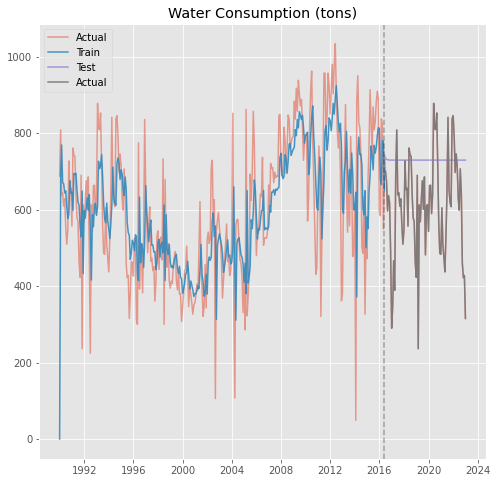

In [204]:
fig,ax = plt.subplots(1,1,figsize=(8,8))
model = ARIMA(train_data_box_cox['Water Consumption (tons)'], order=(1,1,1)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)
plot_forecast(ax,'Water Consumption (tons)',df_set_date_box_cox,full_pred,pred,train_data.index[-1] )
plt.show()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                  SARIMAX Results                                   
====================================================================================
Dep. Variable:     Water Consumption (tons)   No. Observations:                  318
Model:                       ARIMA(1, 1, 1)   Log Likelihood               -2003.477
Date:                      Fri, 11 Aug 2023   AIC                           4012.955
Time:                              23:25:59   BIC                           4024.231
Sample:                          01-01-1990   HQIC                          4017.459
                               - 06-01-2016                                         
Covariance Type:                        opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3969      0.050      7.918      0.000       0.299       0.495
ma.L1         -0.9161      0.026    -34.811      0.000      -0.968      -0.864
sigma2      1.802e+04   1000.166     18.014      0.000    1.61e+04       2e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.17   Jarque-Bera (JB):                97.24
Prob(Q):                              0.68   Prob(JB):                         0.00
Heteroskedasticity (H):               1.34   Skew:                            -0.30
Prob(H) (two-sided):                  0.13   Kurtosis:                         5.65
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

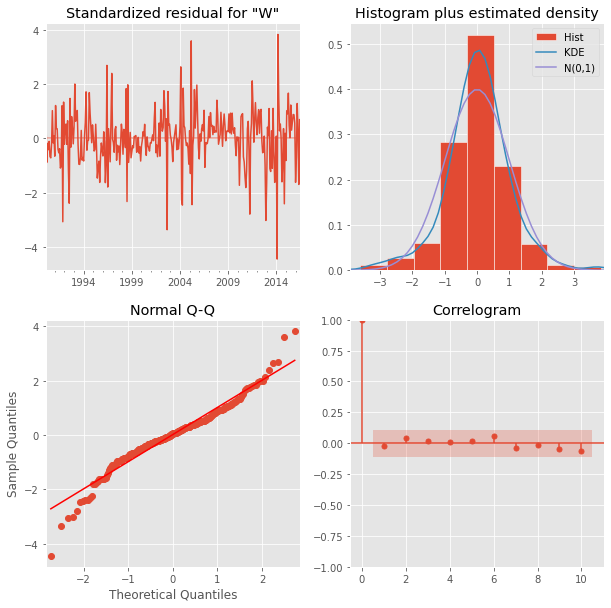

In [205]:
plt.figure(figsize=(8,8))
model.plot_diagnostics()
display(model.summary())
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the results above,
- We can see that it is indepndently distributed, hence it is a white noise time series
- Residual does not have common variance
- Data is not normal
- Forecast is not nicely fit






</div>



#### SARIMA

Running the results

In [206]:
p_range = range(0,5)
q_range = range(0,5)
P_range = range(0,2)
Q_range = range(0,2)
m = [12]
scores_sarima_wc_ht = pd.DataFrame(columns = scores_num_cols_new)

for p, q, P, Q, m in tqdm(itertools.product(*(p_range, q_range, P_range, Q_range, m))):
    try:
        scores_sarima_wc_ht ,model = expanding_window(SARIMAX,train_data_box_cox['Water Consumption (tons)'],f'Water Consumption (tons) ({p},0,{q}) ({P},0,{Q},{m})',True, values[1], scores = scores_sarima_wc_ht, order = (p,0,q), seasonal_order=(P,0,Q,m))
    except :
        continue



2it [00:00,  5.99it/s]100it [03:02,  1.82s/it]


Checking the result for top 5

In [207]:
style_result(scores_sarima_wc_ht.groupby('Consumption').mean().sort_values(by=['test_root_mean_squared_error','BIC']).head(10))


,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Water Consumption (tons) (1,0,2) (0,0,0,12)",89.500875,121.582185,0.188037,0.306120,1980.425380,1992.280813
"Water Consumption (tons) (4,0,4) (0,0,1,12)",87.239623,121.607374,0.183533,0.302567,1984.479135,2014.117716
"Water Consumption (tons) (4,0,4) (1,0,0,12)",87.529318,121.987643,0.185339,0.299613,1986.065770,2015.704352
"Water Consumption (tons) (1,0,3) (1,0,1,12)",88.472197,122.236327,0.184627,0.312618,1982.197632,2002.944640
"Water Consumption (tons) (3,0,3) (0,0,0,12)",88.567573,122.587722,0.188627,0.295768,1984.278839,2005.025846
"Water Consumption (tons) (1,0,2) (0,0,1,12)",89.463748,123.022934,0.187682,0.307615,1982.247543,1997.066834
"Water Consumption (tons) (2,0,3) (1,0,1,12)",88.069754,123.058587,0.183121,0.315309,1982.529974,2006.240840
"Water Consumption (tons) (3,0,1) (1,0,1,12)",88.118712,123.091516,0.183164,0.310631,1980.878080,2001.625088
"Water Consumption (tons) (3,0,3) (1,0,0,12)",87.778214,123.502678,0.186815,0.320381,1982.116167,2005.827032


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the results above, we can see that the best order are (1,0,2) (0,0,0,12) 

</div>



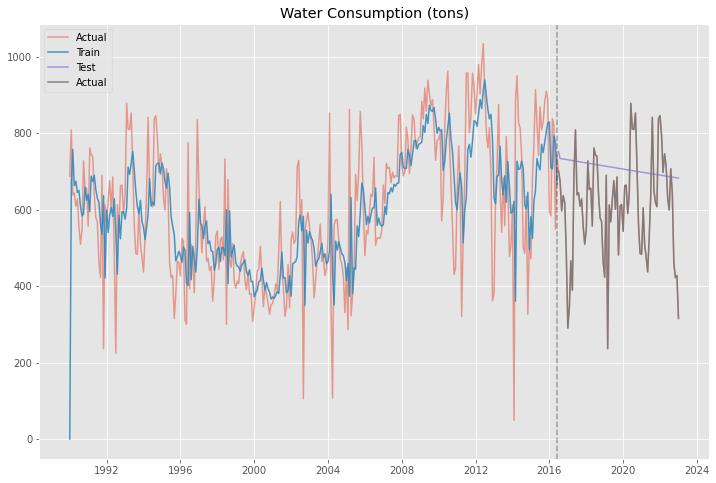

In [208]:
fig, ax = plt.subplots(1, 1,figsize=(12,8))
model = SARIMAX(train_data_box_cox['Water Consumption (tons)'], order=(
    1, 0, 2), seasonal_order=(0, 0, 0, 12)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)
plot_forecast(ax, 'Water Consumption (tons)', df_set_date_box_cox,
              full_pred, pred, train_data.index[-1])
plt.show()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                  SARIMAX Results                                   
====================================================================================
Dep. Variable:     Water Consumption (tons)   No. Observations:                  318
Model:                     SARIMAX(1, 0, 2)   Log Likelihood               -2014.453
Date:                      Fri, 11 Aug 2023   AIC                           4036.906
Time:                              23:29:03   BIC                           4051.955
Sample:                          01-01-1990   HQIC                          4042.917
                               - 06-01-2016                                         
Covariance Type:                        opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9991      0.003    377.773      0.000       0.994       1.004
ma.L1         -0.5520      0.037    -14.813      0.000      -0.625      -0.479
ma.L2         -0.2303      0.044     -5.250      0.000      -0.316      -0.144
sigma2      1.838e+04   1059.829     17.340      0.000    1.63e+04    2.05e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.23   Jarque-Bera (JB):                83.67
Prob(Q):                              0.64   Prob(JB):                         0.00
Heteroskedasticity (H):               1.33   Skew:                            -0.22
Prob(H) (two-sided):                  0.14   Kurtosis:                         5.47
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

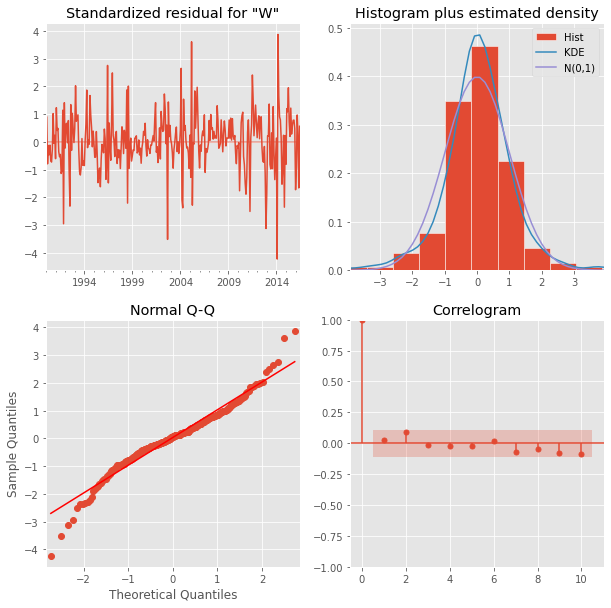

In [209]:
plt.figure(figsize=(8,8))
model.plot_diagnostics()
display(model.summary())
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From both of the results above,
- We can see that it is indepndently distributed, hence it is a white noise time series
- Residual does not have common variance
- Data is not normal
- Forecast is not nicely fit






</div>



#### Exponential Smoothing

In [210]:
trends = ['add', 'mul', None]
seasonals = ['add', 'mul', None]
seasonal_periods = [12, 24, 36]
scores_es_wc_ht = pd.DataFrame(columns=scores_num_cols_new)
for trend in tqdm(trends):
    for seasonal in tqdm(seasonals):
        for seasonal_period in (seasonal_periods):
            try:
                scores_es_wc_ht,model = expanding_window(ExponentialSmoothing, train_data_box_cox['Water Consumption (tons)'], f'Water Consumption (tons) ({trend}, {seasonal},{seasonal_period})', True, values[2], scores=scores_es_wc_ht, trend=trend
                                 , seasonal=seasonal, seasonal_periods=seasonal_period)
            except:
                continue


100%|██████████| 3/3 [00:08<00:00,  2.81s/it]


In [211]:
style_result(scores_es_wc_ht.groupby('Consumption').mean().sort_values(by=['test_root_mean_squared_error']).head(10))

,train_root_mean_squared_error,test_root_mean_squared_error,train_mean_absolute_percentage_error,test_mean_absolute_percentage_error,AIC,BIC
Consumption,,,,,,
"Water Consumption (tons) (None, add,12)",91.957883,146.824196,0.179259,0.335799,1542.807334,1584.301348
"Water Consumption (tons) (None, None,12)",96.425250,149.890279,0.191697,0.355278,1525.775861,1531.703577
"Water Consumption (tons) (None, None,24)",96.425250,149.890279,0.191697,0.355278,1525.775861,1531.703577
"Water Consumption (tons) (None, None,36)",96.425250,149.890279,0.191697,0.355278,1525.775861,1531.703577
"Water Consumption (tons) (None, mul,12)",91.120292,150.550099,0.177657,0.352012,1539.321971,1580.815986
"Water Consumption (tons) (None, mul,36)",83.358811,154.293417,0.166765,0.348204,1560.126420,1672.753031
"Water Consumption (tons) (None, mul,24)",85.770934,154.511052,0.170063,0.346838,1549.013408,1626.073721
"Water Consumption (tons) (None, add,36)",83.814661,159.100979,0.165333,0.344659,1561.536282,1674.162893
"Water Consumption (tons) (None, add,24)",85.759371,159.407746,0.171326,0.357003,1550.706275,1627.766587


<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the results above, we can see that the best combination are None,mul, and 12

</div>



Additional evaluation on the smoothing level

In [212]:
model = ExponentialSmoothing(train_data_box_cox['Water Consumption (tons)'],seasonal='add',seasonal_periods=12)
smoothing_levels = np.linspace(0.1, 10, 1000)
best = 0
score = 1000000
for level in smoothing_levels:
    model_fit = model.fit(smoothing_level = level)
    if model_fit.aic < score:
        score = model_fit.aic
        best = level
best

0.436936936936937

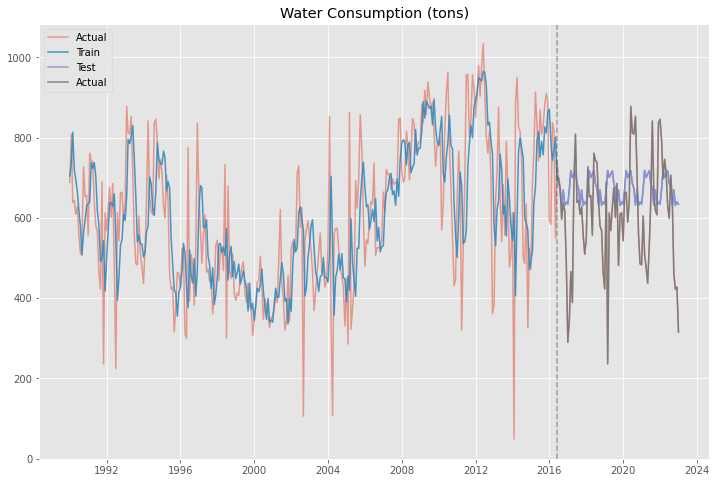

In [213]:
fig,ax = plt.subplots(1,1 , figsize=(12,8))
model_fit = model.fit(smoothing_level=best)
full_pred = model_fit.predict(start = df_set_date_box_cox.index[0], end=df_set_date_box_cox.index[-1])
pred =  model_fit.predict(start = test_data_box_cox.index[0], end=test_data_box_cox.index[-1])
plot_forecast(ax,'Water Consumption (tons)',df_set_date_box_cox,full_pred,pred,train_data.index[-1] )
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the results above, we can see that the foreast does much the trend

</div>



## <font color='#71a1e3'> __Final Model__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">

Here we will collate the best model for the 3 different variables

### Gas Consumption

From the above results, the best univariate model is arima (7,0,4)

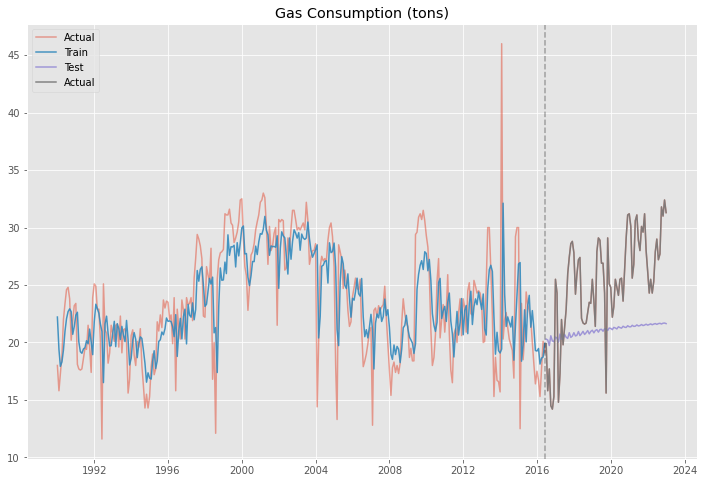

In [214]:
fig,ax = plt.subplots(1,1,figsize=(12,8))
model = ARIMA(train_data_box_cox['Gas Consumption (tons)'], order=(7,0,4)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)
plot_forecast(ax,'Gas Consumption (tons)',invboxcox(df_set_date_box_cox,values[0]), invboxcox(full_pred,values[0]), invboxcox(pred,values[0]),train_data.index[-1] )
plt.show()

In [215]:
print('Evaluation')
evluation_2('Gas Consumption (tons)',invboxcox(test_data_box_cox['Gas Consumption (tons)'],values[0]),invboxcox(pred,values[0]), 'test',model)

Evaluation


{'Consumption': 'Gas Consumption (tons)',
 'test_root_mean_squared_error': 5.813337695478132,
 'test_mean_absolute_percentage_error': 0.19821086146961947,
 'AIC': 1287.0340960349,
 'BIC': 1335.9407640110421}

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 SARIMAX Results                                  
==================================================================================
Dep. Variable:     Gas Consumption (tons)   No. Observations:                  318
Model:                     ARIMA(7, 0, 4)   Log Likelihood                -630.517
Date:                    Fri, 11 Aug 2023   AIC                           1287.034
Time:                            23:29:21   BIC                           1335.941
Sample:                        01-01-1990   HQIC                          1306.568
                             - 06-01-2016                                         
Covariance Type:                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.1197      1.045     12.549      0.000      11.071      15.169
ar.L1         -0.6501      0.115     -5.630      0.000      -0.876      -0.424
ar.L2          0.5465      0.126      4.352      0.000       0.300       0.793
ar.L3          1.0748      0.113      9.475      0.000       0.852       1.297
ar.L4          0.3773      0.129      2.917      0.004       0.124       0.631
ar.L5         -0.4718      0.110     -4.302      0.000      -0.687      -0.257
ar.L6         -0.0450      0.087     -0.518      0.605      -0.215       0.125
ar.L7          0.1076      0.079      1.367      0.172      -0.047       0.262
ma.L1          1.1469      0.118      9.733      0.000       0.916       1.378
ma.L2          0.1551      0.133      1.164      0.244      -0.106       0.416
ma.L3         -0.8935      0.135     -6.595      0.000      -1.159      -0.628
ma.L4         -0.8072      0.115     -7.001      0.000      -1.033      -0.581
sigma2         3.0652      0.183     16.763      0.000       2.707       3.424
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              1191.36
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               1.94   Skew:                             0.34
Prob(H) (two-sided):                  0.00   Kurtosis:                        12.46
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

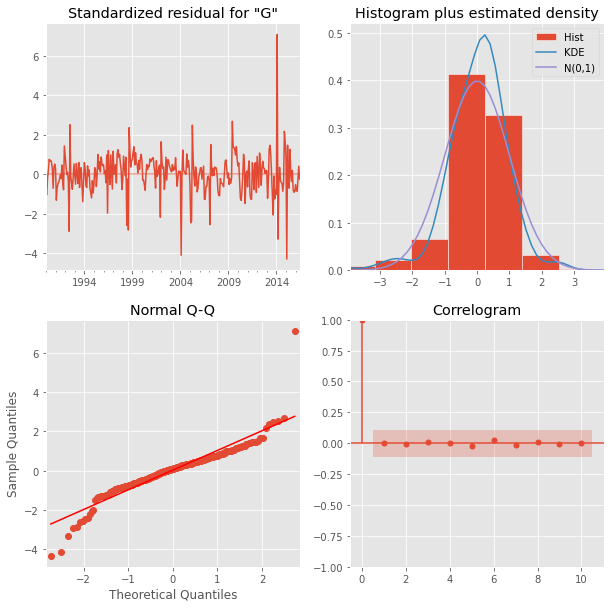

In [216]:
plt.figure(figsize=(8,8))
display(model.summary())
model.plot_diagnostics()
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the results above,
- ARIMA(7,0,4)
 - RMSE is 5.79, MAPE is 0.20, AIC is 585 and BIC is 620
- Independently distributed, hence it is a white noise time series
- Residual does not have common variance
- Data is not normal
- Forecast is not nicely fit


</div>



### Electricity Consumption

From the above results, the best univariate model is ARIMA (5,1,7)

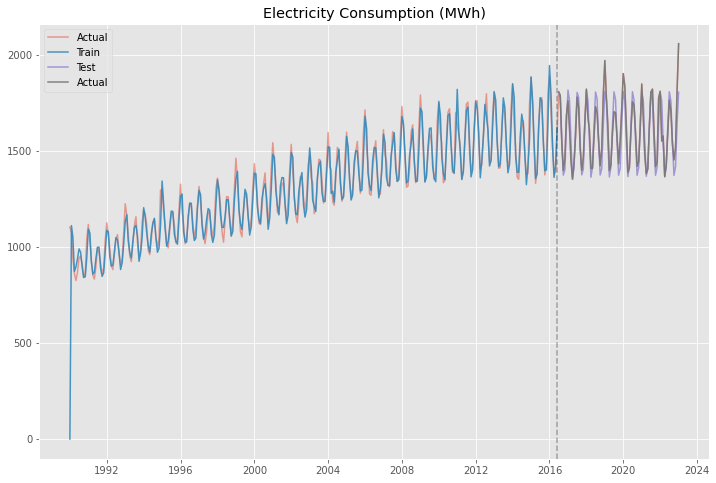

In [217]:
fig,ax = plt.subplots(1,1,figsize=(12,8))
model = ARIMA(train_data_box_cox['Electricity Consumption (MWh)'], order=(5,1,7)).fit()
full_pred = model.predict()
pred = model.forecast(test_sizes)
plot_forecast(ax,'Electricity Consumption (MWh)',df_set_date_box_cox,full_pred,pred,train_data.index[-1] )
plt.show()

In [218]:
print('Evaluation')
evluation_2('Electricity Consumption (MWh)',invboxcox(test_data_box_cox['Electricity Consumption (MWh)'],values[1]),invboxcox(pred,values[1]), 'test',model)

Evaluation


{'Consumption': 'Electricity Consumption (MWh)',
 'test_root_mean_squared_error': 44.26304330217497,
 'test_mean_absolute_percentage_error': 0.031837577846325286,
 'AIC': 3407.859474486933,
 'BIC': 3456.7251975473373}

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:     Electricity Consumption (MWh)   No. Observations:                  318
Model:                            ARIMA(5, 1, 7)   Log Likelihood               -1690.930
Date:                           Fri, 11 Aug 2023   AIC                           3407.859
Time:                                   23:29:23   BIC                           3456.725
Sample:                               01-01-1990   HQIC                          3427.379
                                    - 06-01-2016                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1397      0.729     -0.192      0.848      -1.569       1.289
ar.L2          0.1559      0.514      0.304      0.761      -0.851       1.162
ar.L3         -0.6175      0.181     -3.413      0.001      -0.972      -0.263
ar.L4         -0.5185      0.554     -0.937      0.349      -1.603       0.567
ar.L5          0.5377      0.685      0.785      0.433      -0.805       1.880
ma.L1         -0.0339      0.722     -0.047      0.963      -1.448       1.380
ma.L2         -0.4991      0.425     -1.173      0.241      -1.333       0.335
ma.L3          0.5557      0.237      2.347      0.019       0.092       1.020
ma.L4          0.2619      0.314      0.835      0.404      -0.353       0.877
ma.L5         -0.8756      0.406     -2.158      0.031      -1.671      -0.081
ma.L6         -0.0665      0.451     -0.147      0.883      -0.951       0.818
ma.L7          0.1080      0.318      0.340      0.734      -0.515       0.731
sigma2      3134.0451    435.725      7.193      0.000    2280.039    3988.051
===================================================================================
Ljung-Box (L1) (Q):                   0.68   Jarque-Bera (JB):                49.15
Prob(Q):                              0.41   Prob(JB):                         0.00
Heteroskedasticity (H):               1.98   Skew:                             0.30
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.84
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Figure size 576x576 with 0 Axes>

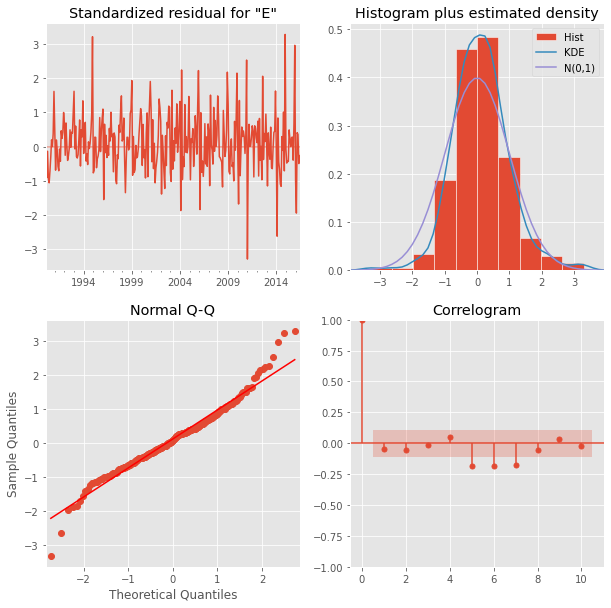

In [219]:
plt.figure(figsize=(8,8))
model.plot_diagnostics()
display(model.summary())
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>

From the results above,
- ARIMA(5,1,7)
 - RMSE 44 MAPE 0.03, AIC 3487, BIC: 3456
- Independently distributed, hence it is a white noise time series
- Residual does not have common variance
- Data is not normal
- Forecast is nicely fit


</div>



### Water Consumption

From the above results, the best univariate model is Exponential Smoothing

In [220]:
model = ExponentialSmoothing(train_data_box_cox['Water Consumption (tons)'],seasonal='add',seasonal_periods=12)
smoothing_levels = np.linspace(0.1, 10, 1000)
best = 0
score = 1000000
for level in smoothing_levels:
    model_fit = model.fit(smoothing_level = level)
    if model_fit.aic < score:
        score = model_fit.aic
        best = level
best

0.436936936936937

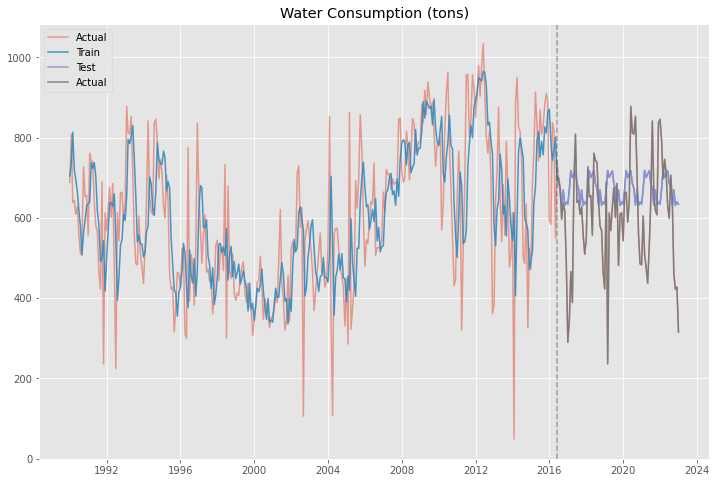

In [221]:
fig,ax = plt.subplots(1,1 , figsize=(12,8))
model_fit = model.fit(smoothing_level=best)
full_pred = model_fit.predict(start = df_set_date_box_cox.index[0], end=df_set_date_box_cox.index[-1])
pred =  model_fit.predict(start = test_data_box_cox.index[0], end=test_data_box_cox.index[-1])
plot_forecast(ax,'Water Consumption (tons)',df_set_date_box_cox,full_pred,pred,train_data.index[-1] )
plt.show()

<div class="alert alert-block" style="background-color:#a7c6d6; padding: 10px; border: 3px solid lightblue; border-radius: 5px; color:black">
<u><b><i>Things Observed</i></b></u>
From the results above,
- None, add,12
- RMSE is 146, MAPE is 0.33, AIC is 1542 and BIC is 1584

## <font color='#71a1e3'> __Conclusion__</font>
<hr style="height:1.5px;border-width:0;background-color: #4c8c77">


Univariate time series did not exactly provide a good forecast for gas consumption and water consumption, let's see if multivariate can do that

From all the previous model, it is all univariate, is there a possibility that any of the variables are correlate with the other variable. Or in other words, could it have a variable that is a x variable and the other is a y variable ?